In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score
from statsmodels.tsa.seasonal import seasonal_decompose


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
combined_df = pd.read_csv("./final_data.csv")

In [4]:
combined_df

,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,0.096000,2014,4
1,25+,Total,Norway,0.028000,2014,10
2,25+,Male,Iceland,0.052000,2021,1
3,25+,Male,Iceland,0.049000,2021,2
4,25+,Male,Iceland,0.048000,2021,3
...,...,...,...,...,...,...
30822,25+,Total,United States of America,0.058255,2014,1
30823,15-24,Male,United States of America,0.164923,2014,1
30824,25+,Male,United States of America,0.062145,2014,1
30825,15-24,Female,United States of America,0.133269,2014,1


## Common part

17:19:04 - cmdstanpy - INFO - Chain [1] start processing
17:19:04 - cmdstanpy - INFO - Chain [1] done processing


Validation MAE: 0.0252
Validation RMSE: 0.0285
Validation MAPE: 18.78%
Validation R^2: -0.9460
Test MAE: 0.0205
Test RMSE: 0.0256
Test MAPE: 17.35%
Test R^2: -2.1513


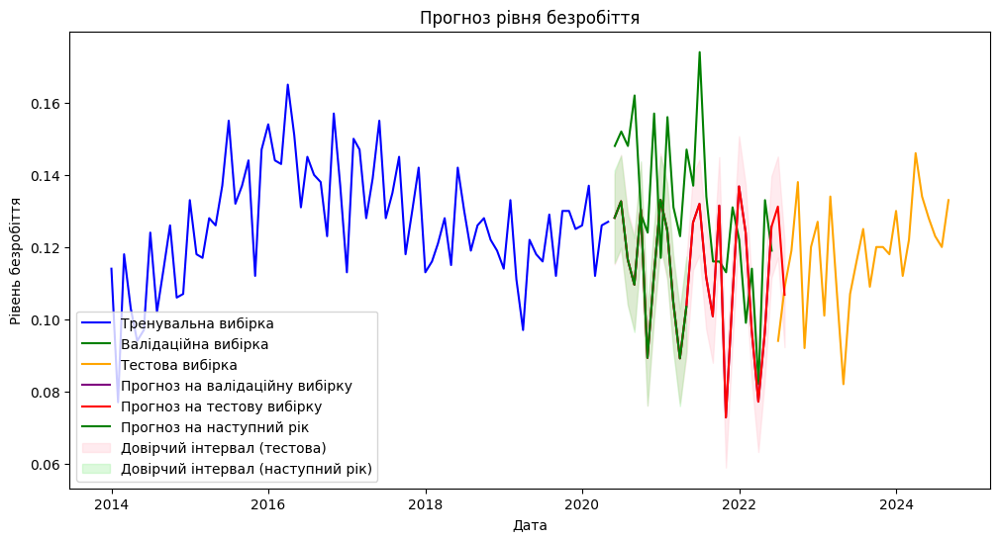

In [60]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Завантаження та підготовка даних
df = data_filtered
df.rename(columns={'date': 'ds', 'unemployment_rate': 'y'}, inplace=True)
df['ds'] = pd.to_datetime(df['ds'])

# Поділ на тренувальний (60%), валідаційний (20%) і тестовий (20%) набори
train_size = int(len(df) * 0.6)
val_size = int(len(df) * 0.2)
train_df = df[:train_size]  # Тренувальна вибірка
val_df = df[train_size:train_size + val_size]  # Валідаційна вибірка
test_df = df[train_size + val_size:]  # Тестова вибірка

# Створення та навчання моделі на тренувальній вибірці
model = Prophet(yearly_seasonality=True)  # Тут можна налаштовувати гіперпараметри, наприклад, сезонність
model.fit(train_df)

# Прогнозування на валідаційну вибірку для оцінки гіперпараметрів
future_val = model.make_future_dataframe(periods=len(val_df), freq='M')
forecast_val = model.predict(future_val)

# Виділення прогнозу для валідаційного періоду
val_forecast = forecast_val[-len(val_df):]

# Обчислення метрик на валідаційній вибірці
val_y_true = val_df['y'].values
val_y_pred = val_forecast['yhat'].values

val_mae = mean_absolute_error(val_y_true, val_y_pred)
val_rmse = np.sqrt(mean_squared_error(val_y_true, val_y_pred))
val_mape = np.mean(np.abs((val_y_true - val_y_pred) / val_y_true)) * 100
val_r2 = r2_score(val_y_true, val_y_pred)

print(f'Validation MAE: {val_mae:.4f}')
print(f'Validation RMSE: {val_rmse:.4f}')
print(f'Validation MAPE: {val_mape:.2f}%')
print(f'Validation R^2: {val_r2:.4f}')

# Оцінка на тестовій вибірці
future_test = model.make_future_dataframe(periods=len(test_df), freq='M')
forecast_test = model.predict(future_test)

# Виділення прогнозу для тестового періоду
test_forecast = forecast_test[-len(test_df):]

# Обчислення метрик на тестовій вибірці
test_y_true = test_df['y'].values
test_y_pred = test_forecast['yhat'].values

test_mae = mean_absolute_error(test_y_true, test_y_pred)
test_rmse = np.sqrt(mean_squared_error(test_y_true, test_y_pred))
test_mape = np.mean(np.abs((test_y_true - test_y_pred) / test_y_true)) * 100
test_r2 = r2_score(test_y_true, test_y_pred)

print(f'Test MAE: {test_mae:.4f}')
print(f'Test RMSE: {test_rmse:.4f}')
print(f'Test MAPE: {test_mape:.2f}%')
print(f'Test R^2: {test_r2:.4f}')

# Прогноз на наступний рік (12 місяців) після тестового періоду
future_year = model.make_future_dataframe(periods=12, freq='M', include_history=False)
forecast_year = model.predict(future_year)

# Візуалізація прогнозу разом із тренувальними, валідаційними та тестовими даними
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], label='Тренувальна вибірка', color='blue')
plt.plot(val_df['ds'], val_df['y'], label='Валідаційна вибірка', color='green')
plt.plot(test_df['ds'], test_df['y'], label='Тестова вибірка', color='orange')
plt.plot(val_forecast['ds'], val_forecast['yhat'], label='Прогноз на валідаційну вибірку', color='purple')
plt.plot(test_forecast['ds'], test_forecast['yhat'], label='Прогноз на тестову вибірку', color='red')
plt.plot(forecast_year['ds'], forecast_year['yhat'], label='Прогноз на наступний рік', color='green')
plt.fill_between(test_forecast['ds'], test_forecast['yhat_lower'], test_forecast['yhat_upper'], color='pink', alpha=0.3, label='Довірчий інтервал (тестова)')
plt.fill_between(forecast_year['ds'], forecast_year['yhat_lower'], forecast_year['yhat_upper'], color='lightgreen', alpha=0.3, label='Довірчий інтервал (наступний рік)')

plt.title('Прогноз рівня безробіття')
plt.xlabel('Дата')
plt.ylabel('Рівень безробіття')
plt.legend()
plt.show()


In [5]:
from pmdarima import auto_arima
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
import math

def prepare_data(combined_df, country, age, sex):
    # Filter the data based on provided country, age, and sex
    data_filtered = combined_df[
        (combined_df['Country'] == country) &
        (combined_df['Age'] == age) &
        (combined_df['Sex'] == sex)
    ].copy()

    # Prepare the Date column
    data_filtered['Date'] = pd.to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')

    # Drop unnecessary columns and set the index
    data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
    data_filtered.set_index('Date', inplace=True)
    data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
    data_filtered = data_filtered.sort_values(by='Date')

    return data_filtered

forecast_results_df = pd.DataFrame(columns=['Model', 'Country', 'Age', 'Sex', 'Date', 'Forecast', 'R^2', 'MSE', 'RMSE', 'MAPE'])

def save_forecast_results(model_name, country, age, sex, predictions, r2, mse, rmse, mape):
    global forecast_results_df

    # Створюємо DataFrame для збереження результатів прогнозу
    results = pd.DataFrame({
        'Model': model_name,
        'Country': country,
        'Age': age,
        'Sex': sex,
        'Date': predictions.index,
        'Forecast': predictions.values,
        'R^2': r2,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE': mape
    })

    if not results.empty and not results.isna().all().all():
        forecast_results_df = pd.concat([forecast_results_df, results], ignore_index=True)
    else:
        print("Skipping empty or all-NA DataFrame in concatenation.")


# Вносимо зміни в `model_arima` і `model_sarima`, щоб викликати `save_forecast_results`
def model_arima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best ARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=3, max_q=3, m=12,
                              start_P=0, seasonal=False,
                              d=2, D=2, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best ARIMA parameters
    order = stepwise_fit.order

    # Fit the ARIMA model with the selected order
    arima_model = ARIMA(data_filtered['Value'], order=order)
    results_arima = arima_model.fit()

    # Predict using ARIMA
    arima_predictions = results_arima.predict(start='2015-04-01', end='2025-12-01').rename('ARIMA Predictions')

    # Plot ARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(arima_predictions, label='ARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with ARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    # Calculate R^2 Score for ARIMA Predictions
    actual = data_filtered['Value']['2015-04-01':'2024-06-01']
    arima_predictions_trimmed = arima_predictions.loc['2015-04-01':'2024-06-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    arima_predictions_trimmed = arima_predictions_trimmed.loc[actual.index]

    r2_arima = r2_score(actual, arima_predictions_trimmed)
    print(f'R^2 Score for ARIMA: {r2_arima:.2f}')
    mse_arima = mean_squared_error(actual, arima_predictions_trimmed)
    rmse_arima = math.sqrt(mse_arima)
    mape_arima = mean_absolute_percentage_error(actual, arima_predictions_trimmed)
    print(f'ARIMA - MSE: {mse_arima}, RMSE: {rmse_arima}, MAPE: {mape_arima:.2%}')
    save_forecast_results(
        model_name='ARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=arima_predictions,
        r2=r2_arima,
        mse=mse_arima,
        rmse=rmse_arima,
        mape=mape_arima
    )

def model_sarima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best SARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=5, max_q=5, m=12,
                              start_P=0, seasonal=True,
                              d=1, D=1, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best SARIMA parameters
    order = stepwise_fit.order
    seasonal_order = stepwise_fit.seasonal_order

    # Fit the SARIMA model with the selected order
    sarima_model = SARIMAX(data_filtered['Value'], order=order, seasonal_order=seasonal_order)
    results_sarima = sarima_model.fit()

    # Predict using SARIMA
    sarima_predictions = results_sarima.predict(start='2015-04-01', end='2025-12-01').rename('SARIMA Predictions')

    # Plot SARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(sarima_predictions, label='SARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with SARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    # Calculate R^2 Score for SARIMA Predictions
    actual = data_filtered['Value']['2015-04-01':'2024-06-01']
    sarima_predictions_trimmed = sarima_predictions.loc['2015-04-01':'2024-06-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    sarima_predictions_trimmed = sarima_predictions_trimmed.loc[actual.index]

    r2_sarima = r2_score(actual, sarima_predictions_trimmed)
    print(f'R^2 Score for SARIMA: {r2_sarima:.2f}')
    mse_sarima = mean_squared_error(actual, sarima_predictions_trimmed)
    rmse_sarima = math.sqrt(mse_sarima)
    mape_sarima = mean_absolute_percentage_error(actual, sarima_predictions_trimmed)
    print(f'SARIMA - MSE: {mse_sarima}, RMSE: {rmse_sarima}, MAPE: {mape_sarima:.2%}')
    save_forecast_results(
        model_name='SARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=sarima_predictions,
        r2=r2_sarima,
        mse=mse_sarima,
        rmse=rmse_sarima,
        mape=mape_sarima
    )

## XGBoost

In [23]:
def xgboostprediction(combined_df, country, age, sex):
    from numpy import asarray
    from pandas import DataFrame, concat, to_datetime, date_range
    from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
    from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
    from xgboost import XGBRegressor
    from matplotlib import pyplot
    import math

    # Функція для перетворення ряду даних на формат навчальних і тестових даних
    def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
        df = DataFrame(data)
        cols = []
        for i in range(n_in, 0, -1):
            cols.append(df.shift(i))
        for i in range(0, n_out):
            cols.append(df.shift(-i))
        agg = concat(cols, axis=1)
        if dropnan:
            agg.dropna(inplace=True)
        return agg.values

    # Розбити дані на навчальні та тестові набори
    def train_test_split(data, n_test):
        return data[:-n_test, :], data[-n_test:, :]

    # Функція для побудови моделі XGBoost
    def xgboost_forecast(train, testX):
        train = asarray(train)
        trainX, trainy = train[:, :-1], train[:, -1]
        param_grid = {
            'n_estimators': [50, 100, 150],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [2, 3, 4],
            'subsample': [0.8, 1],
            'colsample_bytree': [0.8, 1]
        }
        tscv = TimeSeriesSplit(n_splits=5)
        xgb_model = XGBRegressor(objective='reg:squarederror', random_state=0)
        grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)
        grid_search.fit(trainX, trainy)
        best_model = grid_search.best_estimator_
        yhat = best_model.predict(asarray([testX]))
        return yhat[0]

    # Функція для перевірки з покроковим додаванням прогнозів
    def walk_forward_validation(data, n_test):
        predictions = []
        train, test = train_test_split(data, n_test)
        history = [x for x in train]
        for i in range(len(test)):
            testX, testy = test[i, :-1], test[i, -1]
            yhat = xgboost_forecast(history, testX)
            predictions.append(yhat)
            history.append(test[i])
            print(f'>expected={testy:.3f}, predicted={yhat:.3f}')
        mae = mean_absolute_error(test[:, -1], predictions)
        r2 = r2_score(test[:, -1], predictions)
        rmse = math.sqrt(mean_squared_error(test[:, -1], predictions))
        return mae, r2, rmse, test[:, -1], predictions

    # Підготовка даних для XGBoost
    def prepare_data_for_xgboost(combined_df, country, age, sex):
        data_filtered = combined_df[
            (combined_df['Country'] == country) & 
            (combined_df['Age'] == age) & 
            (combined_df['Sex'] == sex)
        ].copy()
        data_filtered['Date'] = to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')
        data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
        data_filtered.set_index('Date', inplace=True)
        data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
        data_filtered = data_filtered.sort_values(by='Date')
        return data_filtered

    # Застосування XGBoost для прогнозування даних про безробіття
    data_filtered = prepare_data_for_xgboost(combined_df, country=country, age=age, sex=sex)
    values = data_filtered['Value'].values.reshape(-1, 1)

    # Перетворення ряду даних на формат для навчання
    data = series_to_supervised(values, n_in=24)

    # Оцінка моделі
    mae, r2, rmse, y, yhat = walk_forward_validation(data, n_test=84)
    print('MAE: %.3f' % mae)
    print('R^2: %.3f' % r2)
    print('RMSE: %.3f' % rmse)

    # Прогнозування на наступний рік (12 місяців)
    last_sequence = data[-1, -24:].reshape(1, -1)
    future_predictions = []
    for _ in range(12):
        next_pred = xgboost_forecast(data, last_sequence[0, :])
        future_predictions.append(next_pred)
        last_sequence = np.roll(last_sequence, -1)
        last_sequence[0, -1] = next_pred

    # Додавання прогнозів на наступний рік до DataFrame
    future_dates = date_range(start=data_filtered.index[-1] + pd.DateOffset(months=1), periods=12, freq='M')
    future_df = DataFrame({'Date': future_dates, 'Predicted_Unemployment_Rate': future_predictions})
    future_df.set_index('Date', inplace=True)

    # Об'єднання результатів
    result_df = pd.concat([data_filtered, future_df])
    print(result_df)

    # Візуалізація фактичних і прогнозованих значень
    pyplot.figure(figsize=(10, 6))
    pyplot.plot(data_filtered.index, data_filtered['Value'], label='Actual')
    pyplot.plot(future_df.index, future_df['Predicted_Unemployment_Rate'], label='Forecasted', color='red')
    pyplot.legend()
    pyplot.title('Прогнозування безробіття на наступний рік')
    pyplot.xlabel('Дата')
    pyplot.ylabel('Рівень безробіття')
    pyplot.show()

    return result_df


In [8]:
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose

def calculate_seasonal_strength(data, column='Value', period=12, threshold=0.7):
    decomposition = seasonal_decompose(data[column], model='additive', period=period)
    seasonal_component = decomposition.seasonal
    residual_component = decomposition.resid

    # Calculate seasonal strength
    original_variance = np.var(data[column].dropna())
    residual_variance = np.var(residual_component.dropna())
    seasonal_strength = 1 - (residual_variance / original_variance)

    # Determine seasonality strength
    seasonality_detected = seasonal_strength > threshold

    print(f"Seasonal Strength: {seasonal_strength:.4f}")
    if seasonality_detected:
        print("Strong seasonality detected.")
    else:
        print("Weak or no seasonality detected.")

    return seasonal_strength, seasonality_detected

## ITALY

### 15-24, Male

In [24]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Male')

In [9]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9876
Strong seasonality detected.


(0.9876485747761745, True)

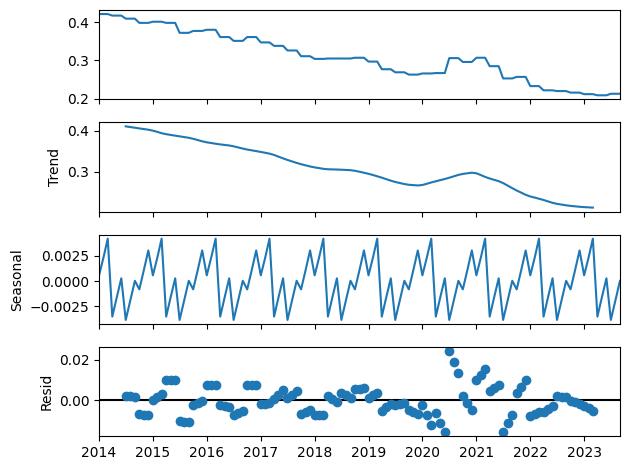

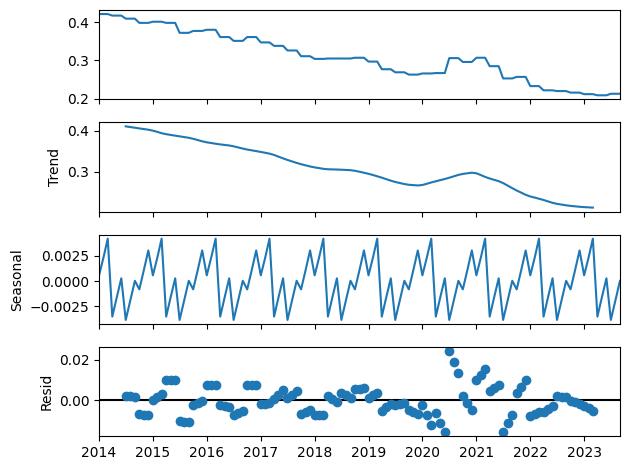

In [10]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Trend (Тренд): Верхня частина графіка показує наявність спадного тренду з деякими коливаннями, що свідчить про поступове зниження рівня показника з часом.

Seasonal (Сезонність): Сезонна компонента демонструє регулярні коливання на певних інтервалах, що вказує на циклічні зміни в даних. Цей компонент свідчить про сезонний характер часового ряду.

Resid (Залишок): Компонента залишків показує відхилення, які не пояснюються трендом або сезонністю.

Зважаючи на наявність чіткої сезонності, використання SARIMA (Seasonal ARIMA) буде більш підходящим для вашої задачі, ніж класична ARIMA. Модель SARIMA дозволяє враховувати як трендові, так і сезонні коливання в даних, що забезпечить точніший прогноз для вашого часового ряду з регулярною сезонністю.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=7.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-624.247, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-671.441, Time=2.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=4.68 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-622.247, Time=0.22 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-694.574, Time=14.53 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-690.746, Time=1.79 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-702.294, Time=4.72 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=4.94 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-693.404, Time=22.03 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-702.947, Time=4.98 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-704.981, Time=3.76 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-696.944, Time=3.00 sec
 ARIMA(0,1,0)(1,1,1)[12]             

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


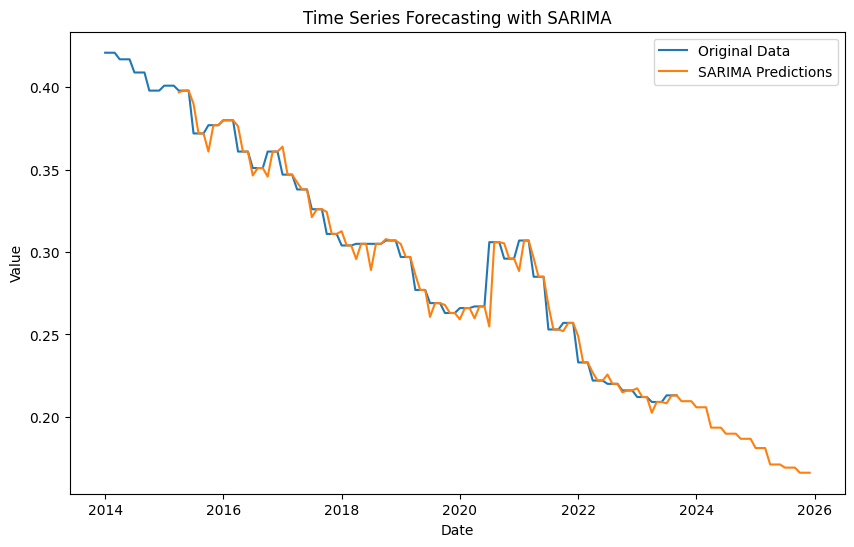

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 6.036671472433007e-05, RMSE: 0.007769601966917615, MAPE: 1.14%


C:\Users\Sofia\AppData\Local\Temp\ipykernel_1668\2546965128.py:48: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  forecast_results_df = pd.concat([forecast_results_df, results], ignore_index=True)


In [11]:
model_sarima(data_filtered, 'Italy', '15-24', 'Male')

>expected=0.361, predicted=0.351
>expected=0.361, predicted=0.361
>expected=0.361, predicted=0.361
>expected=0.347, predicted=0.353
>expected=0.347, predicted=0.348
>expected=0.347, predicted=0.348
>expected=0.338, predicted=0.348
>expected=0.338, predicted=0.339
>expected=0.338, predicted=0.339
>expected=0.326, predicted=0.339
>expected=0.326, predicted=0.327
>expected=0.326, predicted=0.327
>expected=0.311, predicted=0.327
>expected=0.311, predicted=0.312
>expected=0.311, predicted=0.311
>expected=0.304, predicted=0.322
>expected=0.304, predicted=0.305
>expected=0.304, predicted=0.305
>expected=0.305, predicted=0.311
>expected=0.305, predicted=0.305
>expected=0.305, predicted=0.305
>expected=0.305, predicted=0.304
>expected=0.305, predicted=0.305
>expected=0.305, predicted=0.305
>expected=0.307, predicted=0.305
>expected=0.307, predicted=0.306
>expected=0.307, predicted=0.306
>expected=0.297, predicted=0.307
>expected=0.297, predicted=0.298
>expected=0.297, predicted=0.298
>expected=

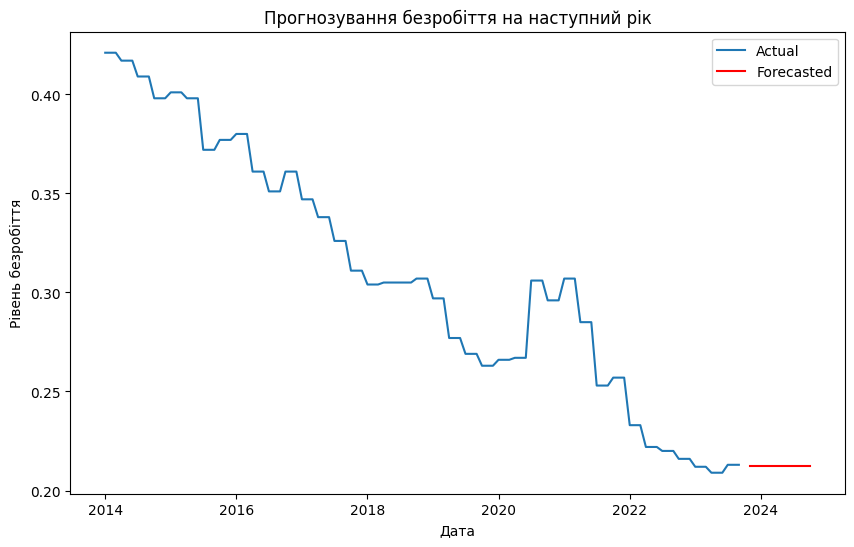

,Value,Predicted_Unemployment_Rate
Date,,
2014-01-01,0.421,NaN
2014-02-01,0.421,NaN
2014-03-01,0.421,NaN
2014-04-01,0.417,NaN
2014-05-01,0.417,NaN
...,...,...
2024-05-31,NaN,0.212617
2024-06-30,NaN,0.212617
2024-07-31,NaN,0.212617


In [63]:
xgboostprediction(combined_df, country='Italy', age='15-24', sex='Male')

### Ensemble

In [13]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from xgboost import XGBRegressor
# from sklearn.ensemble import StackingRegressor
# from sklearn.linear_model import LinearRegression
# from sklearn.model_selection import GridSearchCV
# from pmdarima import auto_arima
# from numpy import asarray
# from pandas import DataFrame, concat
# 
# # transform a time series dataset into a supervised learning dataset
# def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
#     n_vars = 1 if type(data) is list else data.shape[1]
#     df = DataFrame(data)
#     cols = list()
#     # input sequence (t-n, ... t-1)
#     for i in range(n_in, 0, -1):
#         cols.append(df.shift(i))
#     # forecast sequence (t, t+1, ... t+n)
#     for i in range(0, n_out):
#         cols.append(df.shift(-i))
#     # put it all together
#     agg = concat(cols, axis=1)
#     # drop rows with NaN values
#     if dropnan:
#         agg.dropna(inplace=True)
#     return agg.values
# 
# # split a univariate dataset into train/test sets
# def train_test_split(data, n_test):
#     return data[:-n_test, :], data[-n_test:, :]
# 
# # fit an xgboost model and make a one step prediction
# def xgboost_forecast(train, testX):
#     # transform list into array
#     train = asarray(train)
#     # split into input and output columns
#     trainX, trainy = train[:, :-1], train[:, -1]
#     # fit model
#     model = XGBRegressor(objective='reg:squarederror', n_estimators=1000)
#     model.fit(trainX, trainy)
#     # make a one-step prediction
#     yhat = model.predict(asarray([testX]))
#     return yhat[0]
# 
# def prepare_data_for_xgboost(combined_df, country, age, sex):
#     # Filter the data based on provided country, age, and sex
#     data_filtered = combined_df[
#         (combined_df['Country'] == country) &
#         (combined_df['Age'] == age) &
#         (combined_df['Sex'] == sex)
#     ].copy()
# 
#     # Prepare the Date column
#     data_filtered['Date'] = pd.to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')
# 
#     # Drop unnecessary columns and set the index
#     data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
#     data_filtered.set_index('Date', inplace=True)
#     data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
#     data_filtered = data_filtered.sort_values(by='Date')
# 
#     return data_filtered
# 
# # Ensemble model using stacking
# def ensemble_model(data_filtered):
#     # Split data into training and test sets
#     train_data = data_filtered[:'2024-09']
#     test_data = data_filtered['2015-04':]
# 
#     # Train SARIMA model on training data
#     sarima_forecast_train, sarima_fit = model_sarima(train_data, start=train_data.index[0], end=train_data.index[-1])
# 
#     # Prepare data for XGBoost
#     train_data_features = np.array(train_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)
#     train_data_values = train_data['Value'].values
#     test_data_features = np.array(test_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)
#     test_data_values = test_data['Value'].values
# 
#     # Grid Search for XGBoost parameters
#     param_grid = {
#         'n_estimators': [50, 100, 150],
#         'learning_rate': [0.01, 0.1, 0.2],
#         'max_depth': [2, 3, 4],
#         'subsample': [0.8, 1],
#         'colsample_bytree': [0.8, 1]
#     }
#     xgb_model = XGBRegressor(random_state=0)
#     grid_search = GridSearchCV(
#         estimator=xgb_model,
#         param_grid=param_grid,
#         scoring='neg_mean_squared_error',
#         cv=5,
#         n_jobs=-1,
#         verbose=1
#     )
#     grid_search.fit(train_data_features, train_data_values)
# 
#     # Get the best model from Grid Search
#     best_model = grid_search.best_estimator_
#     print(f'Найкращі параметри: {grid_search.best_params_}')
# 
#     # Forecast using the best XGBoost model
#     xgb_forecast = best_model.predict(test_data_features)
# 
#     # Calculate metrics for XGBoost
#     rmse_xgb = np.sqrt(mean_squared_error(test_data_values, xgb_forecast))
#     r2_xgb = r2_score(test_data_values, xgb_forecast)
#     print(f'XGBoost RMSE: {rmse_xgb:.4f}')
#     print(f'XGBoost R^2: {r2_xgb:.4f}')
# 
#     # Create stacking ensemble using SARIMA forecast as an additional feature
#     train_data_combined = np.column_stack((train_data_features, sarima_forecast_train.values))
#     estimators = [
#         ('xgb', best_model)
#     ]
#     stacking_model = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())
#     stacking_model.fit(train_data_combined, train_data_values)
# 
#     # Forecast using SARIMA for test period
#     sarima_forecast_test = sarima_fit.get_prediction(start=test_data.index[0], end=test_data.index[-1]).predicted_mean
# 
#     # Prepare data for ensemble forecasting
#     test_data_combined = np.column_stack((test_data_features, sarima_forecast_test.values))
# 
#     # Forecast using stacking ensemble
#     ensemble_forecast = stacking_model.predict(test_data_combined)
# 
#     # Calculate metrics
#     r2 = r2_score(test_data_values, ensemble_forecast)
#     rmse = np.sqrt(mean_squared_error(test_data_values, ensemble_forecast))
#     mae = mean_absolute_error(test_data_values, ensemble_forecast)
# 
#     print(f'Ensemble R^2: {r2:.4f}')
#     print(f'Ensemble RMSE: {rmse:.4f}')
#     print(f'Ensemble MAE: {mae:.4f}')
# 
#     # Plot results
#     plt.figure(figsize=(10, 6))
#     plt.plot(train_data.index, train_data['Value'], label='Train Data')
#     plt.plot(test_data.index, test_data['Value'], label='Actual Test Data')
#     plt.plot(test_data.index, ensemble_forecast, label='Ensemble Forecast (Stacking SARIMA + XGBoost)', linestyle='--')
#     plt.legend()
#     plt.xlabel('Date')
#     plt.ylabel('Value')
#     plt.title('Ensemble Forecast vs Actual')
#     plt.show()
# 
# # Apply the ensemble model to the unemployment dataset
# data_filtered = prepare_data_for_xgboost(combined_df, country='Italy', age='15-24', sex='Male')
# ensemble_model(data_filtered)

In [14]:
data_filtered

,Value
Date,
2014-01-01,0.421
2014-02-01,0.421
2014-03-01,0.421
2014-04-01,0.417
2014-05-01,0.417
...,...
2023-05-01,0.209
2023-06-01,0.209
2023-07-01,0.213


### 15-24, Female

In [26]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Female')

In [16]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9759
Strong seasonality detected.


(0.9759137610718212, True)

In [27]:
data_filtered

,Value
Date,
2014-01-01,0.446
2014-02-01,0.446
2014-03-01,0.446
2014-04-01,0.441
2014-05-01,0.441
...,...
2023-05-01,0.256
2023-06-01,0.256
2023-07-01,0.260


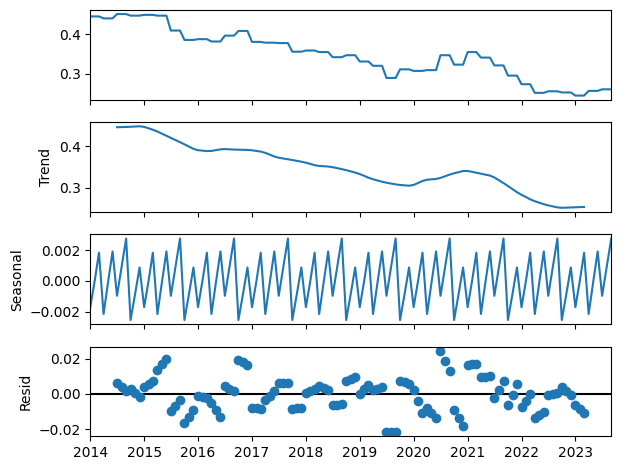

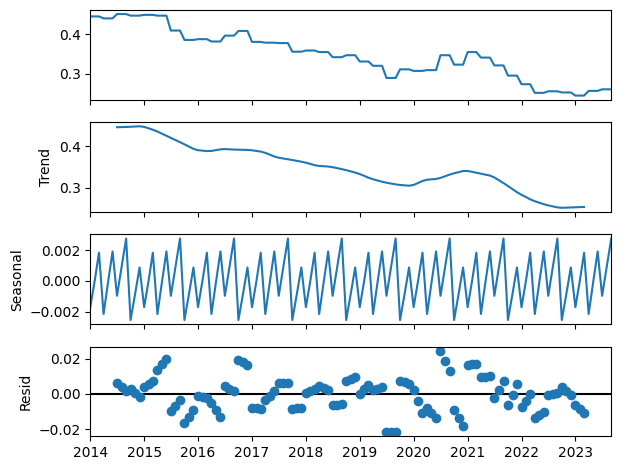

In [18]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Тренд: У часовому ряді є чіткий спадний тренд, що свідчить про загальне зниження показника з часом.

Сезонність: Сезонна компонента демонструє регулярні коливання, що вказує на наявність повторюваних сезонних циклів у даних.

Залишок: Компонента залишків показує невеликі відхилення від тренду і сезонності, але вони не виглядають суттєвими.

Зважаючи на наявність як тренду, так і сезонності, SARIMA (Seasonal ARIMA) буде оптимальним вибором для цього часового ряду. Модель SARIMA дозволяє враховувати і трендові, і сезонні коливання, що зробить прогноз точнішим у порівнянні з класичною ARIMA, яка не враховує сезонність.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=10.91 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-551.720, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-594.867, Time=1.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-549.720, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-630.424, Time=0.75 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-648.279, Time=4.94 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-639.654, Time=2.47 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-642.621, Time=1.82 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=4.71 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-650.798, Time=4.42 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=3.80 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-632.536, Time=2.06 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-644.780, Time=4.75 sec
 ARIMA(0,1,0)(1,1,0)[12]             :

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


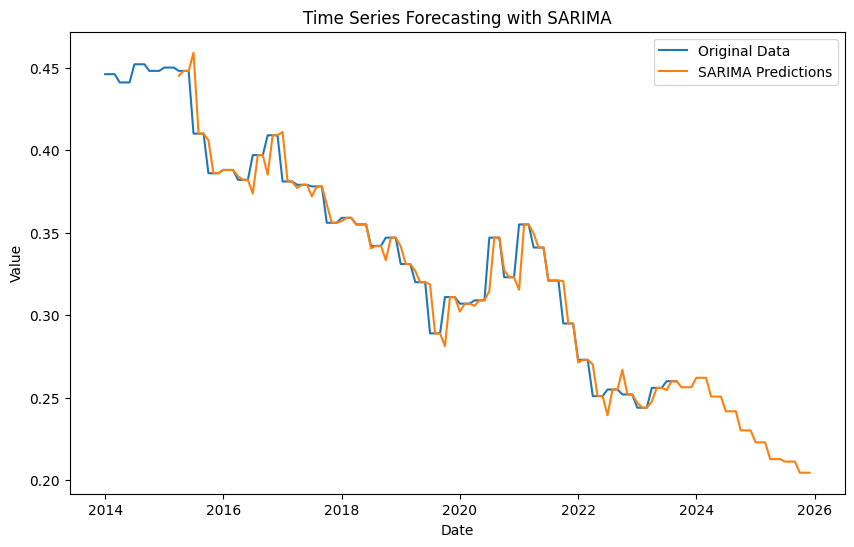

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 0.00011227294040815991, RMSE: 0.010595892619697499, MAPE: 1.33%


In [19]:
model_sarima(data_filtered, 'Italy', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=24.80 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-551.720, Time=0.27 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-594.867, Time=9.75 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=13.44 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-549.720, Time=0.18 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-630.424, Time=3.83 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-648.279, Time=40.47 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-639.654, Time=22.12 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-642.621, Time=15.61 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=38.09 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-650.798, Time=24.40 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=16.03 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-632.536, Time=11.01 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-644.780, Time=29.12 sec
 ARIMA(0,1,0)(1,1,0)[12]     

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


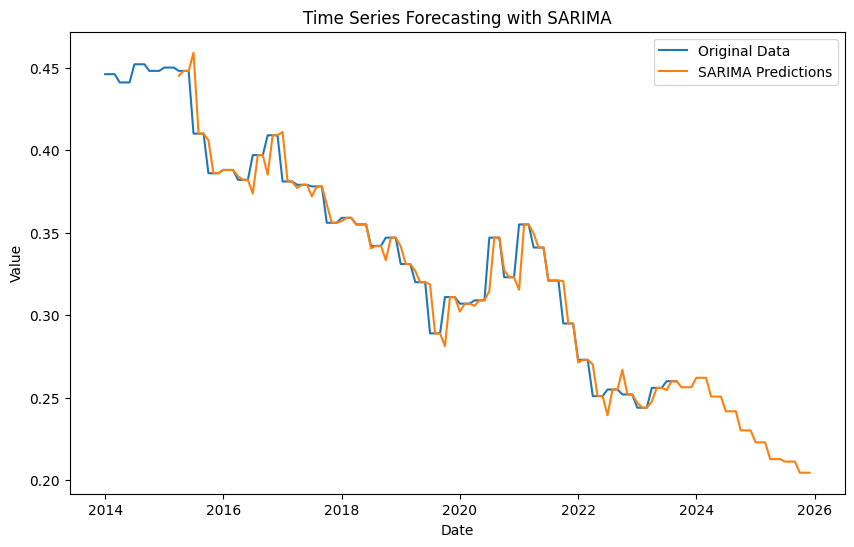

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 0.00011227294040815991, RMSE: 0.010595892619697499, MAPE: 1.33%


In [20]:
model_sarima(data_filtered, 'Italy', '15-24', 'Male')

>expected=0.409, predicted=0.388
>expected=0.409, predicted=0.408
>expected=0.409, predicted=0.408
>expected=0.381, predicted=0.406
>expected=0.381, predicted=0.388
>expected=0.381, predicted=0.387
>expected=0.379, predicted=0.399
>expected=0.379, predicted=0.388
>expected=0.379, predicted=0.387
>expected=0.378, predicted=0.391
>expected=0.378, predicted=0.379
>expected=0.378, predicted=0.386
>expected=0.356, predicted=0.385
>expected=0.356, predicted=0.370
>expected=0.356, predicted=0.377
>expected=0.359, predicted=0.376
>expected=0.359, predicted=0.368
>expected=0.359, predicted=0.366
>expected=0.355, predicted=0.366
>expected=0.355, predicted=0.363
>expected=0.355, predicted=0.356
>expected=0.342, predicted=0.362
>expected=0.342, predicted=0.343
>expected=0.342, predicted=0.343
>expected=0.347, predicted=0.342
>expected=0.347, predicted=0.347
>expected=0.347, predicted=0.347
>expected=0.331, predicted=0.358
>expected=0.331, predicted=0.332
>expected=0.331, predicted=0.332
>expected=

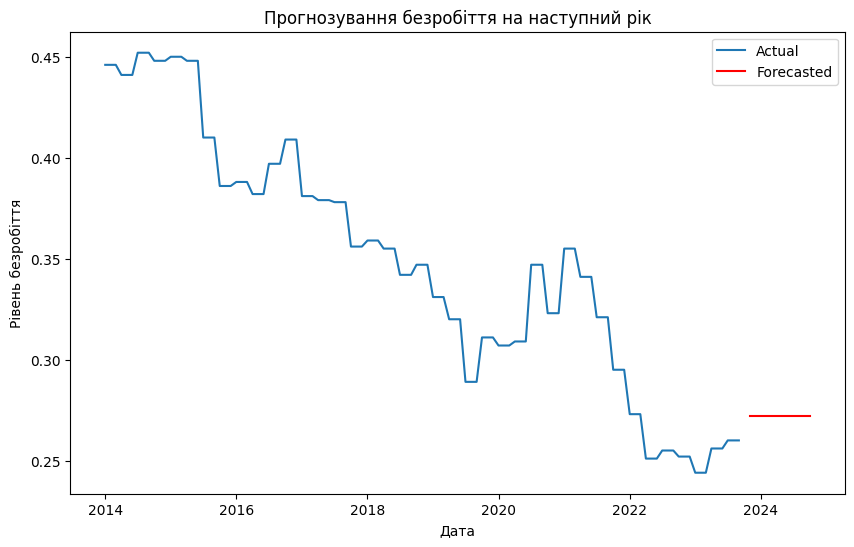

,Value,Predicted_Unemployment_Rate
Date,,
2014-01-01,0.446,NaN
2014-02-01,0.446,NaN
2014-03-01,0.446,NaN
2014-04-01,0.441,NaN
2014-05-01,0.441,NaN
...,...,...
2024-05-31,NaN,0.271927
2024-06-30,NaN,0.271927
2024-07-31,NaN,0.271927


In [28]:
xgboostprediction(combined_df, country='Italy', age='15-24', sex='Female')

### 15-24, Total

In [22]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Total')

In [23]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9753
Strong seasonality detected.


(0.9753402524993018, True)

In [24]:
data_filtered

,Value
Date,
2014-01-01,0.432
2014-02-01,0.429
2014-03-01,0.433
2014-04-01,0.432
2014-05-01,0.427
...,...
2024-05-01,0.206
2024-06-01,0.205
2024-07-01,0.198


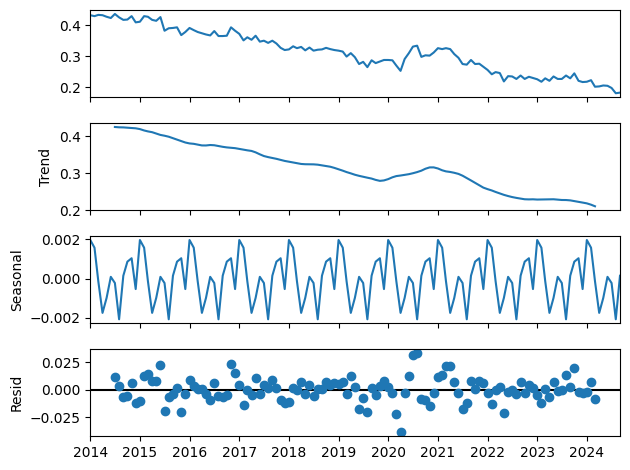

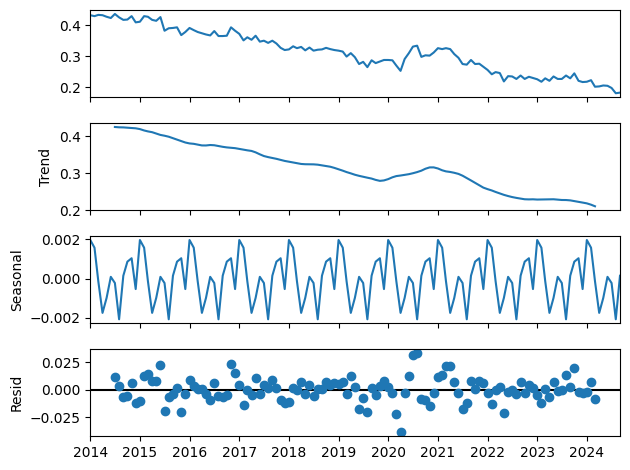

In [25]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Сезонність: Видно регулярні циклічні зміни, що означає наявність сезонної компоненти.
Тренд: Спостерігається загальна тенденція зниження, яка також може бути змодельована в SARIMA.
Випадкові залишки: Резідуальні коливання виглядають близькими до нуля, що може вказувати на те, що основні патерни враховані, але залишкові випадкові коливання все одно потребують сезонної корекції для підвищення точності.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=25.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-560.713, Time=0.14 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-617.898, Time=10.87 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=7.44 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-563.828, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-648.712, Time=20.99 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=26.34 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-661.904, Time=5.00 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=6.50 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-678.685, Time=31.63 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=11.79 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=27.63 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-660.104, Time=23.58 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=inf, Time=22.42 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=in

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


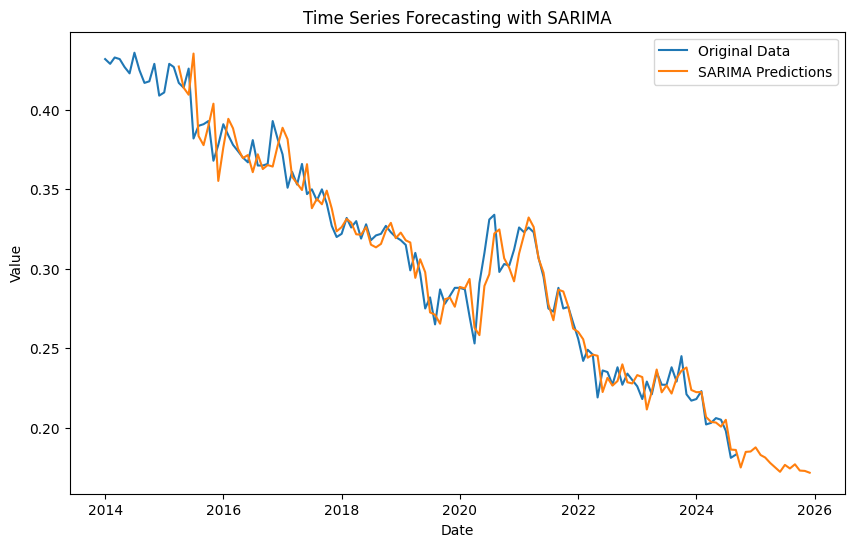

R^2 Score for SARIMA: 0.95
SARIMA - MSE: 0.00017410129202049981, RMSE: 0.013194744863789517, MAPE: 3.04%


In [26]:
model_sarima(data_filtered, 'Italy', '15-24', 'Total')

>expected=0.341, predicted=0.348
>expected=0.327, predicted=0.343
>expected=0.320, predicted=0.334
>expected=0.322, predicted=0.337
>expected=0.332, predicted=0.339
>expected=0.326, predicted=0.330
>expected=0.330, predicted=0.328
>expected=0.319, predicted=0.325
>expected=0.328, predicted=0.334
>expected=0.318, predicted=0.324
>expected=0.321, predicted=0.321
>expected=0.322, predicted=0.325
>expected=0.327, predicted=0.327
>expected=0.323, predicted=0.325
>expected=0.320, predicted=0.324
>expected=0.318, predicted=0.321
>expected=0.315, predicted=0.322
>expected=0.299, predicted=0.319
>expected=0.310, predicted=0.302
>expected=0.297, predicted=0.304
>expected=0.275, predicted=0.308
>expected=0.282, predicted=0.278
>expected=0.265, predicted=0.276
>expected=0.287, predicted=0.284
>expected=0.278, predicted=0.269
>expected=0.283, predicted=0.276
>expected=0.288, predicted=0.278
>expected=0.288, predicted=0.282
>expected=0.287, predicted=0.273
>expected=0.270, predicted=0.283
>expected=

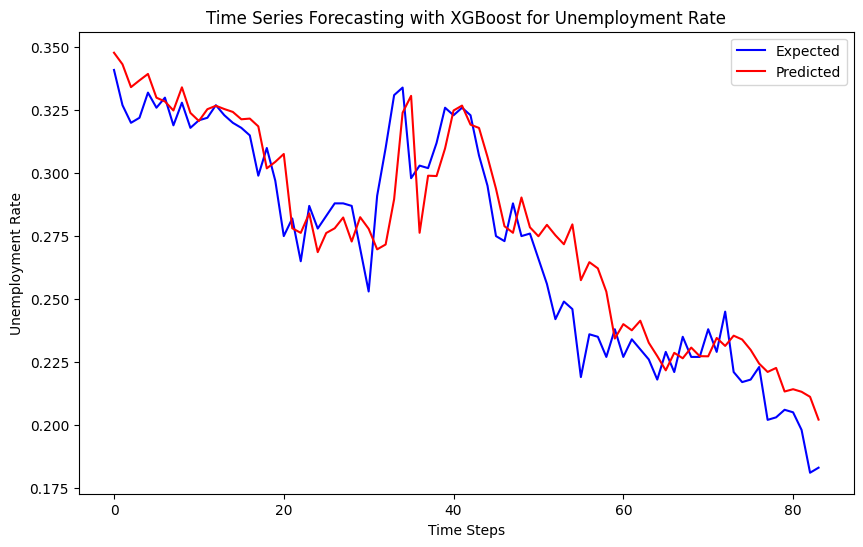

In [27]:
xgboostprediction(combined_df, country='Italy', age='15-24', sex='Total')

### 25+, Female

In [28]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Female')

In [29]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9437
Strong seasonality detected.


(0.9436783534048339, True)

In [30]:
data_filtered

,Value
Date,
2014-01-01,0.117
2014-02-01,0.117
2014-03-01,0.117
2014-04-01,0.116
2014-05-01,0.116
...,...
2023-05-01,0.077
2023-06-01,0.077
2023-07-01,0.079


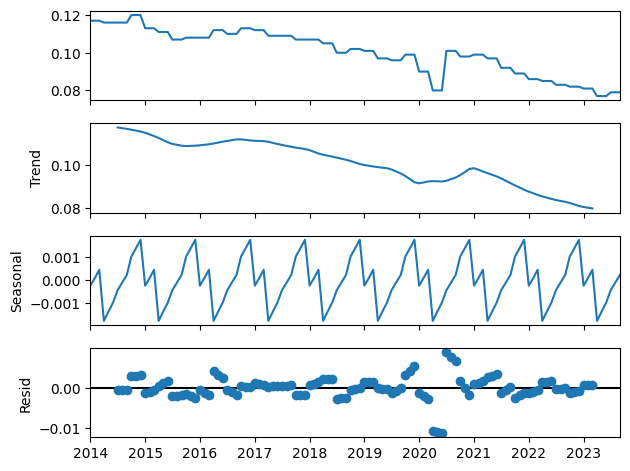

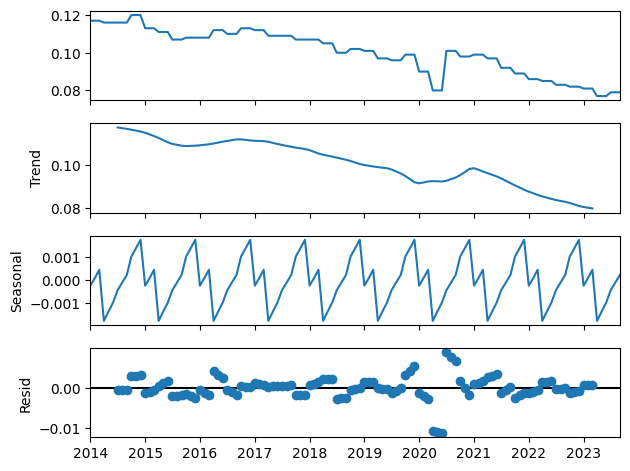

In [31]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=22.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-844.199, Time=0.20 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-864.994, Time=4.66 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=7.57 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-842.199, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-888.471, Time=11.59 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-894.201, Time=11.03 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-892.915, Time=35.78 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-884.930, Time=22.26 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=22.26 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-896.201, Time=9.93 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-883.216, Time=1.19 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-890.471, Time=0.72 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-886.930, Time=1.93 sec
 ARIMA(0,1,0)(1,1,0)[12]    

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


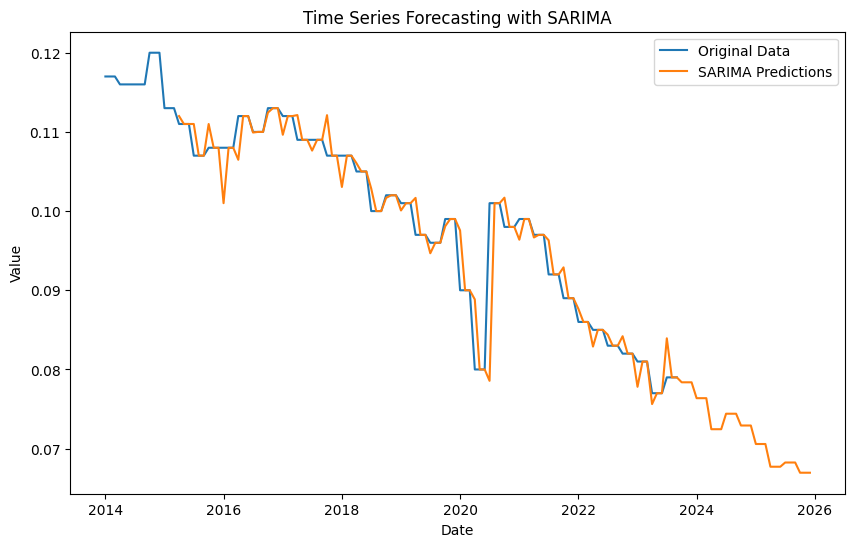

R^2 Score for SARIMA: 0.92
SARIMA - MSE: 9.243031517382546e-06, RMSE: 0.0030402354378209835, MAPE: 1.22%


In [32]:
model_sarima(data_filtered, 'Italy', '25+', 'Female')

>expected=0.113, predicted=0.109
>expected=0.113, predicted=0.111
>expected=0.113, predicted=0.111
>expected=0.112, predicted=0.112
>expected=0.112, predicted=0.111
>expected=0.112, predicted=0.112
>expected=0.109, predicted=0.111
>expected=0.109, predicted=0.110
>expected=0.109, predicted=0.110
>expected=0.109, predicted=0.111
>expected=0.109, predicted=0.110
>expected=0.109, predicted=0.110
>expected=0.107, predicted=0.110
>expected=0.107, predicted=0.108
>expected=0.107, predicted=0.109
>expected=0.107, predicted=0.109
>expected=0.107, predicted=0.109
>expected=0.107, predicted=0.107
>expected=0.105, predicted=0.111
>expected=0.105, predicted=0.108
>expected=0.105, predicted=0.108
>expected=0.100, predicted=0.107
>expected=0.100, predicted=0.106
>expected=0.100, predicted=0.107
>expected=0.102, predicted=0.105
>expected=0.102, predicted=0.102
>expected=0.102, predicted=0.102
>expected=0.101, predicted=0.102
>expected=0.101, predicted=0.101
>expected=0.101, predicted=0.101
>expected=

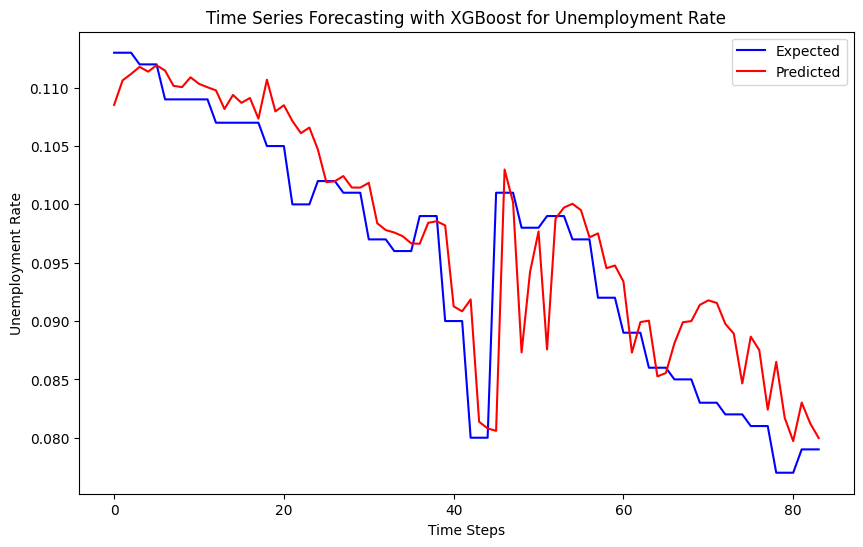

In [33]:
xgboostprediction(combined_df, country='Italy', age='25+', sex='Female')

### 25+ Male

In [34]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Male')

In [35]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9824
Strong seasonality detected.


(0.9823771210175029, True)

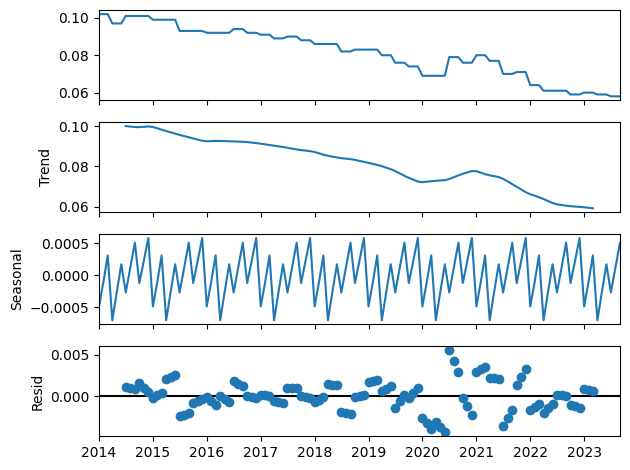

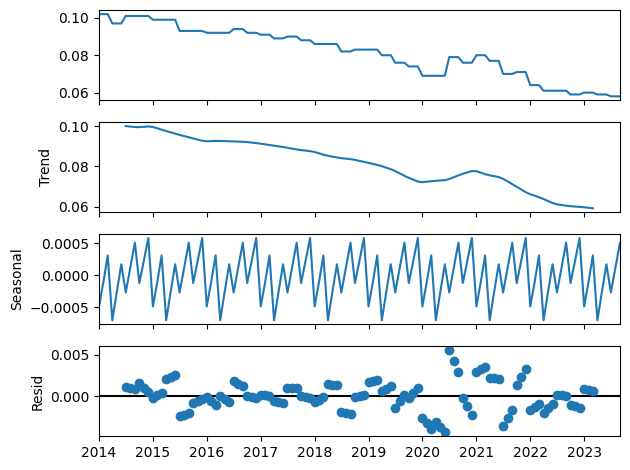

In [36]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=12.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-891.207, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-953.946, Time=7.55 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=9.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-889.206, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-997.273, Time=12.00 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1023.464, Time=9.86 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-934.335, Time=1.36 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-991.989, Time=3.69 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-994.206, Time=0.87 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-1025.530, Time=3.78 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-925.154, Time=0.50 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-999.273, Time=1.41 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-993.991, Time=1.96 sec
 ARIMA(0,1,0)(1,1,0)[12] 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


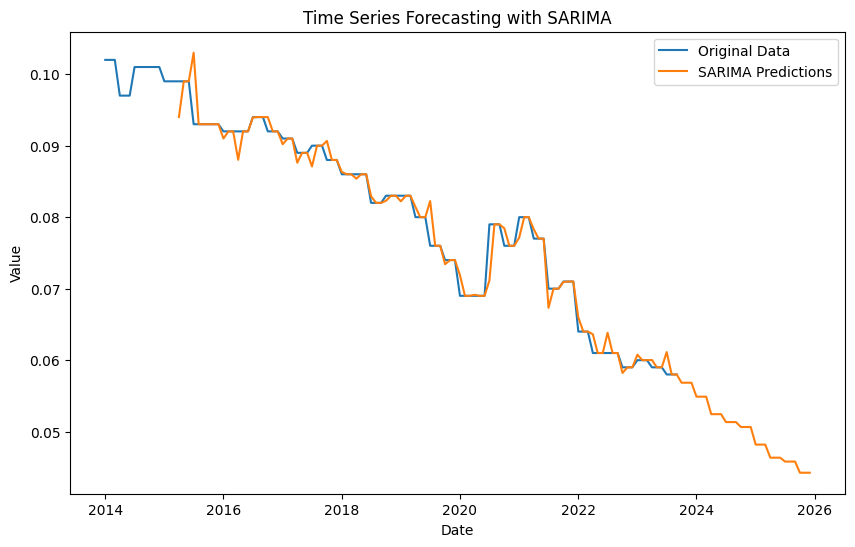

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 3.252938754292392e-06, RMSE: 0.0018035905173548656, MAPE: 0.94%


In [37]:
model_sarima(data_filtered, 'Italy', '25+', 'Male')

>expected=0.092, predicted=0.093
>expected=0.092, predicted=0.093
>expected=0.092, predicted=0.092
>expected=0.091, predicted=0.092
>expected=0.091, predicted=0.092
>expected=0.091, predicted=0.092
>expected=0.089, predicted=0.092
>expected=0.089, predicted=0.090
>expected=0.089, predicted=0.090
>expected=0.090, predicted=0.089
>expected=0.090, predicted=0.090
>expected=0.090, predicted=0.090
>expected=0.088, predicted=0.090
>expected=0.088, predicted=0.089
>expected=0.088, predicted=0.089
>expected=0.086, predicted=0.088
>expected=0.086, predicted=0.087
>expected=0.086, predicted=0.087
>expected=0.086, predicted=0.087
>expected=0.086, predicted=0.087
>expected=0.086, predicted=0.087
>expected=0.082, predicted=0.088
>expected=0.082, predicted=0.083
>expected=0.082, predicted=0.083
>expected=0.083, predicted=0.085
>expected=0.083, predicted=0.083
>expected=0.083, predicted=0.083
>expected=0.083, predicted=0.083
>expected=0.083, predicted=0.083
>expected=0.083, predicted=0.083
>expected=

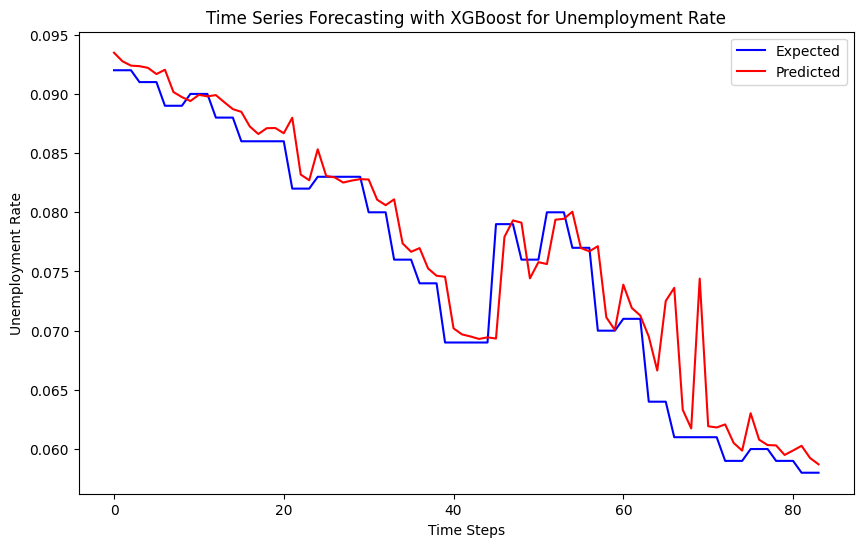

In [38]:
xgboostprediction(combined_df, country='Italy', age='25+', sex='Male')

### 25+, Total

In [39]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Total')

In [40]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9742
Strong seasonality detected.


(0.974160216028246, True)

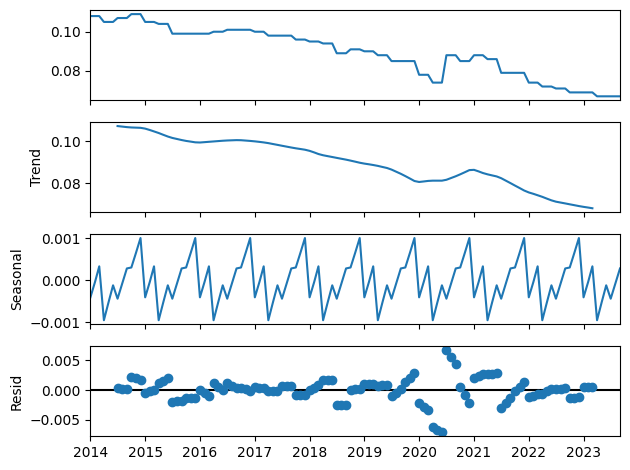

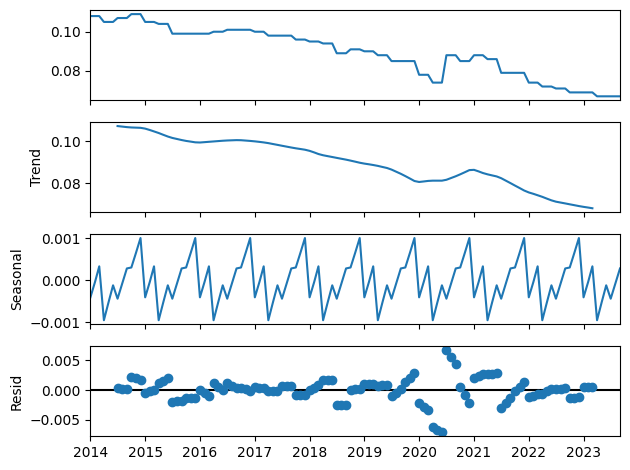

In [41]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-885.237, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-926.068, Time=0.68 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-883.236, Time=0.15 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-958.361, Time=0.64 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-966.677, Time=2.26 sec


C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1901: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_auto_solvers.py:38: RuntimeWarning: invalid value encountered in divide
  max_invroot = max(0, *np.abs(1 / model.arroots()))
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1908: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-894.890, Time=0.44 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-959.934, Time=2.09 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-950.425, Time=1.66 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-967.331, Time=1.68 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-956.456, Time=1.40 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-960.361, Time=0.93 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-961.935, Time=2.57 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-928.068, Time=0.98 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-952.423, Time=0.68 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-966.992, Time=2.12 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-965.387, Time=3.76 sec
 ARIMA(0,1,0)(2,1,1)[12] intercept   : AIC=-961.757, Time=5.64 sec

Best model:  ARIMA(0,1,0)(2,1,1)[12]          
Total fit time: 30.786 seconds
                                      SARIMAX Results                                       
Dep. Variable:          

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


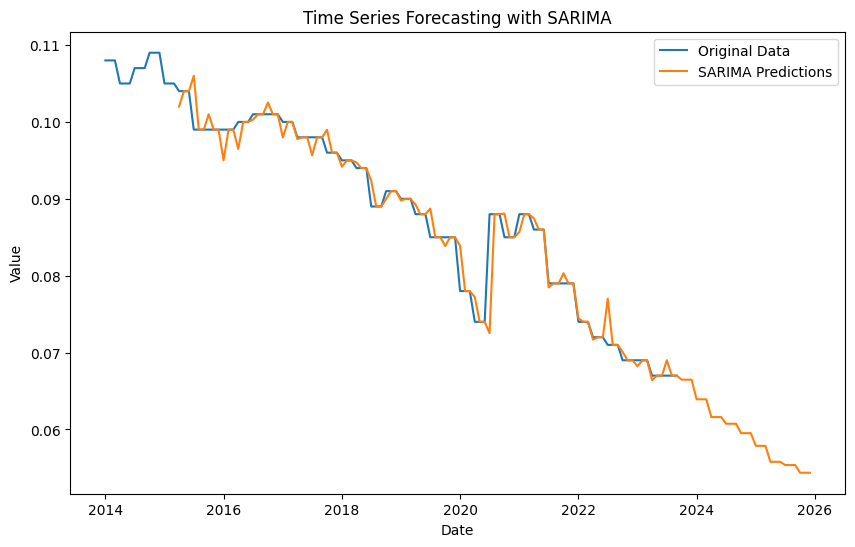

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 4.736573904904342e-06, RMSE: 0.0021763671346774977, MAPE: 0.96%


In [42]:
model_sarima(data_filtered, 'Italy', '25+', 'Total')

>expected=0.101, predicted=0.099
>expected=0.101, predicted=0.100
>expected=0.101, predicted=0.101
>expected=0.100, predicted=0.101
>expected=0.100, predicted=0.100
>expected=0.100, predicted=0.100
>expected=0.098, predicted=0.100
>expected=0.098, predicted=0.099
>expected=0.098, predicted=0.100
>expected=0.098, predicted=0.099
>expected=0.098, predicted=0.098
>expected=0.098, predicted=0.098
>expected=0.096, predicted=0.099
>expected=0.096, predicted=0.097
>expected=0.096, predicted=0.097
>expected=0.095, predicted=0.097
>expected=0.095, predicted=0.096
>expected=0.095, predicted=0.096
>expected=0.094, predicted=0.096
>expected=0.094, predicted=0.095
>expected=0.094, predicted=0.095
>expected=0.089, predicted=0.095
>expected=0.089, predicted=0.090
>expected=0.089, predicted=0.090
>expected=0.091, predicted=0.089
>expected=0.091, predicted=0.090
>expected=0.091, predicted=0.090
>expected=0.090, predicted=0.094
>expected=0.090, predicted=0.091
>expected=0.090, predicted=0.090
>expected=

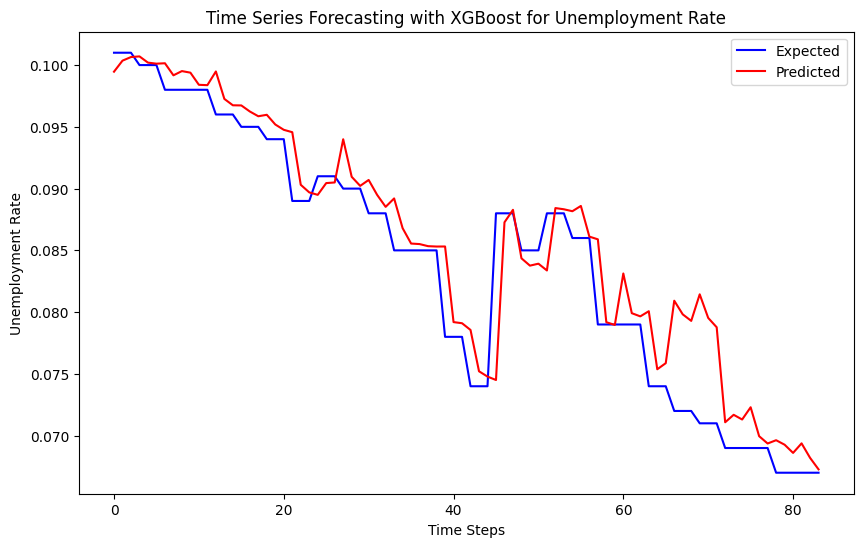

In [43]:
xgboostprediction(combined_df, country='Italy', age='25+', sex='Total')

## France

### 15-24, Male

In [44]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Male')

In [45]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.metrics import r2_score, mean_squared_error
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from xgboost import XGBRegressor
# 
# # Підготовка даних
# data = data_filtered.copy()
# data.index = pd.to_datetime(data.index)
# 
# # Розділення на тренувальну і тестову вибірку
# train_data = data[:'2023-12']
# test_data = data['2020-01':]
# 
# # SARIMA модель
# sarima_model = SARIMAX(train_data['Value'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
# sarima_fit = sarima_model.fit(disp=False)
# 
# # Прогнозування за допомогою SARIMA
# sarima_forecast = sarima_fit.predict(start=test_data.index[0], end=test_data.index[-1])
# 
# # Підготовка даних для XGBoost
# train_data_features = np.array(train_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)
# train_data_values = train_data['Value'].values
# 
# test_data_features = np.array(test_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)
# 
# # Навчання моделі XGBoost
# xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0)
# xgb_model.fit(train_data_features, train_data_values)
# 
# # Прогнозування за допомогою XGBoost
# xgb_forecast = xgb_model.predict(test_data_features)
# 
# # Створення ансамблевого прогнозу як середнього значення SARIMA та XGBoost
# ensemble_forecast = (sarima_forecast + xgb_forecast) / 2
# 
# # Обчислення метрик якості
# r2 = r2_score(test_data['Value'], ensemble_forecast)
# rmse = np.sqrt(mean_squared_error(test_data['Value'], ensemble_forecast))
# 
# # Виведення результатів
# print(f'R^2: {r2:.4f}')
# print(f'RMSE: {rmse:.4f}')
# 
# # Візуалізація
# plt.figure(figsize=(10, 6))
# plt.plot(train_data.index, train_data['Value'], label='Train Data')
# plt.plot(test_data.index, test_data['Value'], label='Actual Test Data')
# plt.plot(test_data.index, ensemble_forecast, label='Ensemble Forecast (SARIMA + XGBoost)', linestyle='--')
# plt.legend()
# plt.xlabel('Date')
# plt.ylabel('Value')
# plt.title('Ensemble Forecast vs Actual')
# plt.show()


In [46]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9266
Strong seasonality detected.


(0.9265549272135531, True)

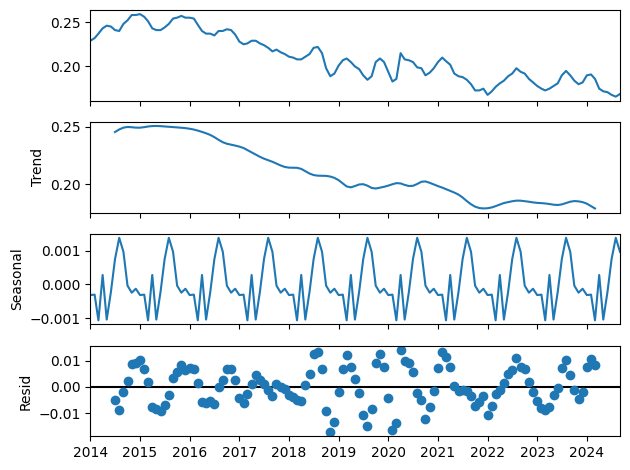

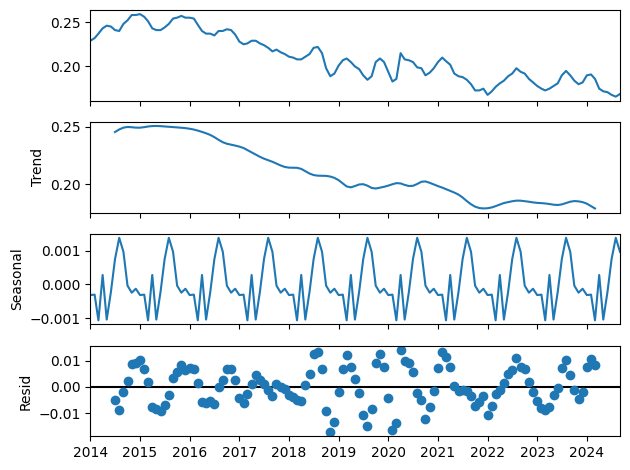

In [47]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-841.362, Time=1.91 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-761.563, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-813.978, Time=0.80 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-844.272, Time=1.32 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-786.026, Time=0.49 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-838.624, Time=2.40 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-844.738, Time=4.33 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-843.734, Time=1.83 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-829.890, Time=3.25 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-840.853, Time=1.37 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-843.086, Time=5.81 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-840.970, Time=1.40 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-842.904, Time=4.65 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-842.048, Time=4.79 sec

Best model:  ARIMA

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


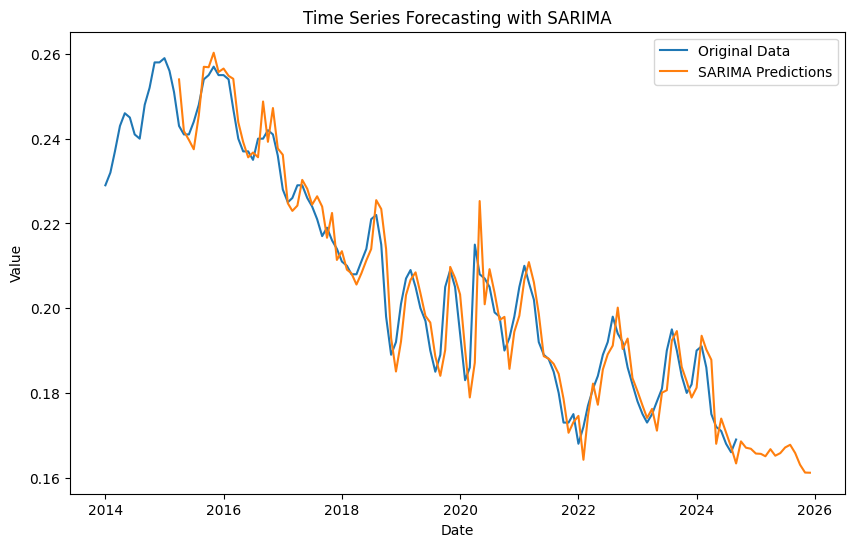

R^2 Score for SARIMA: 0.94
SARIMA - MSE: 3.646316460925746e-05, RMSE: 0.006038473698647487, MAPE: 2.25%


In [48]:
model_sarima(data_filtered,'France', '15-24', 'Male')

>expected=0.219, predicted=0.219
>expected=0.216, predicted=0.219
>expected=0.214, predicted=0.217
>expected=0.211, predicted=0.218
>expected=0.210, predicted=0.215
>expected=0.208, predicted=0.215
>expected=0.208, predicted=0.211
>expected=0.211, predicted=0.209
>expected=0.214, predicted=0.213
>expected=0.221, predicted=0.215
>expected=0.222, predicted=0.213
>expected=0.215, predicted=0.216
>expected=0.198, predicted=0.212
>expected=0.189, predicted=0.200
>expected=0.192, predicted=0.193
>expected=0.201, predicted=0.195
>expected=0.207, predicted=0.201
>expected=0.209, predicted=0.201
>expected=0.205, predicted=0.205
>expected=0.200, predicted=0.204
>expected=0.197, predicted=0.197
>expected=0.190, predicted=0.194
>expected=0.185, predicted=0.193
>expected=0.189, predicted=0.186
>expected=0.205, predicted=0.188
>expected=0.209, predicted=0.196
>expected=0.205, predicted=0.202
>expected=0.194, predicted=0.201
>expected=0.183, predicted=0.192
>expected=0.186, predicted=0.185
>expected=

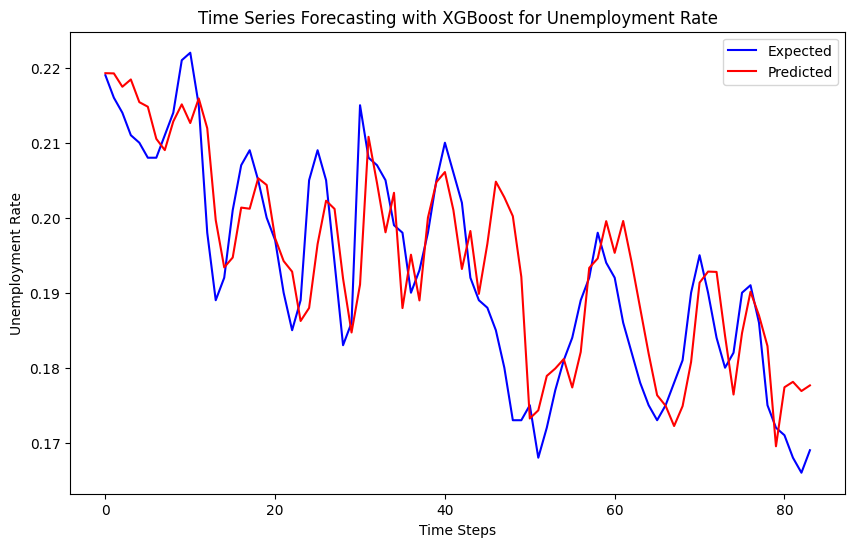

In [49]:
xgboostprediction(combined_df, country='France', age='15-24', sex='Male')

### 15-24, Female

In [50]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Female')

In [51]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9638
Strong seasonality detected.


(0.9637833589565912, True)

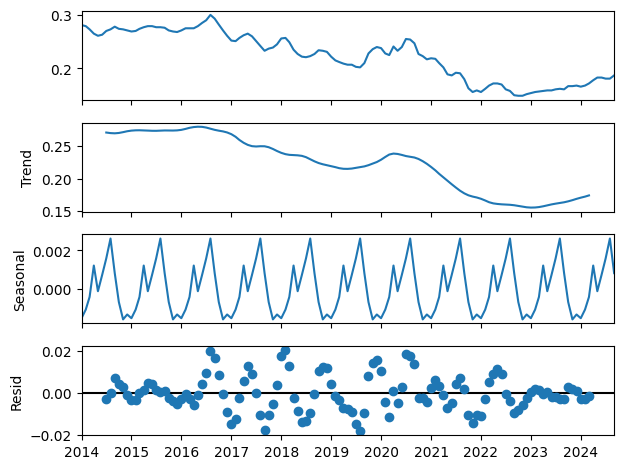

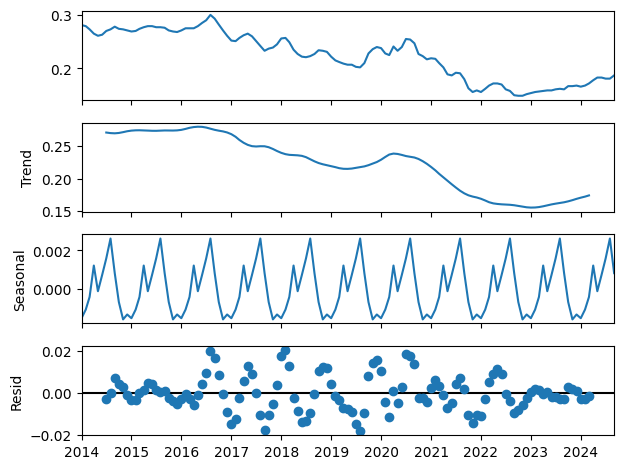

In [52]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-820.961, Time=1.37 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-751.558, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-803.891, Time=0.84 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.49 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-789.246, Time=1.02 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-809.514, Time=0.72 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-831.524, Time=2.82 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2.37 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-829.285, Time=1.75 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-830.109, Time=4.04 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-829.832, Time=6.11 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=2.23 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-834.084, Time=6.26 sec
 ARIMA(0,1,2)(0,1,1)[12]             : 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


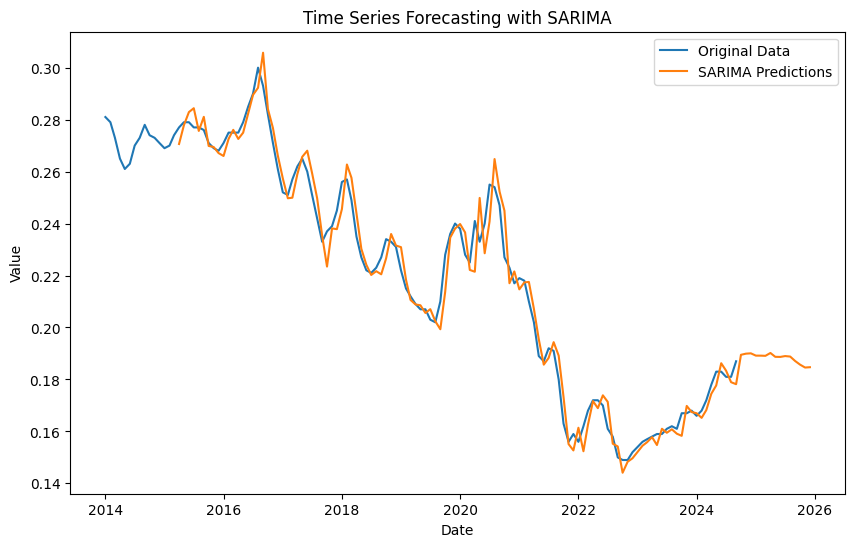

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 3.978523277177276e-05, RMSE: 0.00630755362813292, MAPE: 2.22%


In [53]:
model_sarima(data_filtered,'France', '15-24', 'Female')

>expected=0.237, predicted=0.249
>expected=0.239, predicted=0.248
>expected=0.245, predicted=0.256
>expected=0.256, predicted=0.245
>expected=0.257, predicted=0.259
>expected=0.249, predicted=0.258
>expected=0.235, predicted=0.257
>expected=0.227, predicted=0.237
>expected=0.222, predicted=0.244
>expected=0.221, predicted=0.224
>expected=0.223, predicted=0.241
>expected=0.227, predicted=0.239
>expected=0.234, predicted=0.230
>expected=0.233, predicted=0.235
>expected=0.231, predicted=0.232
>expected=0.222, predicted=0.231
>expected=0.215, predicted=0.223
>expected=0.212, predicted=0.221
>expected=0.209, predicted=0.215
>expected=0.207, predicted=0.212
>expected=0.207, predicted=0.209
>expected=0.203, predicted=0.215
>expected=0.202, predicted=0.211
>expected=0.210, predicted=0.208
>expected=0.228, predicted=0.212
>expected=0.236, predicted=0.224
>expected=0.240, predicted=0.232
>expected=0.238, predicted=0.235
>expected=0.228, predicted=0.237
>expected=0.225, predicted=0.231
>expected=

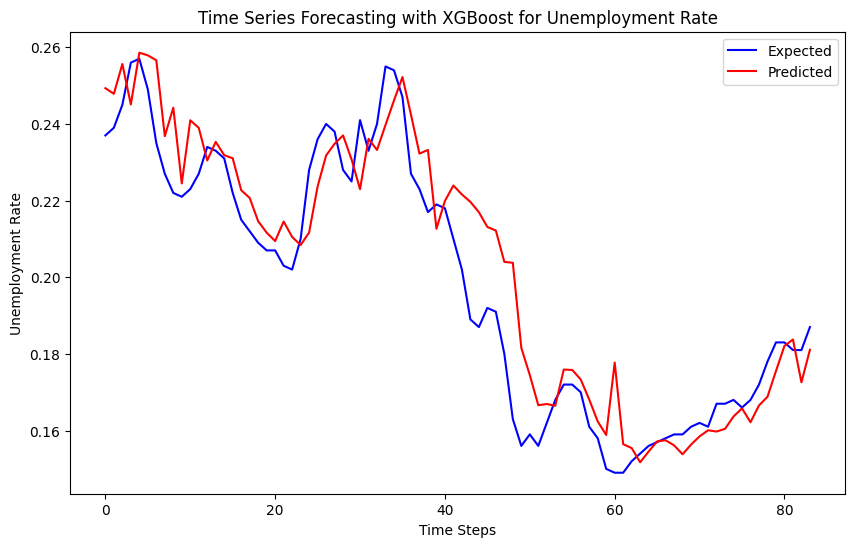

In [54]:
xgboostprediction(combined_df, country='France', age='15-24', sex='Female')

### 15-24, Total

In [55]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Total')

In [56]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9722
Strong seasonality detected.


(0.9722125563602366, True)

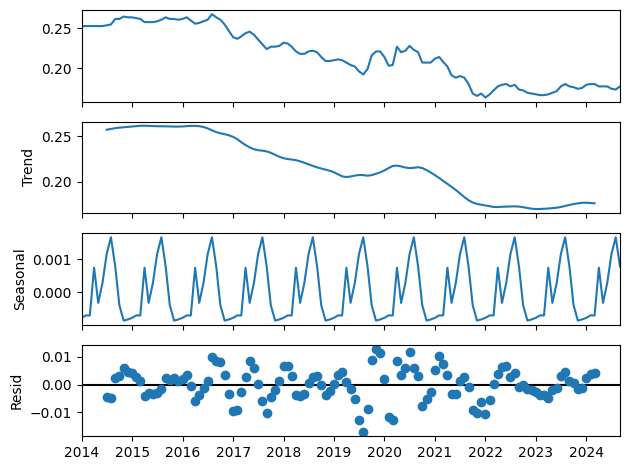

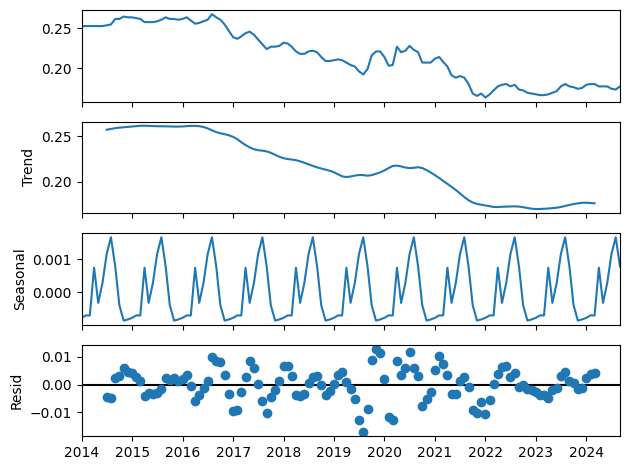

In [57]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-872.122, Time=1.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-799.108, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-844.454, Time=1.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-874.629, Time=1.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-818.211, Time=0.21 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=2.54 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-875.570, Time=3.77 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.64 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-866.772, Time=1.38 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-873.721, Time=3.98 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-874.050, Time=4.73 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-871.645, Time=2.31 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-871.307, Time=3.84 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-864.500, Time=3.91 sec

Best model:  ARIMA(0,1,1)(0,

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


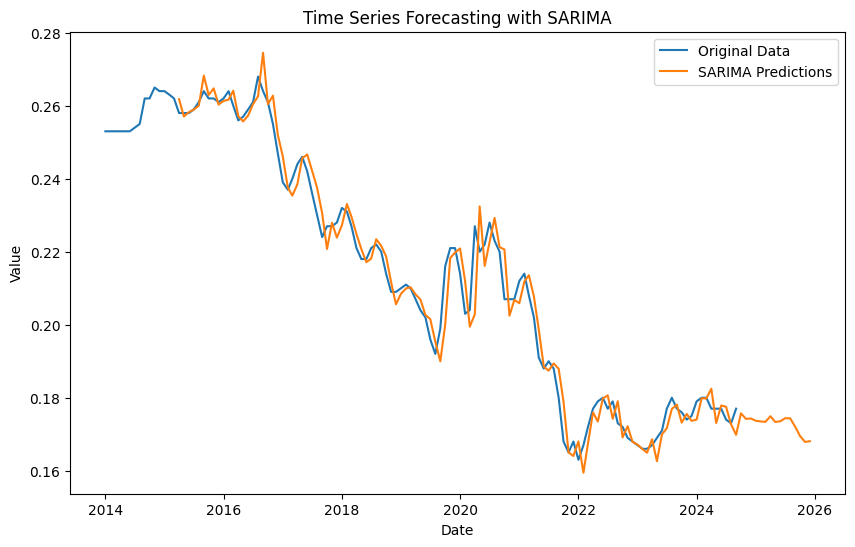

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 2.7851051204562493e-05, RMSE: 0.005277409516473257, MAPE: 1.84%


In [58]:
model_sarima(data_filtered,'France', '15-24', 'Total')

In [ ]:
xgboostprediction(combined_df, country='France', age='15-24', sex='Total')

### 25+, Male

In [106]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Male')

In [107]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9640
Strong seasonality detected.


(0.9639892730409885, True)

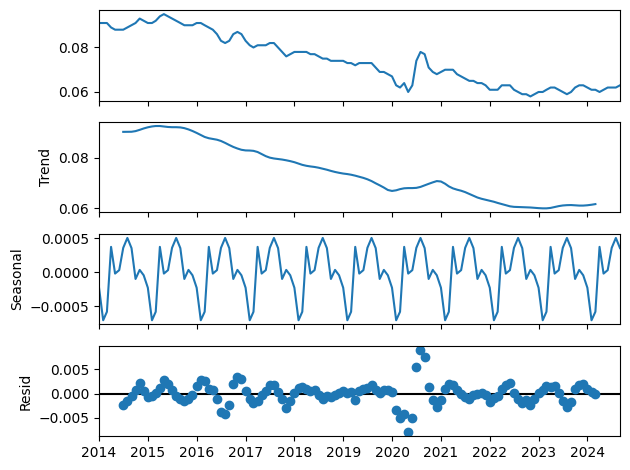

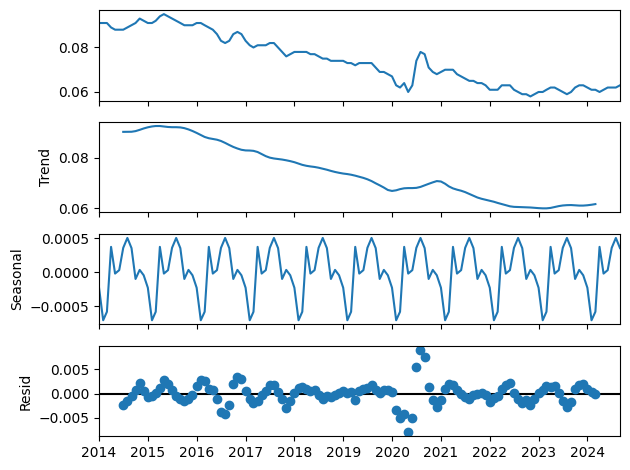

In [108]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1126.579, Time=3.51 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1051.992, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1101.728, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1129.202, Time=4.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1083.885, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1118.634, Time=0.50 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1132.662, Time=1.28 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1105.694, Time=0.84 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1047.994, Time=0.66 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1076.589, Time=0.55 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1075.260, Time=5.16 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1068.467, Time=1.34 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-1085.065, Time=2.45 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-1125.137, Time=7.50 sec

Best

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


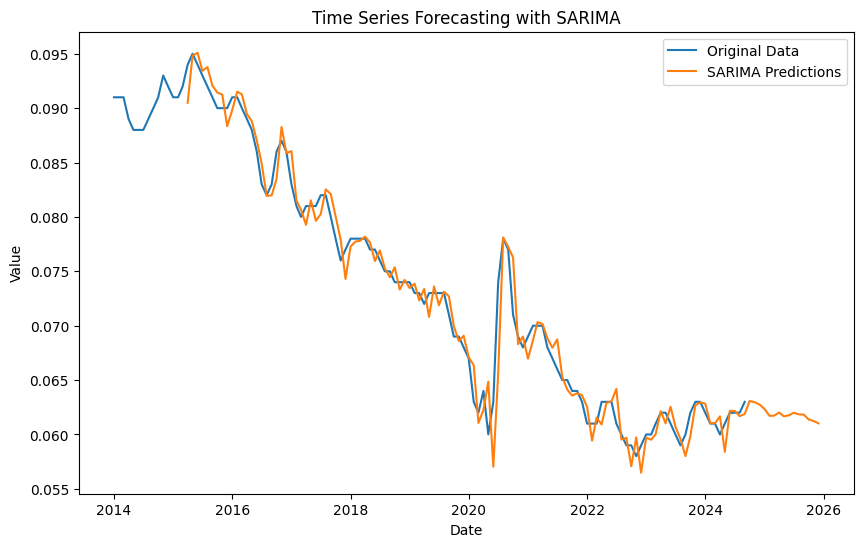

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 3.157759724730386e-06, RMSE: 0.0017770086450916286, MAPE: 1.76%


In [109]:
model_sarima(data_filtered,'France', '25+', 'Male')

>expected=0.078, predicted=0.081
>expected=0.076, predicted=0.079
>expected=0.077, predicted=0.078
>expected=0.078, predicted=0.079
>expected=0.078, predicted=0.078
>expected=0.078, predicted=0.078
>expected=0.078, predicted=0.078
>expected=0.077, predicted=0.077
>expected=0.077, predicted=0.077
>expected=0.076, predicted=0.077
>expected=0.075, predicted=0.077
>expected=0.075, predicted=0.076
>expected=0.074, predicted=0.076
>expected=0.074, predicted=0.075
>expected=0.074, predicted=0.075
>expected=0.074, predicted=0.075
>expected=0.073, predicted=0.075
>expected=0.073, predicted=0.075
>expected=0.072, predicted=0.074
>expected=0.073, predicted=0.073
>expected=0.073, predicted=0.073
>expected=0.073, predicted=0.074
>expected=0.073, predicted=0.073
>expected=0.071, predicted=0.073
>expected=0.069, predicted=0.072
>expected=0.069, predicted=0.070
>expected=0.068, predicted=0.070
>expected=0.067, predicted=0.069
>expected=0.063, predicted=0.068
>expected=0.062, predicted=0.064
>expected=

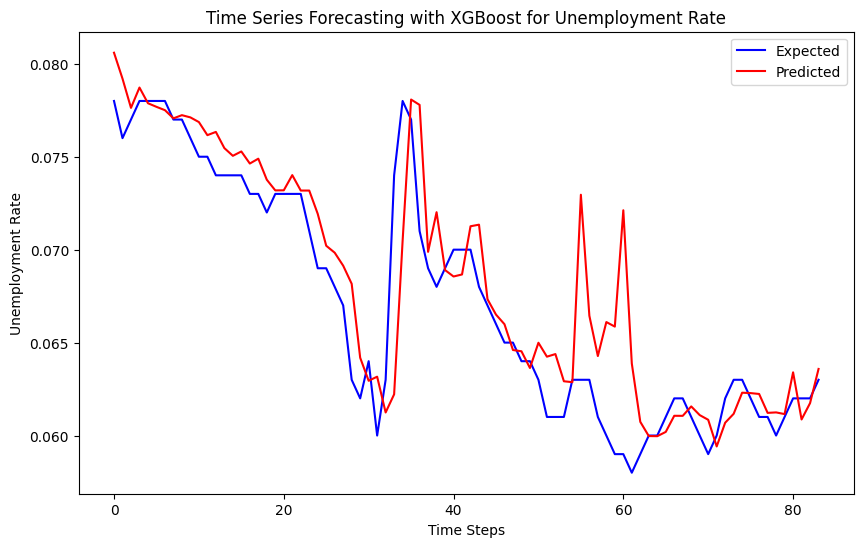

In [110]:
xgboostprediction(combined_df, country='France', age='25+', sex='Male')

### 25+, Female

In [111]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [112]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9124
Strong seasonality detected.


(0.9123691649836152, True)

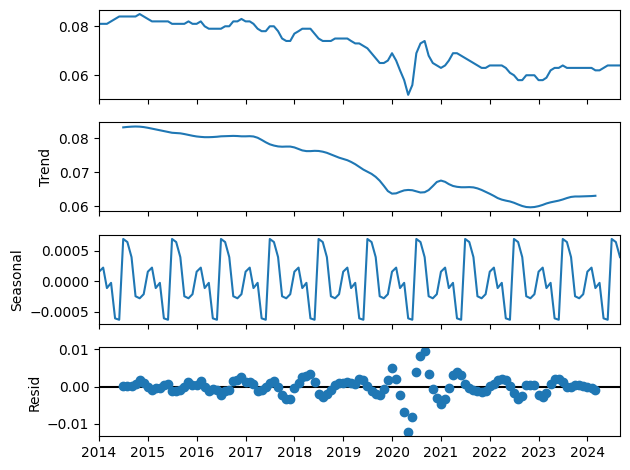

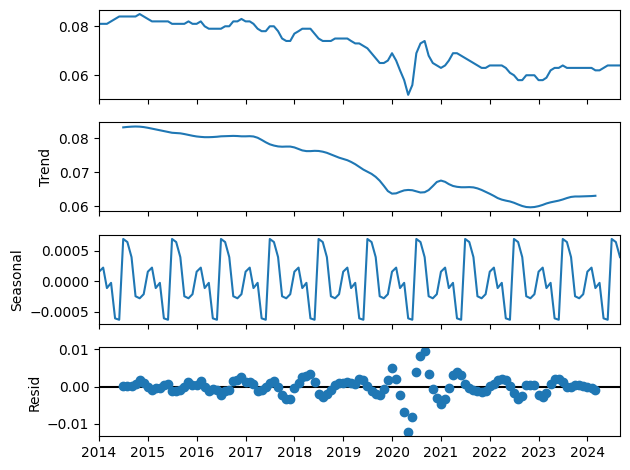

In [113]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=3.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1016.195, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1072.816, Time=0.95 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.58 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1043.454, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1089.156, Time=0.55 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1088.937, Time=0.43 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1093.195, Time=0.90 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.73 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1100.413, Time=0.90 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1079.682, Time=0.56 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-1115.384, Time=1.31 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(2,1,0)(1,1,2)[12]           

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


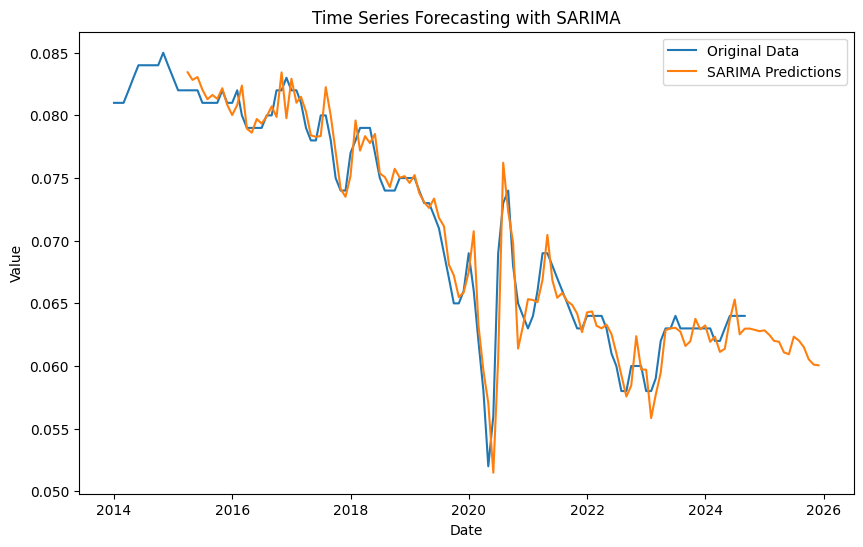

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 2.892805010422327e-06, RMSE: 0.0017008248029771694, MAPE: 1.78%


In [114]:
model_sarima(data_filtered,'France', '25+', 'Female')

>expected=0.075, predicted=0.080
>expected=0.074, predicted=0.078
>expected=0.074, predicted=0.079
>expected=0.077, predicted=0.078
>expected=0.078, predicted=0.078
>expected=0.079, predicted=0.077
>expected=0.079, predicted=0.079
>expected=0.079, predicted=0.079
>expected=0.077, predicted=0.079
>expected=0.075, predicted=0.079
>expected=0.074, predicted=0.078
>expected=0.074, predicted=0.075
>expected=0.074, predicted=0.077
>expected=0.075, predicted=0.077
>expected=0.075, predicted=0.077
>expected=0.075, predicted=0.077
>expected=0.075, predicted=0.075
>expected=0.074, predicted=0.077
>expected=0.073, predicted=0.074
>expected=0.073, predicted=0.074
>expected=0.072, predicted=0.074
>expected=0.071, predicted=0.074
>expected=0.069, predicted=0.073
>expected=0.067, predicted=0.071
>expected=0.065, predicted=0.069
>expected=0.065, predicted=0.068
>expected=0.066, predicted=0.067
>expected=0.069, predicted=0.070
>expected=0.066, predicted=0.069
>expected=0.062, predicted=0.067
>expected=

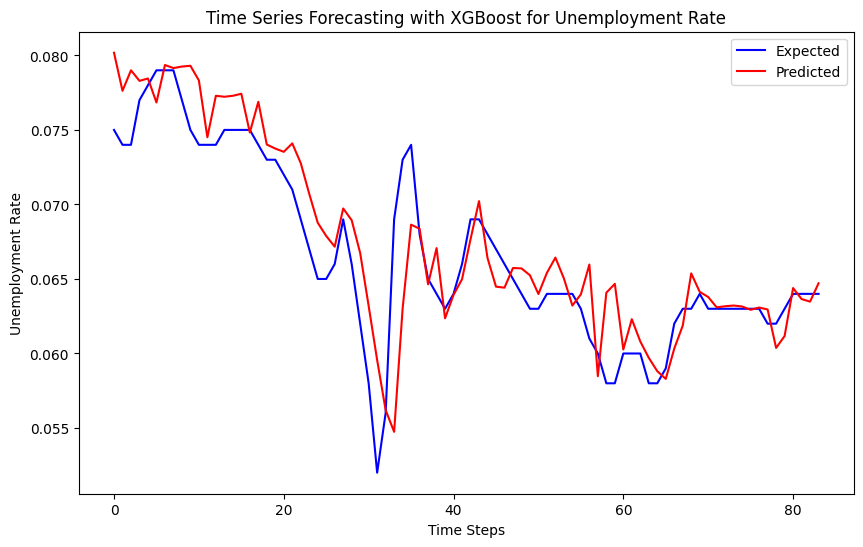

In [115]:
xgboostprediction(combined_df, country='France', age='25+', sex='Female')

### 25+, Total

In [116]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [117]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9124
Strong seasonality detected.


(0.9123691649836152, True)

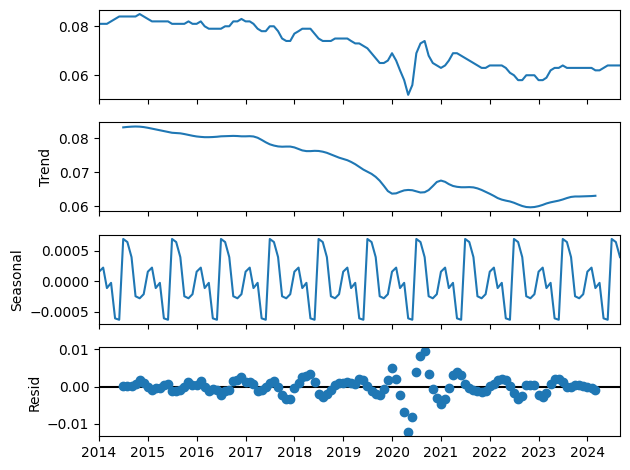

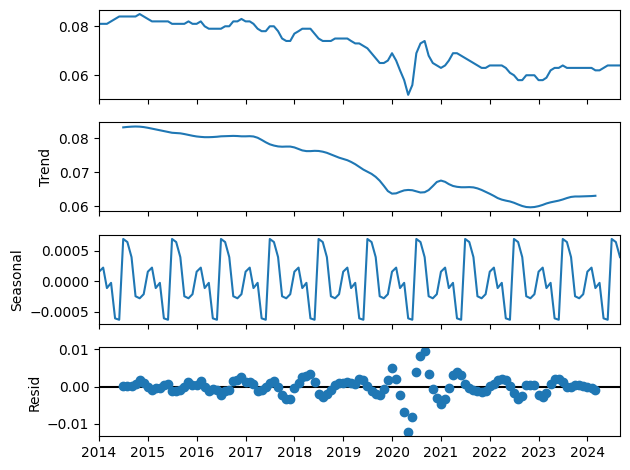

In [118]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1016.195, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1072.816, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1043.454, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1089.156, Time=0.99 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1088.937, Time=0.39 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1093.195, Time=0.59 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1100.413, Time=0.94 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1079.682, Time=0.60 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-1115.384, Time=1.65 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(2,1,0)(1,1,2)[12]           

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


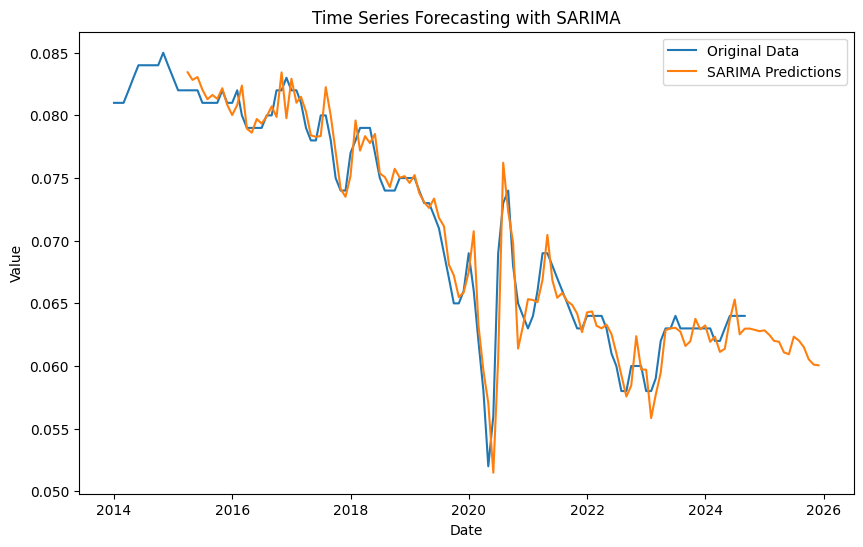

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 2.892805010422327e-06, RMSE: 0.0017008248029771694, MAPE: 1.78%


In [119]:
model_sarima(data_filtered,'France', '25+', 'Total')

>expected=0.077, predicted=0.080
>expected=0.075, predicted=0.078
>expected=0.076, predicted=0.076
>expected=0.077, predicted=0.076
>expected=0.078, predicted=0.077
>expected=0.079, predicted=0.078
>expected=0.078, predicted=0.078
>expected=0.078, predicted=0.077
>expected=0.077, predicted=0.076
>expected=0.076, predicted=0.076
>expected=0.075, predicted=0.076
>expected=0.074, predicted=0.076
>expected=0.074, predicted=0.075
>expected=0.074, predicted=0.075
>expected=0.075, predicted=0.075
>expected=0.074, predicted=0.075
>expected=0.074, predicted=0.075
>expected=0.074, predicted=0.074
>expected=0.073, predicted=0.074
>expected=0.073, predicted=0.074
>expected=0.073, predicted=0.074
>expected=0.072, predicted=0.074
>expected=0.071, predicted=0.073
>expected=0.069, predicted=0.072
>expected=0.068, predicted=0.070
>expected=0.067, predicted=0.069
>expected=0.067, predicted=0.069
>expected=0.068, predicted=0.068
>expected=0.065, predicted=0.068
>expected=0.062, predicted=0.067
>expected=

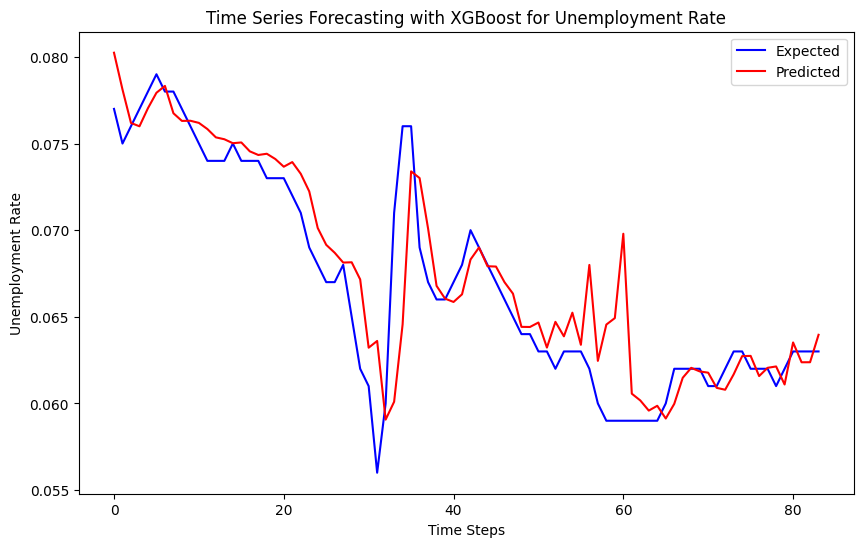

In [120]:
xgboostprediction(combined_df, country='France', age='25+', sex='Total')

## Iceland

### 15-24,Male

In [121]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Male')

In [122]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.metrics import r2_score, mean_squared_error
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from xgboost import XGBRegressor
# 
# # Підготовка даних
# data = data_filtered.copy()
# data.index = pd.to_datetime(data.index)
# 
# # Розділення на тренувальну і тестову вибірку
# train_data = data[:'2024-06']
# test_data = data['2020-01':]
# 
# # SARIMA модель
# sarima_model = SARIMAX(train_data['Value'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
# sarima_fit = sarima_model.fit(disp=False)
# 
# # Прогнозування за допомогою SARIMA
# sarima_forecast = sarima_fit.predict(start=test_data.index[0], end=test_data.index[-1])
# 
# # Підготовка даних для XGBoost
# train_data_features = np.array(train_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)
# train_data_values = train_data['Value'].values
# 
# test_data_features = np.array(test_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)
# 
# # Навчання моделі XGBoost
# xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0)
# xgb_model.fit(train_data_features, train_data_values)
# 
# # Прогнозування за допомогою XGBoost
# xgb_forecast = xgb_model.predict(test_data_features)
# 
# # Створення ансамблевого прогнозу як середнього значення SARIMA та XGBoost
# ensemble_forecast = (sarima_forecast + xgb_forecast) / 2
# 
# # Обчислення метрик якості
# r2 = r2_score(test_data['Value'], ensemble_forecast)
# rmse = np.sqrt(mean_squared_error(test_data['Value'], ensemble_forecast))
# 
# # Виведення результатів
# print(f'R^2: {r2:.4f}')
# print(f'RMSE: {rmse:.4f}')
# 
# # Візуалізація
# plt.figure(figsize=(10, 6))
# plt.plot(train_data.index, train_data['Value'], label='Train Data')
# plt.plot(test_data.index, test_data['Value'], label='Actual Test Data')
# plt.plot(test_data.index, ensemble_forecast, label='Ensemble Forecast (SARIMA + XGBoost)', linestyle='--')
# plt.legend()
# plt.xlabel('Date')
# plt.ylabel('Value')
# plt.title('Ensemble Forecast vs Actual')
# plt.show()


In [123]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9813
Strong seasonality detected.


(0.9812924578631829, True)

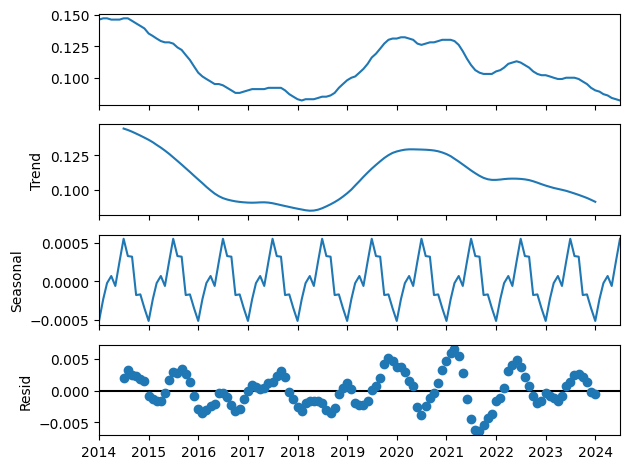

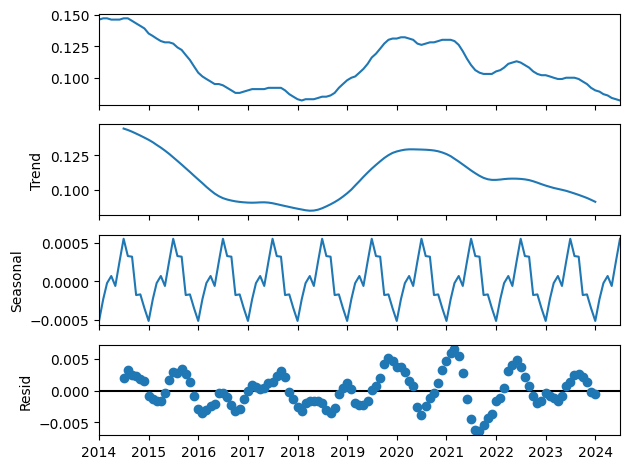

In [124]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1194.584, Time=0.82 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1017.119, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1171.174, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1108.473, Time=0.39 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1153.117, Time=0.05 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1188.021, Time=0.61 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1149.116, Time=0.22 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1171.530, Time=0.53 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1150.646, Time=0.53 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1194.391, Time=0.64 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1193.222, Time=0.66 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1192.446, Time=0.49 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1040.891, Time=0.10 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1131.884, Time=0.30 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


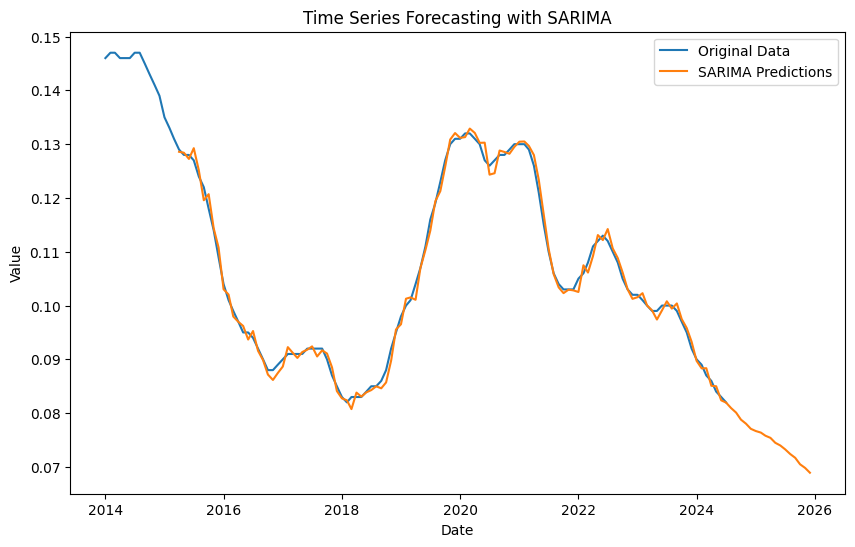

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.5398734882304533e-06, RMSE: 0.0012409163905076172, MAPE: 0.97%


In [125]:
model_sarima(data_filtered,'Iceland', '15-24', 'Male')

>expected=0.092, predicted=0.092
>expected=0.092, predicted=0.092
>expected=0.090, predicted=0.092
>expected=0.087, predicted=0.089
>expected=0.085, predicted=0.088
>expected=0.083, predicted=0.087
>expected=0.082, predicted=0.085
>expected=0.083, predicted=0.084
>expected=0.083, predicted=0.083
>expected=0.083, predicted=0.083
>expected=0.084, predicted=0.084
>expected=0.085, predicted=0.084
>expected=0.085, predicted=0.085
>expected=0.086, predicted=0.085
>expected=0.088, predicted=0.086
>expected=0.092, predicted=0.087
>expected=0.095, predicted=0.091
>expected=0.098, predicted=0.093
>expected=0.100, predicted=0.096
>expected=0.101, predicted=0.099
>expected=0.104, predicted=0.101
>expected=0.107, predicted=0.103
>expected=0.111, predicted=0.106
>expected=0.116, predicted=0.109
>expected=0.119, predicted=0.114
>expected=0.123, predicted=0.118
>expected=0.127, predicted=0.117
>expected=0.130, predicted=0.120
>expected=0.131, predicted=0.129
>expected=0.131, predicted=0.130
>expected=

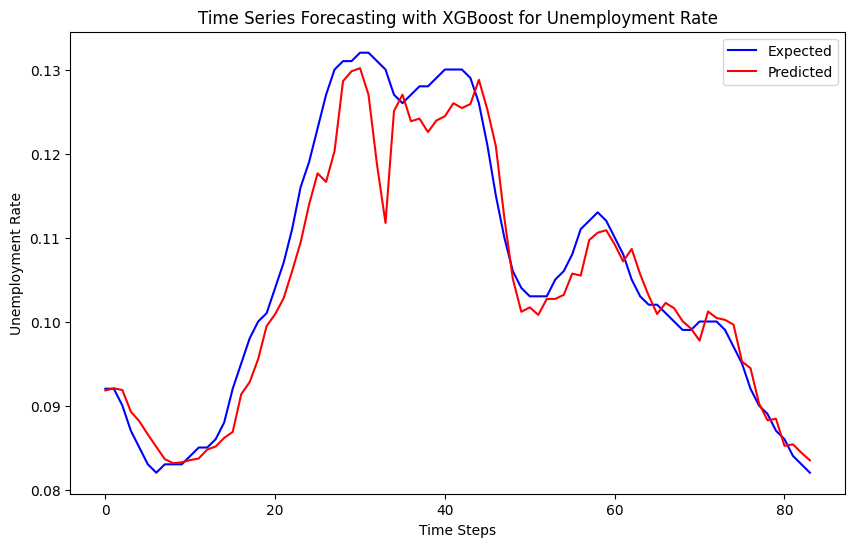

In [126]:
xgboostprediction(combined_df, country='Iceland', age='15-24', sex='Male')

### 15-24, Female

In [127]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Female')

In [128]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9397
Strong seasonality detected.


(0.9397327421595159, True)

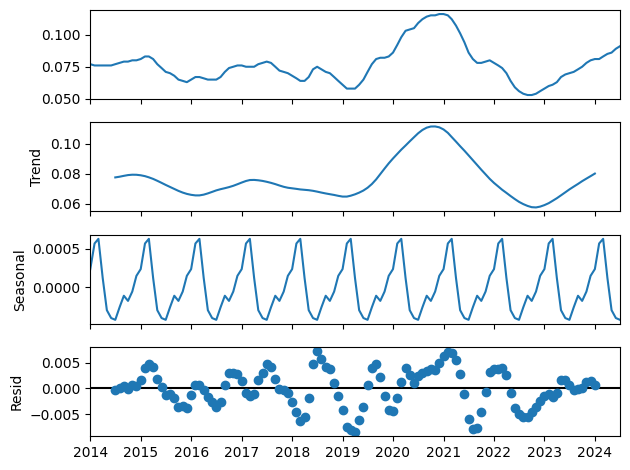

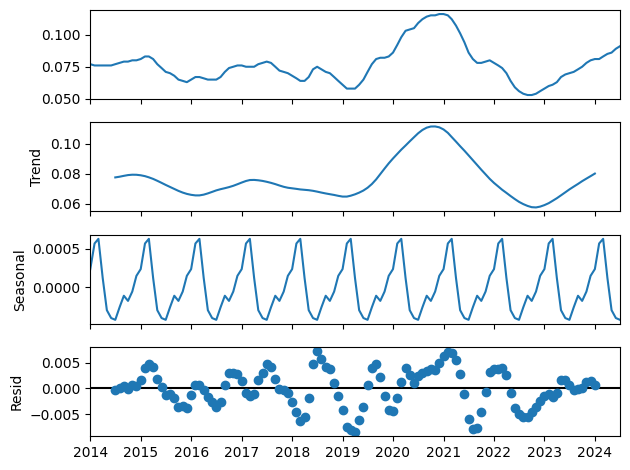

In [129]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1099.362, Time=0.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-944.048, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1080.867, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1060.300, Time=0.64 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1070.022, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1094.959, Time=0.49 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1066.022, Time=0.71 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1088.673, Time=0.11 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1101.786, Time=1.01 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1090.268, Time=1.11 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1079.341, Time=1.18 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1059.583, Time=0.99 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1073.602, Time=0.58 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1098.345, Time=1.16 sec
 ARIMA

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


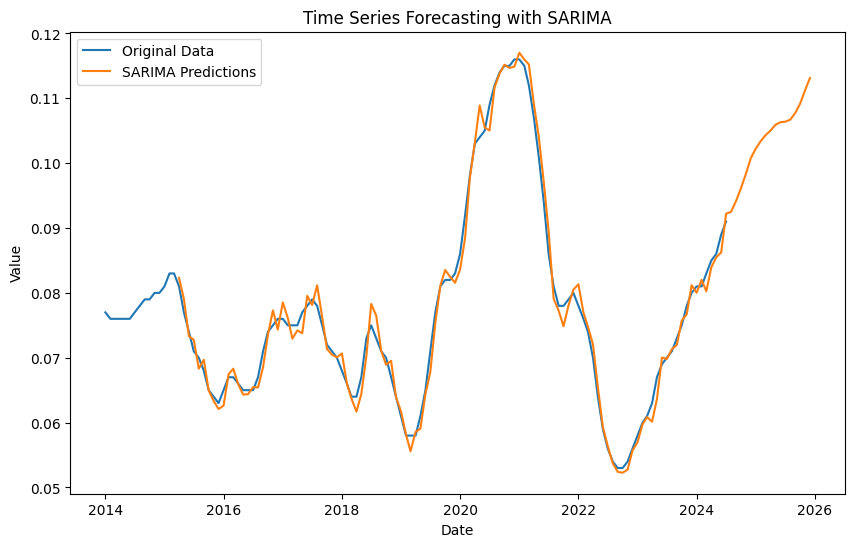

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 3.217626193006271e-06, RMSE: 0.0017937742870847131, MAPE: 1.85%


In [130]:
model_sarima(data_filtered,'Iceland', '15-24', 'Female')

>expected=0.078, predicted=0.078
>expected=0.075, predicted=0.078
>expected=0.072, predicted=0.075
>expected=0.071, predicted=0.073
>expected=0.070, predicted=0.072
>expected=0.068, predicted=0.071
>expected=0.066, predicted=0.068
>expected=0.064, predicted=0.067
>expected=0.064, predicted=0.068
>expected=0.067, predicted=0.066
>expected=0.073, predicted=0.067
>expected=0.075, predicted=0.070
>expected=0.073, predicted=0.072
>expected=0.071, predicted=0.073
>expected=0.070, predicted=0.071
>expected=0.067, predicted=0.070
>expected=0.064, predicted=0.070
>expected=0.061, predicted=0.068
>expected=0.058, predicted=0.069
>expected=0.058, predicted=0.068
>expected=0.058, predicted=0.067
>expected=0.061, predicted=0.059
>expected=0.065, predicted=0.061
>expected=0.071, predicted=0.068
>expected=0.077, predicted=0.070
>expected=0.081, predicted=0.075
>expected=0.082, predicted=0.078
>expected=0.082, predicted=0.080
>expected=0.083, predicted=0.075
>expected=0.086, predicted=0.079
>expected=

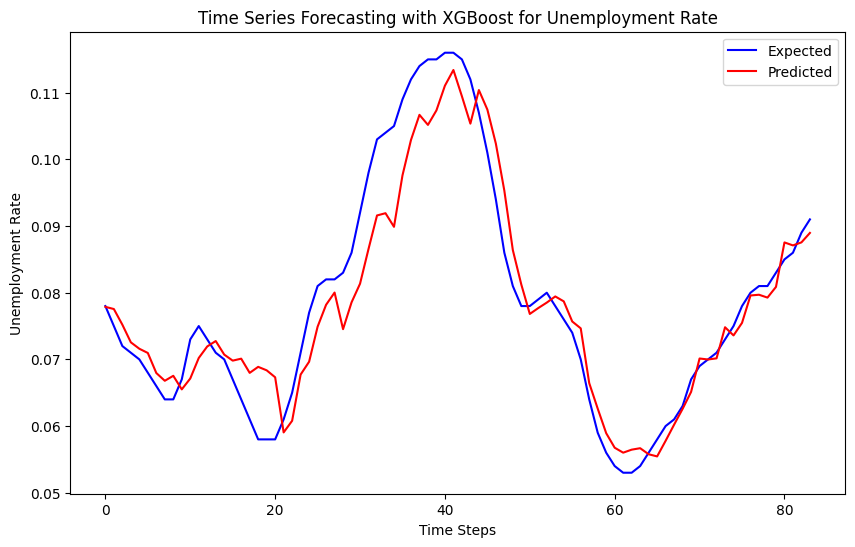

In [131]:
xgboostprediction(combined_df, country='Iceland', age='15-24', sex='Female')

### 15-24, Total

In [132]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Total')

In [133]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9676
Strong seasonality detected.


(0.9676482702765785, True)

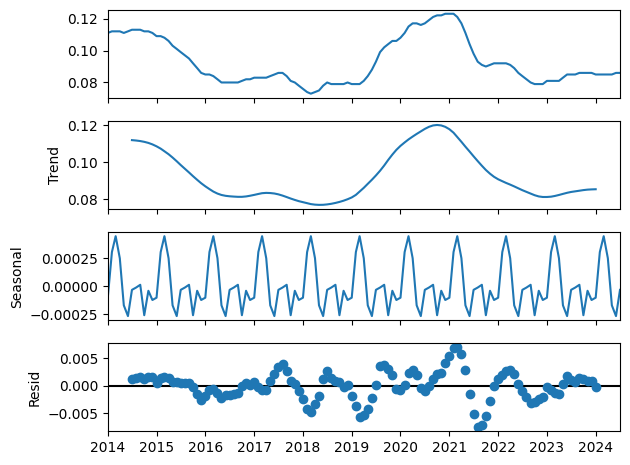

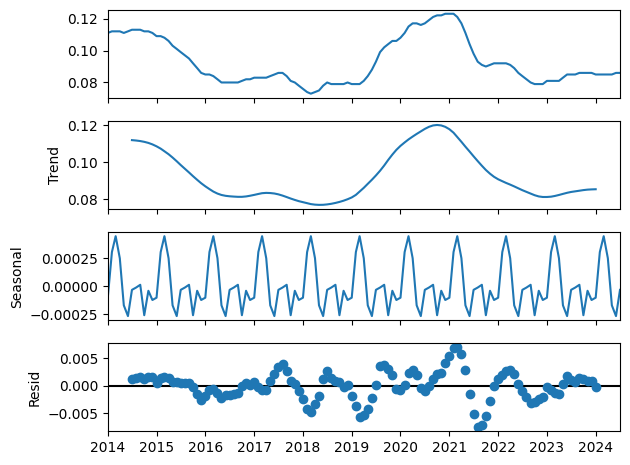

In [134]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1162.971, Time=0.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1023.826, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1151.350, Time=0.60 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1110.315, Time=0.17 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1136.794, Time=0.46 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1159.787, Time=0.94 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1132.794, Time=1.13 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1149.637, Time=0.69 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1137.727, Time=1.00 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1164.541, Time=0.60 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1138.745, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1161.333, Time=0.71 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1134.747, Time=0.40 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1139.591, Time=1.08 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


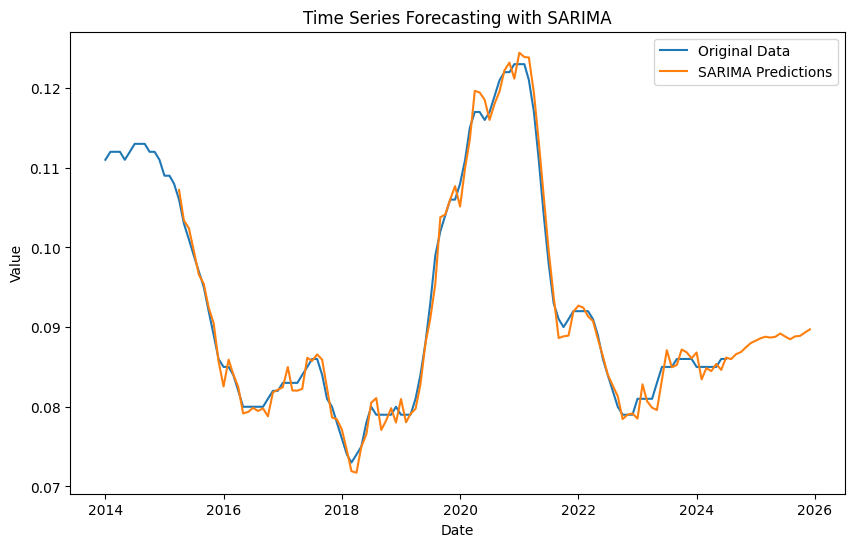

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.962101983296195e-06, RMSE: 0.0014007505071554302, MAPE: 1.23%


In [135]:
model_sarima(data_filtered,'Iceland', '15-24', 'Total')

>expected=0.086, predicted=0.085
>expected=0.084, predicted=0.085
>expected=0.081, predicted=0.084
>expected=0.080, predicted=0.082
>expected=0.078, predicted=0.081
>expected=0.076, predicted=0.081
>expected=0.074, predicted=0.079
>expected=0.073, predicted=0.075
>expected=0.074, predicted=0.074
>expected=0.075, predicted=0.074
>expected=0.078, predicted=0.076
>expected=0.080, predicted=0.078
>expected=0.079, predicted=0.080
>expected=0.079, predicted=0.080
>expected=0.079, predicted=0.080
>expected=0.079, predicted=0.080
>expected=0.080, predicted=0.079
>expected=0.079, predicted=0.080
>expected=0.079, predicted=0.080
>expected=0.079, predicted=0.079
>expected=0.081, predicted=0.079
>expected=0.084, predicted=0.081
>expected=0.088, predicted=0.081
>expected=0.093, predicted=0.081
>expected=0.099, predicted=0.084
>expected=0.102, predicted=0.096
>expected=0.104, predicted=0.101
>expected=0.106, predicted=0.103
>expected=0.106, predicted=0.094
>expected=0.108, predicted=0.090
>expected=

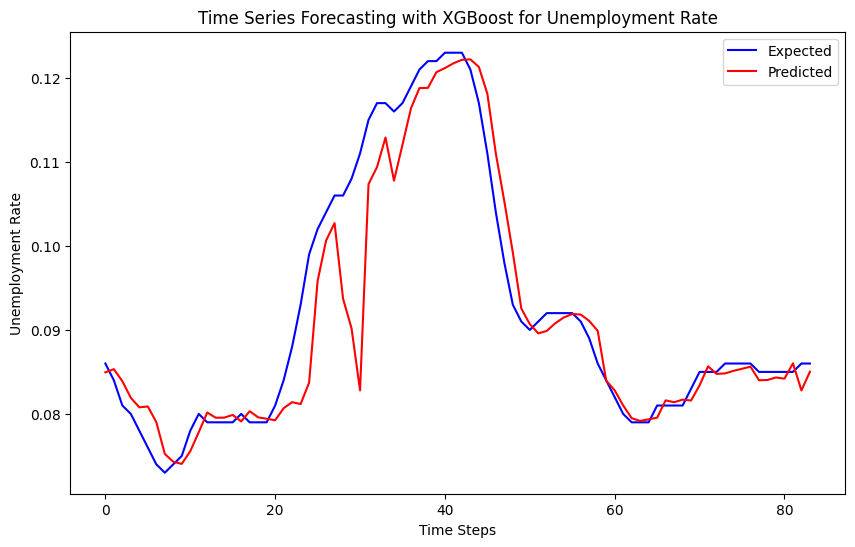

In [136]:
xgboostprediction(combined_df, country='Iceland', age='15-24', sex='Total')

### 25+, Male

In [137]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Male')

In [138]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9742
Strong seasonality detected.


(0.9742104425914374, True)

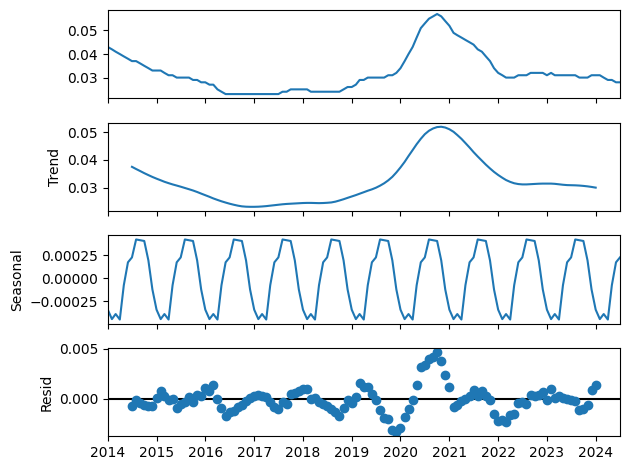

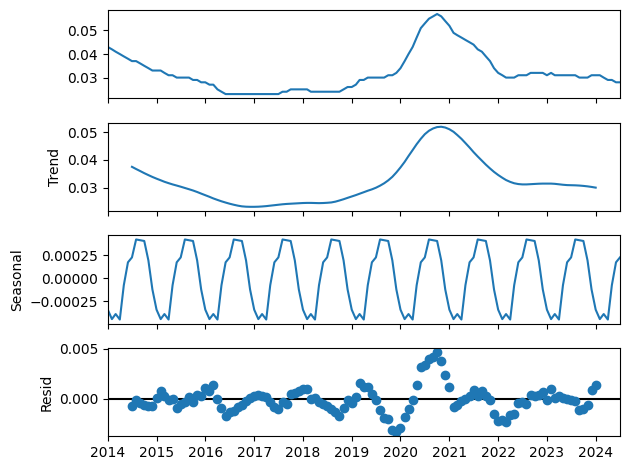

In [139]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1273.324, Time=1.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1130.026, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1242.520, Time=1.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1214.272, Time=0.54 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1234.247, Time=0.65 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1255.340, Time=0.74 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1230.248, Time=1.07 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1252.293, Time=0.40 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1245.806, Time=0.82 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1266.325, Time=0.51 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1272.038, Time=0.36 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1283.315, Time=0.81 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1245.787, Time=0.42 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1268.129, Time=0.52 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


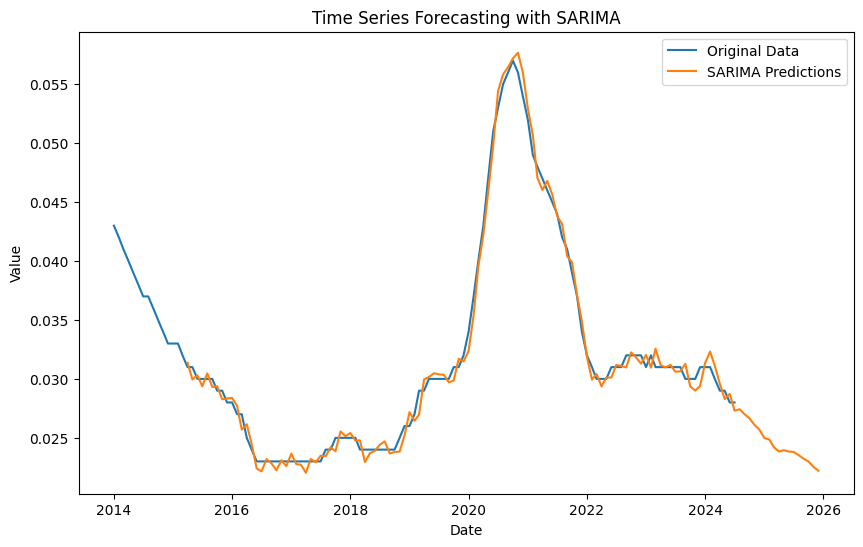

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 6.738543521847934e-07, RMSE: 0.0008208863211095635, MAPE: 2.17%


In [140]:
model_sarima(data_filtered,'Iceland', '25+', 'Male')

>expected=0.024, predicted=0.023
>expected=0.024, predicted=0.023
>expected=0.025, predicted=0.024
>expected=0.025, predicted=0.024
>expected=0.025, predicted=0.025
>expected=0.025, predicted=0.025
>expected=0.025, predicted=0.025
>expected=0.024, predicted=0.025
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.025, predicted=0.024
>expected=0.026, predicted=0.024
>expected=0.026, predicted=0.025
>expected=0.027, predicted=0.026
>expected=0.029, predicted=0.026
>expected=0.029, predicted=0.027
>expected=0.030, predicted=0.029
>expected=0.030, predicted=0.029
>expected=0.030, predicted=0.029
>expected=0.030, predicted=0.029
>expected=0.030, predicted=0.030
>expected=0.031, predicted=0.029
>expected=0.031, predicted=0.029
>expected=0.032, predicted=0.030
>expected=0.034, predicted=0.031
>expected=

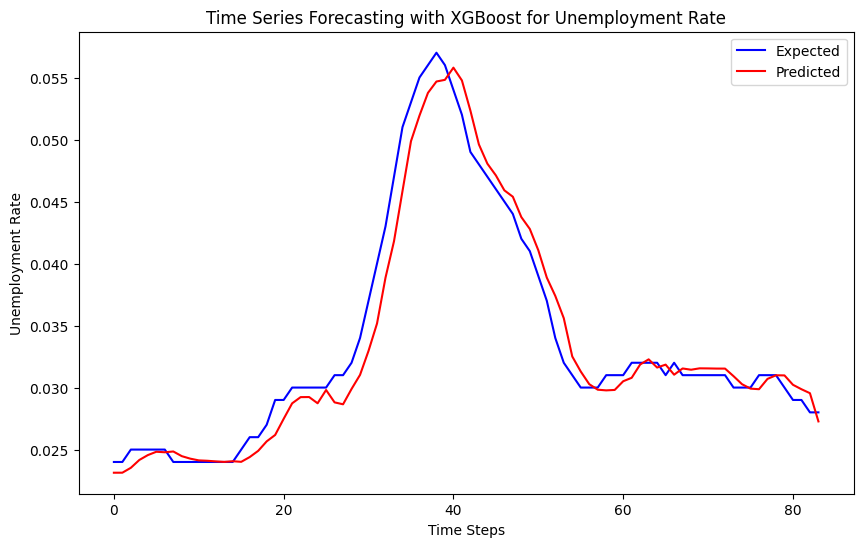

In [141]:
xgboostprediction(combined_df, country='Iceland', age='25+', sex='Male')

### 25+, Female

In [142]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Female')

In [143]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9738
Strong seasonality detected.


(0.9738122193325509, True)

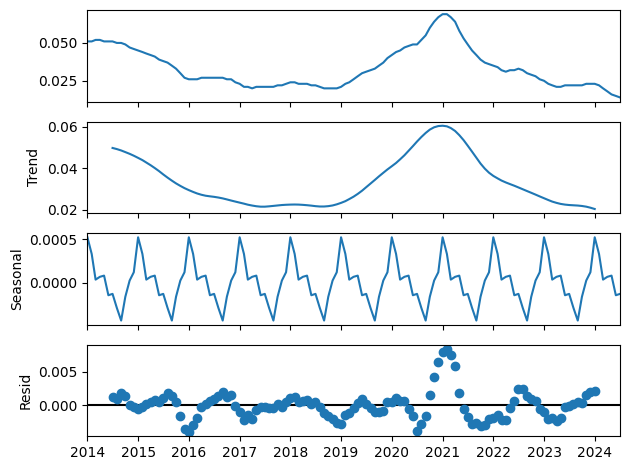

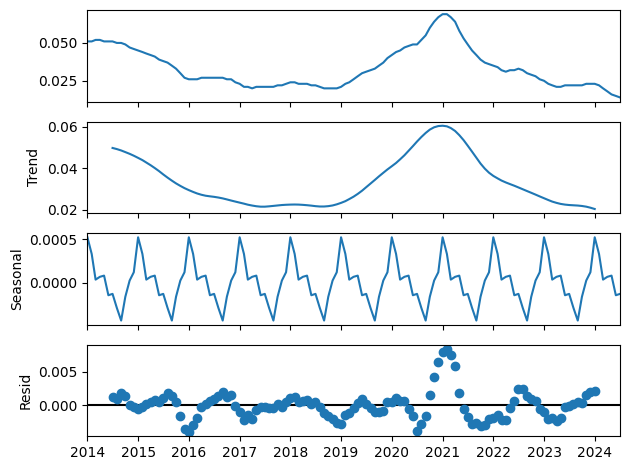

In [144]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1210.372, Time=1.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1048.573, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1190.181, Time=0.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1134.567, Time=0.36 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1167.290, Time=0.48 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1196.507, Time=0.82 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1163.287, Time=1.00 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1185.943, Time=0.22 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1185.731, Time=1.11 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1210.929, Time=0.85 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1167.177, Time=0.11 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1197.521, Time=1.24 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1163.178, Time=1.35 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1186.809, Time=0.54 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1908: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,1,0)(1,1,2)[12]             : AIC=-1184.064, Time=0.62 sec
 ARIMA(3,1,0)(0,1,1)[12]             : AIC=-1218.379, Time=0.93 sec
 ARIMA(3,1,0)(0,1,0)[12]             : AIC=-1172.795, Time=0.40 sec
 ARIMA(3,1,0)(1,1,1)[12]             : AIC=-1206.082, Time=1.21 sec
 ARIMA(3,1,0)(0,1,2)[12]             : AIC=-1168.798, Time=1.04 sec
 ARIMA(3,1,0)(1,1,0)[12]             : AIC=-1197.756, Time=0.81 sec
 ARIMA(3,1,0)(1,1,2)[12]             : AIC=-1194.558, Time=2.58 sec
 ARIMA(4,1,0)(0,1,1)[12]             : AIC=-1218.280, Time=1.16 sec
 ARIMA(3,1,1)(0,1,1)[12]             : AIC=-1214.234, Time=1.35 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1076.687, Time=0.88 sec
 ARIMA(4,1,1)(0,1,1)[12]             : AIC=-1216.804, Time=1.08 sec
 ARIMA(3,1,0)(0,1,1)[12] intercept   : AIC=-1216.389, Time=1.22 sec

Best model:  ARIMA(3,1,0)(0,1,1)[12]          
Total fit time: 26.791 seconds
                                      SARIMAX Results                                       
Dep. Variabl

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


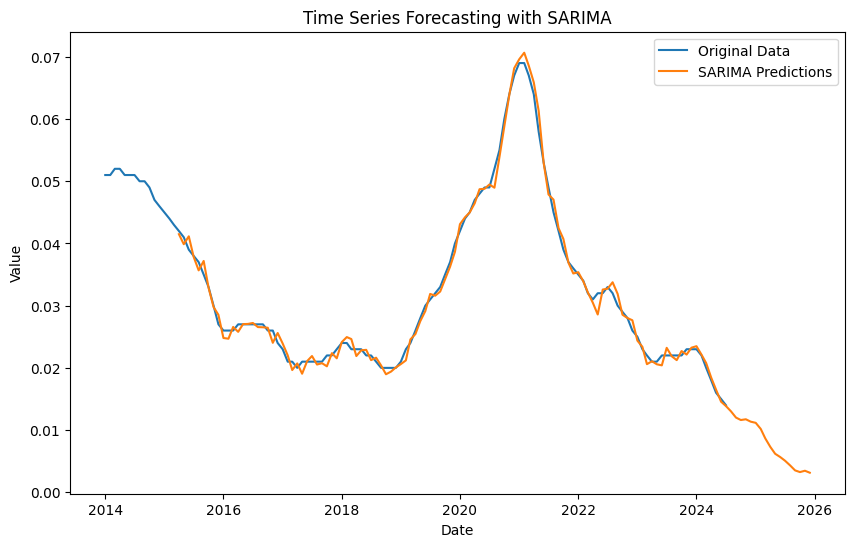

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.2297544556470907e-06, RMSE: 0.001108942945172154, MAPE: 2.91%


In [145]:
model_sarima(data_filtered,'Iceland', '25+', 'Female')

>expected=0.021, predicted=0.021
>expected=0.021, predicted=0.021
>expected=0.022, predicted=0.021
>expected=0.022, predicted=0.021
>expected=0.023, predicted=0.021
>expected=0.024, predicted=0.022
>expected=0.024, predicted=0.023
>expected=0.023, predicted=0.024
>expected=0.023, predicted=0.023
>expected=0.023, predicted=0.023
>expected=0.022, predicted=0.023
>expected=0.022, predicted=0.022
>expected=0.021, predicted=0.022
>expected=0.020, predicted=0.022
>expected=0.020, predicted=0.021
>expected=0.020, predicted=0.021
>expected=0.020, predicted=0.021
>expected=0.021, predicted=0.020
>expected=0.023, predicted=0.021
>expected=0.024, predicted=0.023
>expected=0.026, predicted=0.024
>expected=0.028, predicted=0.024
>expected=0.030, predicted=0.027
>expected=0.031, predicted=0.028
>expected=0.032, predicted=0.029
>expected=0.033, predicted=0.030
>expected=0.035, predicted=0.031
>expected=0.037, predicted=0.033
>expected=0.040, predicted=0.033
>expected=0.042, predicted=0.038
>expected=

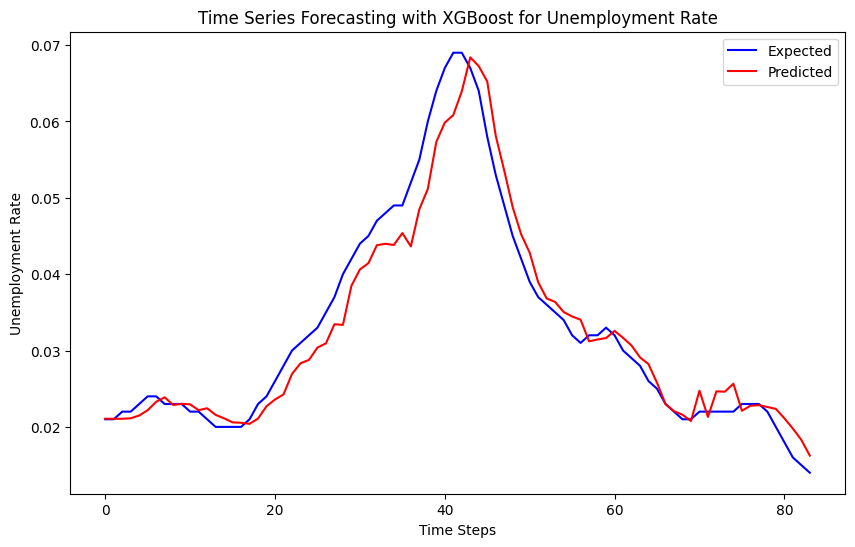

In [146]:
xgboostprediction(combined_df, country='Iceland', age='25+', sex='Female')

### 25+, Total

In [147]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Total')

In [148]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9857
Strong seasonality detected.


(0.9856988512271608, True)

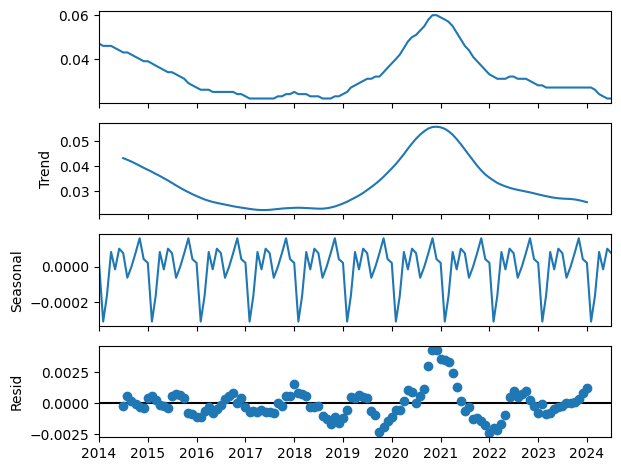

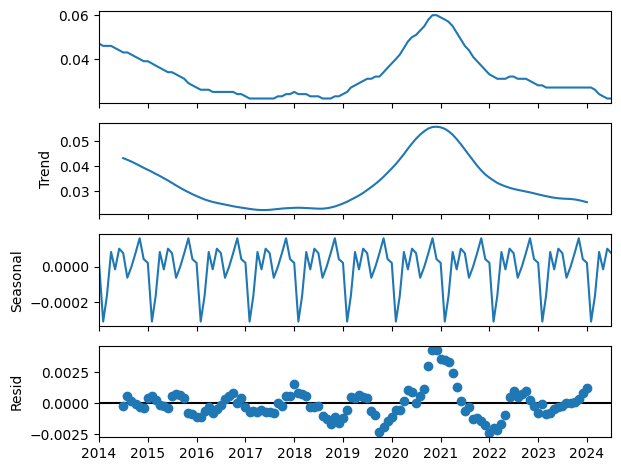

In [149]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1278.301, Time=0.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1118.047, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1263.937, Time=0.66 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1199.058, Time=0.38 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1244.302, Time=0.13 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1265.725, Time=0.93 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1240.301, Time=0.29 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1267.449, Time=0.73 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1263.316, Time=0.87 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1275.004, Time=0.40 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1279.133, Time=0.68 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1243.918, Time=0.59 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1266.966, Time=0.99 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1239.919, Time=1.73 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


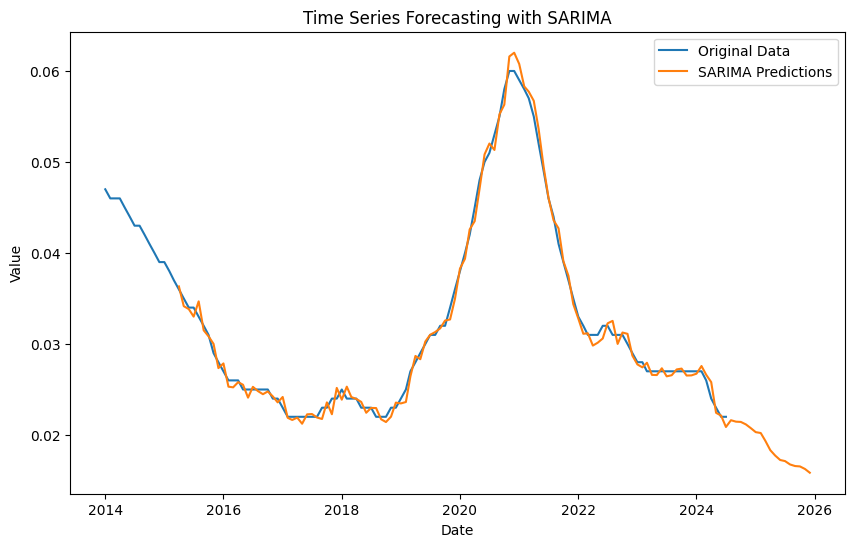

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 7.179021261893057e-07, RMSE: 0.0008472910516400523, MAPE: 2.20%


In [150]:
model_sarima(data_filtered,'Iceland', '25+', 'Total')

>expected=0.022, predicted=0.022
>expected=0.023, predicted=0.022
>expected=0.023, predicted=0.022
>expected=0.024, predicted=0.023
>expected=0.024, predicted=0.023
>expected=0.025, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.024, predicted=0.024
>expected=0.023, predicted=0.024
>expected=0.023, predicted=0.023
>expected=0.023, predicted=0.023
>expected=0.022, predicted=0.023
>expected=0.022, predicted=0.022
>expected=0.022, predicted=0.022
>expected=0.023, predicted=0.022
>expected=0.023, predicted=0.022
>expected=0.024, predicted=0.023
>expected=0.025, predicted=0.024
>expected=0.027, predicted=0.024
>expected=0.028, predicted=0.026
>expected=0.029, predicted=0.027
>expected=0.030, predicted=0.028
>expected=0.031, predicted=0.029
>expected=0.031, predicted=0.029
>expected=0.032, predicted=0.028
>expected=0.032, predicted=0.031
>expected=0.034, predicted=0.029
>expected=0.036, predicted=0.033
>expected=0.038, predicted=0.033
>expected=

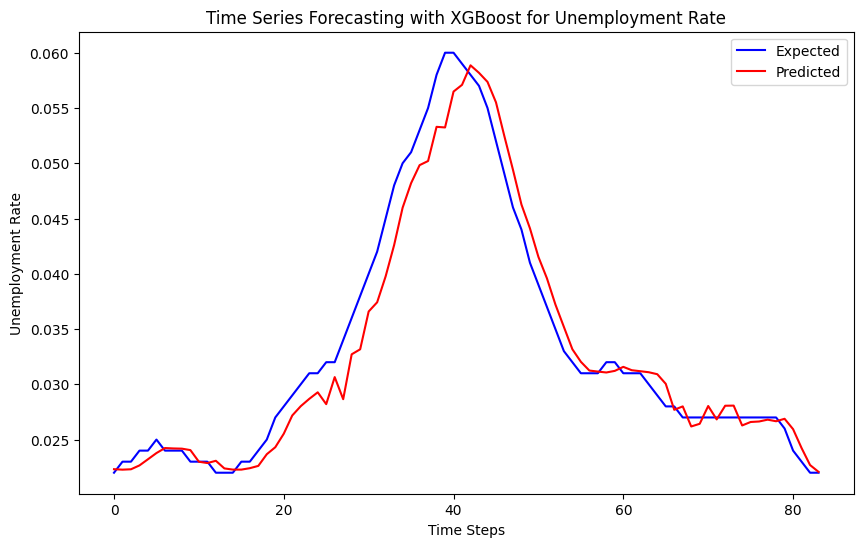

In [151]:
xgboostprediction(combined_df, country='Iceland', age='25+', sex='Total')

## Greece

### 15-24, Female

In [152]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Female')

In [153]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7946
Strong seasonality detected.


(0.7946129418391116, True)

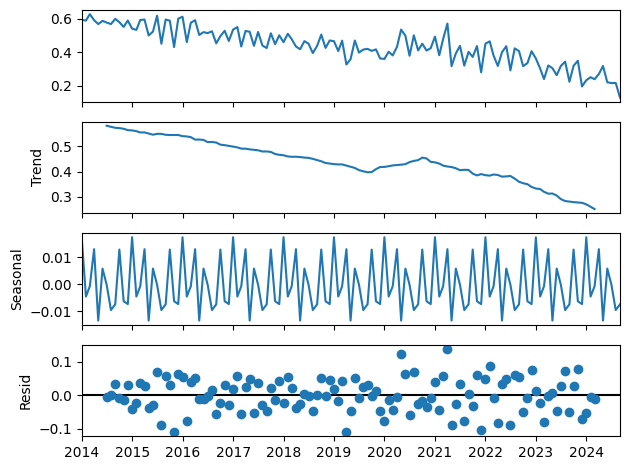

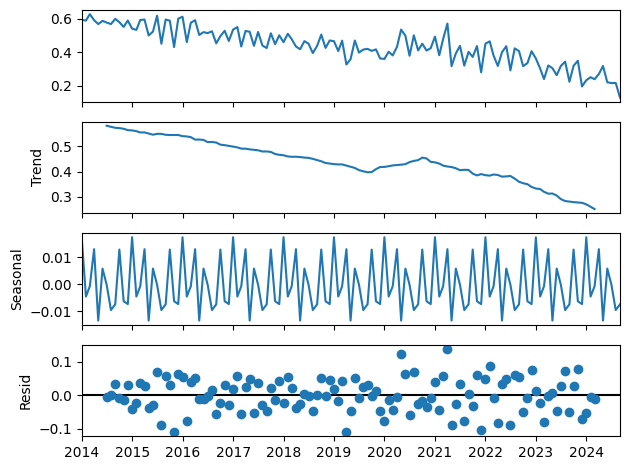

In [154]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-160.273, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-235.484, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-187.091, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-252.718, Time=0.40 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-259.476, Time=0.71 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-260.133, Time=0.35 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-261.557, Time=0.47 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-234.346, Time=0.44 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=1.65 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-306.816, Time=0.96 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=i

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


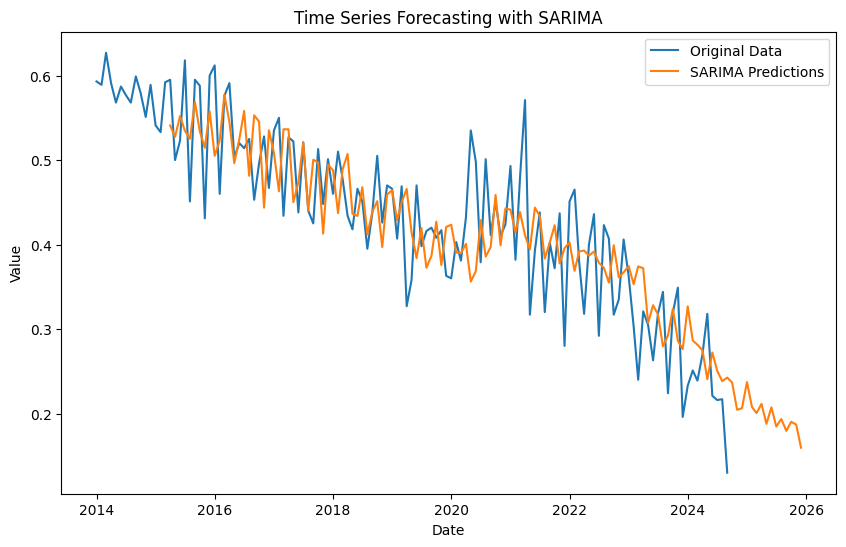

R^2 Score for SARIMA: 0.60
SARIMA - MSE: 0.0036612942193702245, RMSE: 0.06050862929673936, MAPE: 12.31%


In [155]:
model_sarima(data_filtered,'Greece', '15-24', 'Female')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-152.697, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-199.536, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-154.694, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-306.604, Time=0.23 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-333.858, Time=0.17 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-379.192, Time=0.38 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-382.091, Time=0.19 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-373.510, Time=0.20 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=inf

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


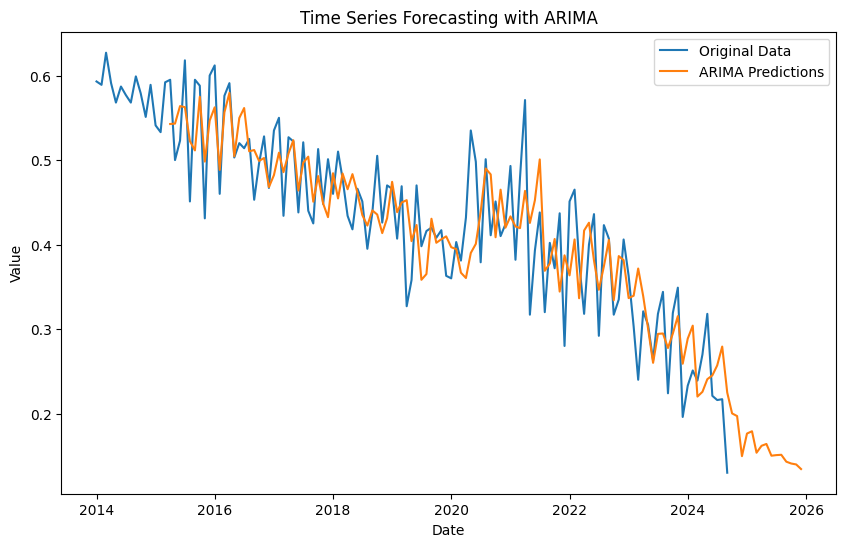

R^2 Score for ARIMA: 0.70
ARIMA - MSE: 0.0027035783125206264, RMSE: 0.05199594515460438, MAPE: 10.85%


In [156]:
model_arima(data_filtered,'Greece', '15-24', 'Female')

>expected=0.513, predicted=0.457
>expected=0.448, predicted=0.469
>expected=0.501, predicted=0.476
>expected=0.460, predicted=0.476
>expected=0.510, predicted=0.481
>expected=0.478, predicted=0.508
>expected=0.434, predicted=0.477
>expected=0.418, predicted=0.472
>expected=0.466, predicted=0.458
>expected=0.451, predicted=0.430
>expected=0.395, predicted=0.466
>expected=0.438, predicted=0.465
>expected=0.505, predicted=0.433
>expected=0.426, predicted=0.482
>expected=0.470, predicted=0.448
>expected=0.466, predicted=0.449
>expected=0.407, predicted=0.482
>expected=0.469, predicted=0.448
>expected=0.327, predicted=0.434
>expected=0.358, predicted=0.421
>expected=0.470, predicted=0.472
>expected=0.398, predicted=0.364
>expected=0.416, predicted=0.428
>expected=0.420, predicted=0.432
>expected=0.408, predicted=0.448
>expected=0.417, predicted=0.409
>expected=0.363, predicted=0.396
>expected=0.360, predicted=0.375
>expected=0.403, predicted=0.405
>expected=0.381, predicted=0.385
>expected=

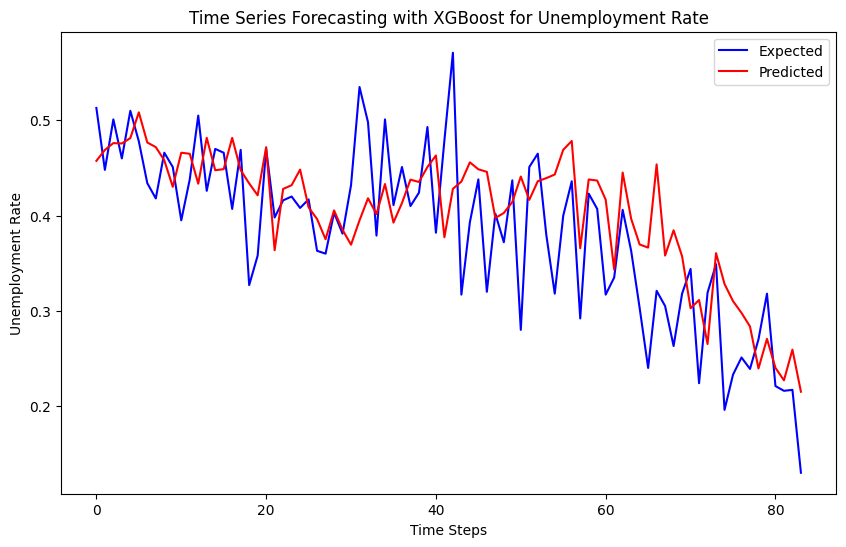

In [157]:
xgboostprediction(combined_df, country='Greece', age='15-24', sex='Female')

### 15-24, Male

In [158]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Male')

In [159]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8994
Strong seasonality detected.


(0.8993739750634893, True)

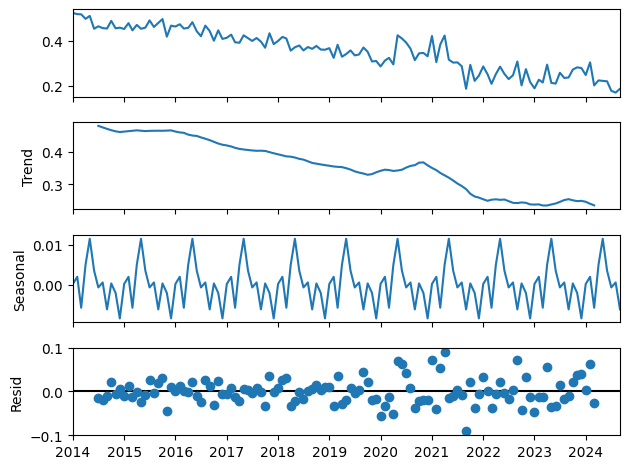

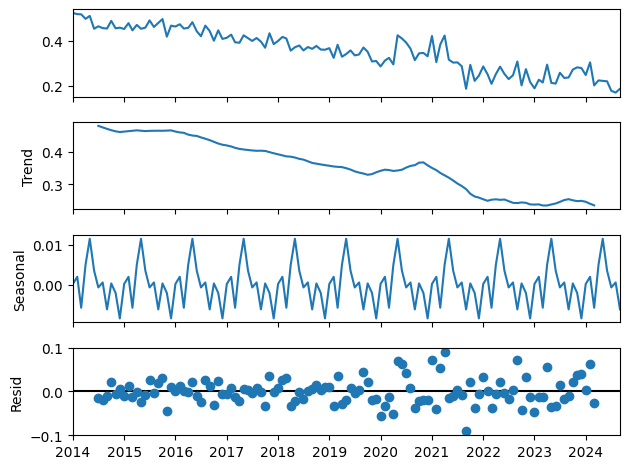

In [160]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-308.747, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-378.287, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-334.778, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-382.606, Time=0.19 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-352.135, Time=0.12 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-400.836, Time=0.50 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-391.909, Time=0.39 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-398.966, Time=0.80 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-398.9

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


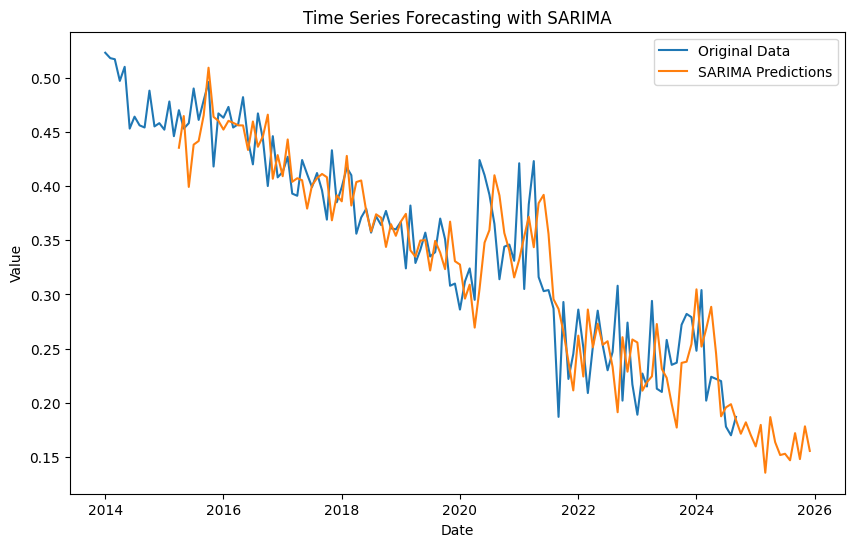

R^2 Score for SARIMA: 0.76
SARIMA - MSE: 0.001687988174414246, RMSE: 0.04108513325296933, MAPE: 10.40%


In [161]:
model_sarima(data_filtered,'Greece', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-303.878, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-372.996, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-305.877, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-435.662, Time=0.07 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-453.051, Time=0.50 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-478.797, Time=0.18 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-480.854, Time=0.19 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-480.976, Time=0.36 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-48

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


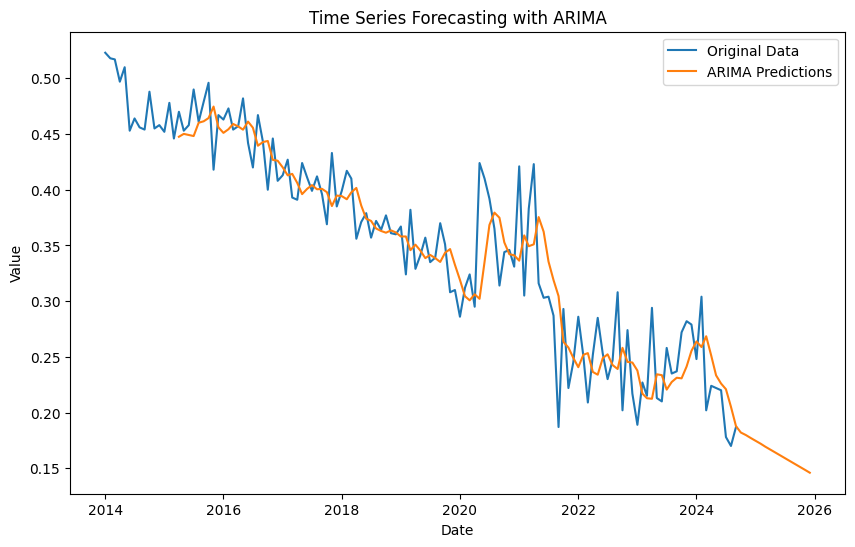

R^2 Score for ARIMA: 0.82
ARIMA - MSE: 0.00123750282185878, RMSE: 0.03517815830680708, MAPE: 8.43%


In [162]:
model_arima(data_filtered,'Greece', '15-24', 'Male')

>expected=0.369, predicted=0.406
>expected=0.433, predicted=0.393
>expected=0.385, predicted=0.408
>expected=0.399, predicted=0.389
>expected=0.417, predicted=0.419
>expected=0.410, predicted=0.404
>expected=0.356, predicted=0.396
>expected=0.371, predicted=0.404
>expected=0.379, predicted=0.392
>expected=0.357, predicted=0.377
>expected=0.372, predicted=0.392
>expected=0.364, predicted=0.385
>expected=0.377, predicted=0.372
>expected=0.361, predicted=0.377
>expected=0.360, predicted=0.370
>expected=0.367, predicted=0.362
>expected=0.324, predicted=0.364
>expected=0.382, predicted=0.349
>expected=0.329, predicted=0.369
>expected=0.341, predicted=0.363
>expected=0.357, predicted=0.351
>expected=0.335, predicted=0.351
>expected=0.339, predicted=0.343
>expected=0.370, predicted=0.333
>expected=0.351, predicted=0.341
>expected=0.308, predicted=0.346
>expected=0.310, predicted=0.342
>expected=0.286, predicted=0.333
>expected=0.312, predicted=0.320
>expected=0.324, predicted=0.310
>expected=

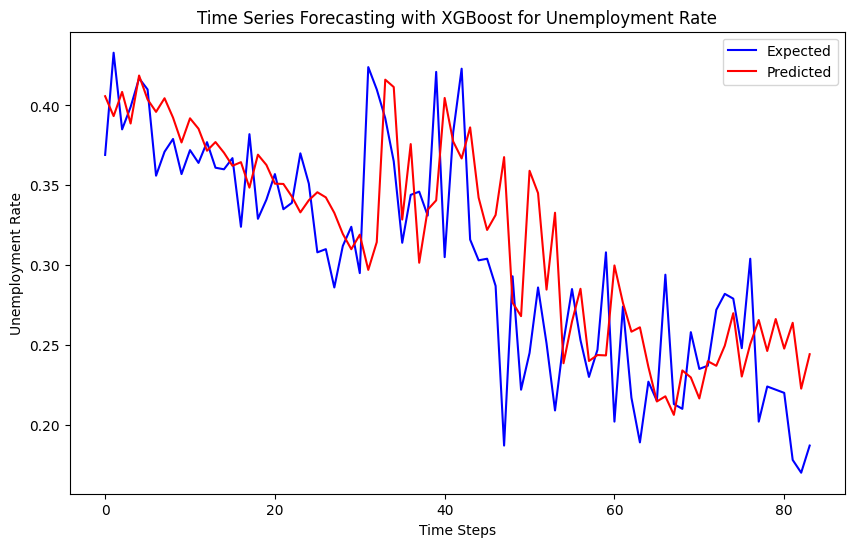

In [163]:
xgboostprediction(combined_df, country='Greece', age='15-24', sex='Male')

### 15-24, Total

In [164]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Total')

In [165]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8878
Strong seasonality detected.


(0.8877832829807306, True)

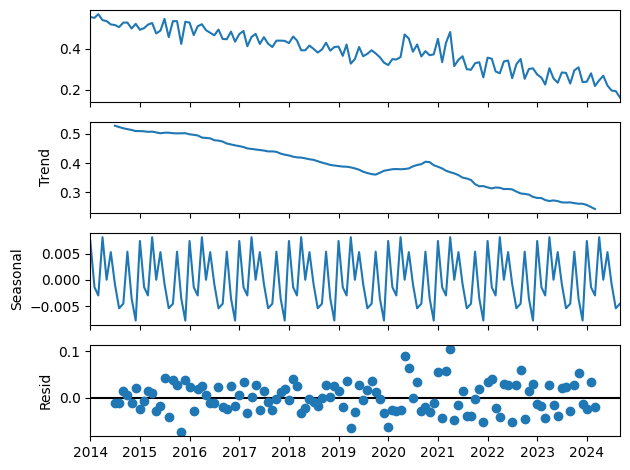

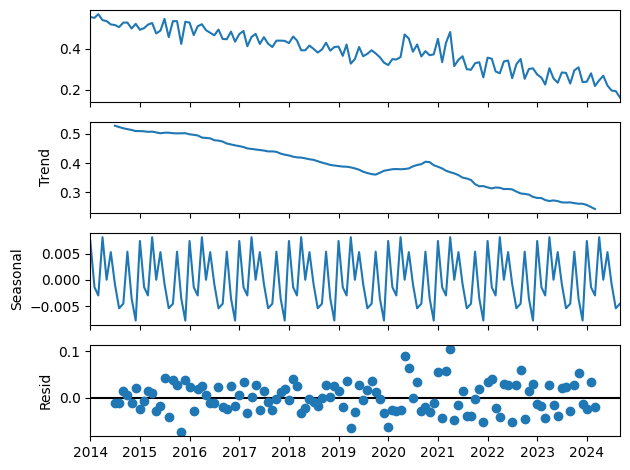

In [166]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-269.728, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-343.133, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.73 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-287.780, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-354.877, Time=0.54 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-365.910, Time=0.93 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-367.808, Time=0.55 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-366.501, Time=0.94 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-368.115, Time=0.57 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-343.610, Time=0.24 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


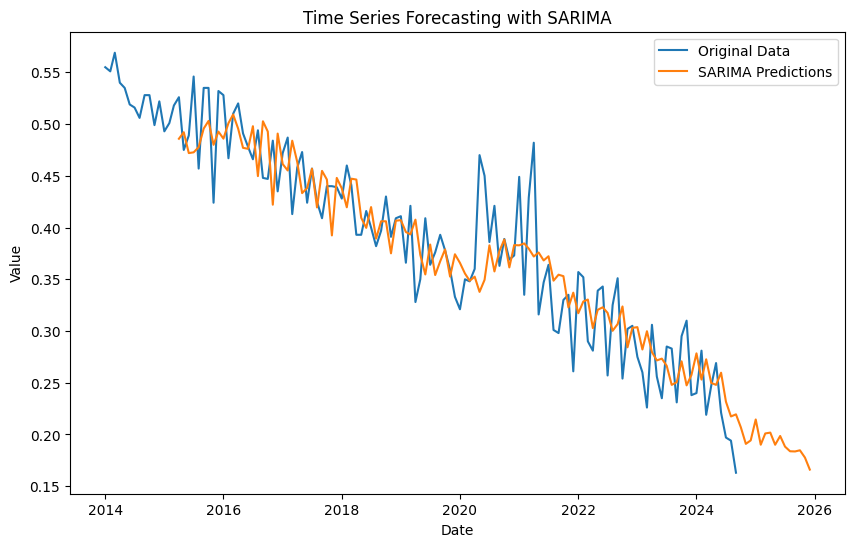

R^2 Score for SARIMA: 0.77
SARIMA - MSE: 0.0016101860920623501, RMSE: 0.04012712414392975, MAPE: 8.79%


In [167]:
model_sarima(data_filtered,'Greece', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-280.350, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-320.545, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-282.350, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-441.587, Time=0.15 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-457.478, Time=0.26 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-484.908, Time=0.72 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-491.208, Time=1.09 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-499.071, Time=0.60 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-495.501, Time=0.23 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=inf, Time=0.88 sec

Best model:  ARIMA(3,2,2)(0,0,0)[0] int

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertib

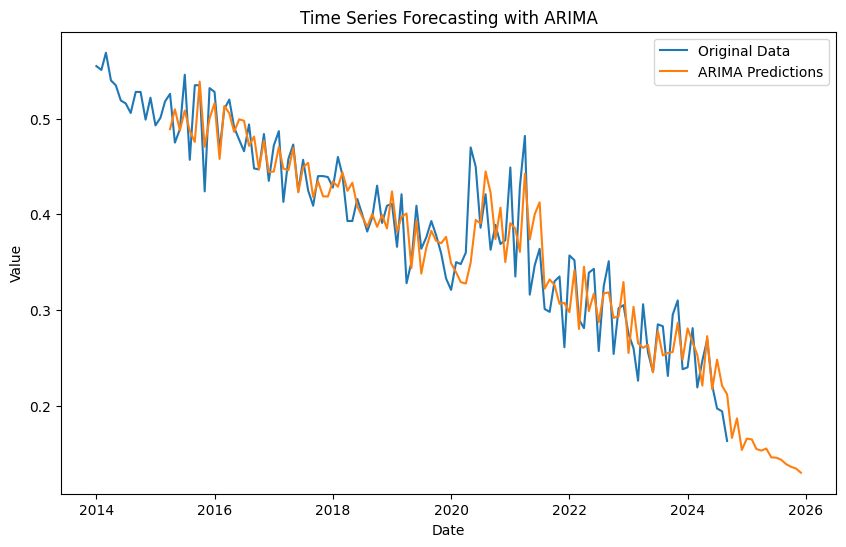

R^2 Score for ARIMA: 0.85
ARIMA - MSE: 0.001030193101096767, RMSE: 0.03209662133460105, MAPE: 7.04%


In [168]:
model_arima(data_filtered,'Greece', '15-24', 'Total')

>expected=0.440, predicted=0.434
>expected=0.440, predicted=0.421
>expected=0.439, predicted=0.430
>expected=0.428, predicted=0.427
>expected=0.460, predicted=0.428
>expected=0.441, predicted=0.436
>expected=0.393, predicted=0.450
>expected=0.393, predicted=0.418
>expected=0.416, predicted=0.427
>expected=0.400, predicted=0.402
>expected=0.382, predicted=0.413
>expected=0.397, predicted=0.403
>expected=0.430, predicted=0.397
>expected=0.391, predicted=0.396
>expected=0.409, predicted=0.418
>expected=0.411, predicted=0.409
>expected=0.366, predicted=0.401
>expected=0.421, predicted=0.402
>expected=0.328, predicted=0.405
>expected=0.350, predicted=0.367
>expected=0.409, predicted=0.379
>expected=0.364, predicted=0.371
>expected=0.376, predicted=0.365
>expected=0.393, predicted=0.372
>expected=0.378, predicted=0.405
>expected=0.359, predicted=0.387
>expected=0.333, predicted=0.369
>expected=0.321, predicted=0.347
>expected=0.350, predicted=0.347
>expected=0.348, predicted=0.347
>expected=

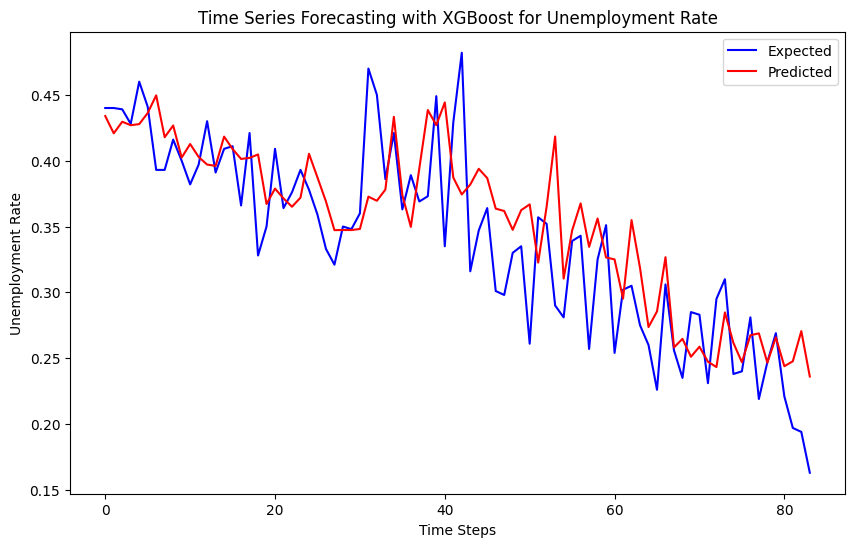

In [169]:
xgboostprediction(combined_df, country='Greece', age='15-24', sex='Total')

### 25+, Female

In [170]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Female')

In [171]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9852
Strong seasonality detected.


(0.9851782174746432, True)

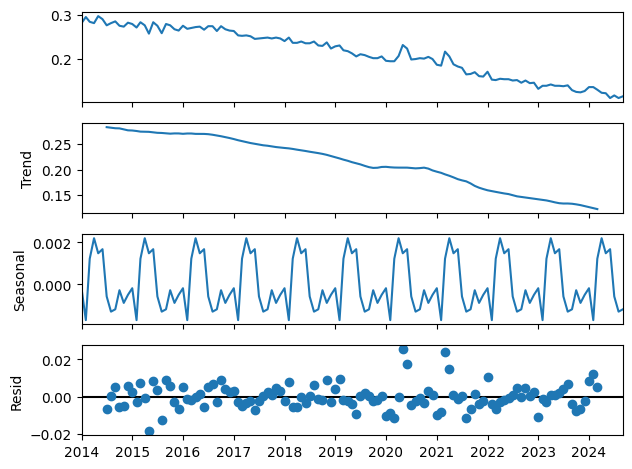

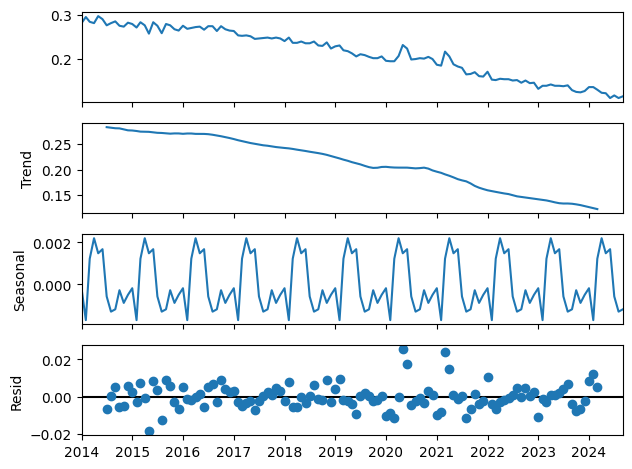

In [172]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-751.413, Time=1.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-661.162, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-708.555, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-685.172, Time=0.16 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-752.194, Time=0.70 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-727.928, Time=0.20 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-746.348, Time=1.08 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-734.986, Time=0.82 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-750.667, Time=0.67 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-734.202, Time=0.48 sec
 ARIMA(2,1,1)(1,1,1)[12]             : 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


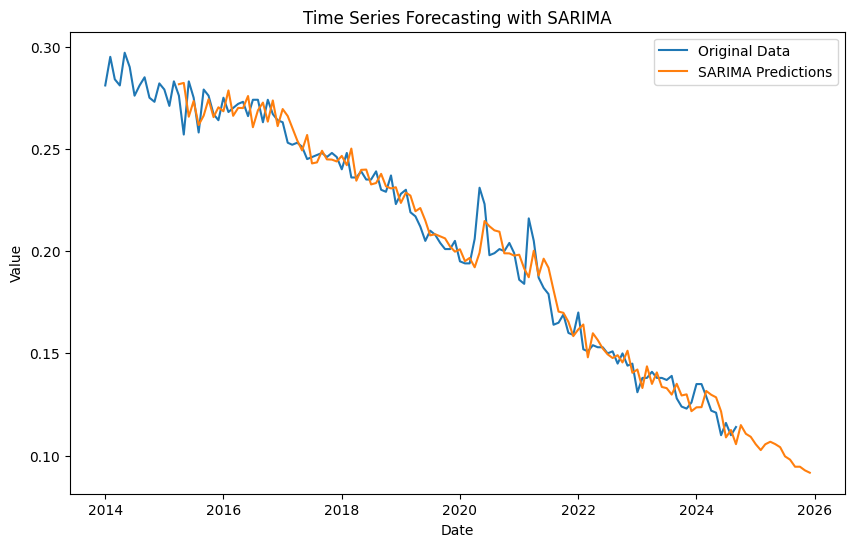

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 7.36958780799472e-05, RMSE: 0.008584630340320264, MAPE: 3.41%


In [173]:
model_sarima(data_filtered,'Greece', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-821.073, Time=0.86 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-725.455, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-750.584, Time=0.09 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-825.362, Time=0.31 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-727.451, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-827.330, Time=0.07 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-857.107, Time=0.18 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=inf, Time=0.63 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-856.040, Time=0.50 sec
 ARIMA(1,2,3)(0,0,0)[0]             : AIC=-862.691, Time=0.40 sec
 ARIMA(2,2,3)(0,0,0)[0]             : AIC=inf, Time=0.70 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=-864.166, Time=0.45 sec
 ARIMA(2,2,1)(0,0,0)[0]            

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


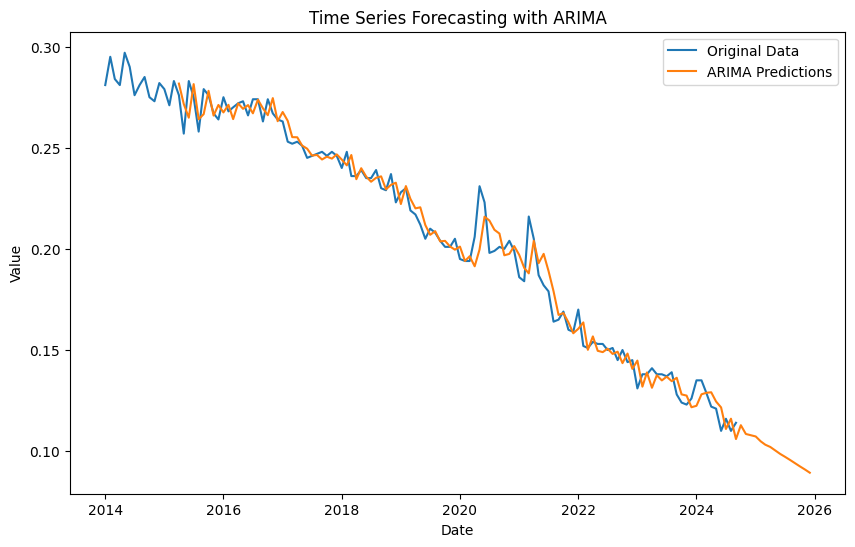

R^2 Score for ARIMA: 0.98
ARIMA - MSE: 5.930845805180651e-05, RMSE: 0.007701198481522633, MAPE: 2.92%


In [174]:
model_arima(data_filtered,'Greece', '25+', 'Female')

>expected=0.246, predicted=0.247
>expected=0.248, predicted=0.247
>expected=0.246, predicted=0.247
>expected=0.240, predicted=0.247
>expected=0.248, predicted=0.245
>expected=0.236, predicted=0.243
>expected=0.236, predicted=0.239
>expected=0.239, predicted=0.237
>expected=0.235, predicted=0.238
>expected=0.235, predicted=0.238
>expected=0.239, predicted=0.236
>expected=0.230, predicted=0.236
>expected=0.229, predicted=0.233
>expected=0.237, predicted=0.234
>expected=0.223, predicted=0.236
>expected=0.228, predicted=0.226
>expected=0.230, predicted=0.229
>expected=0.219, predicted=0.228
>expected=0.217, predicted=0.226
>expected=0.212, predicted=0.222
>expected=0.205, predicted=0.215
>expected=0.210, predicted=0.207
>expected=0.208, predicted=0.210
>expected=0.204, predicted=0.208
>expected=0.201, predicted=0.207
>expected=0.201, predicted=0.204
>expected=0.205, predicted=0.203
>expected=0.195, predicted=0.202
>expected=0.194, predicted=0.198
>expected=0.194, predicted=0.199
>expected=

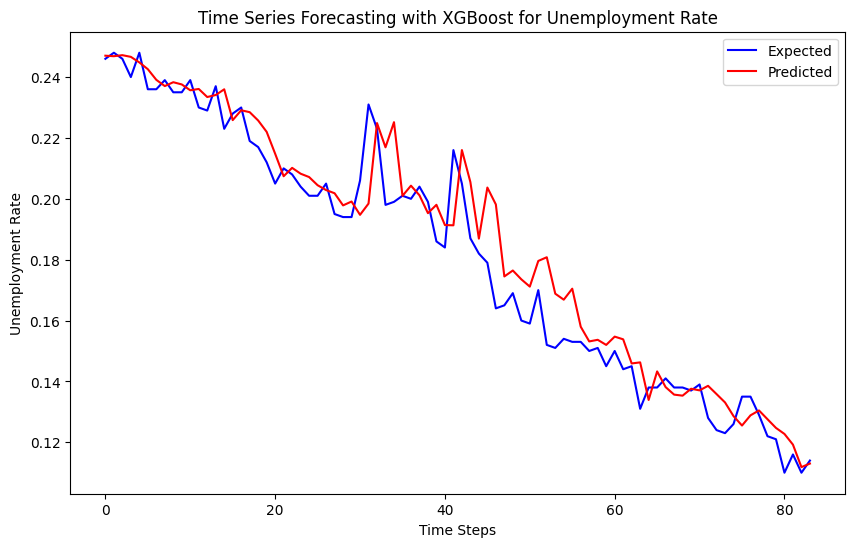

In [175]:
xgboostprediction(combined_df, country='Greece', age='25+', sex='Female')

### 25+, Male

In [176]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Male')

In [177]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9909
Strong seasonality detected.


(0.9908675588009553, True)

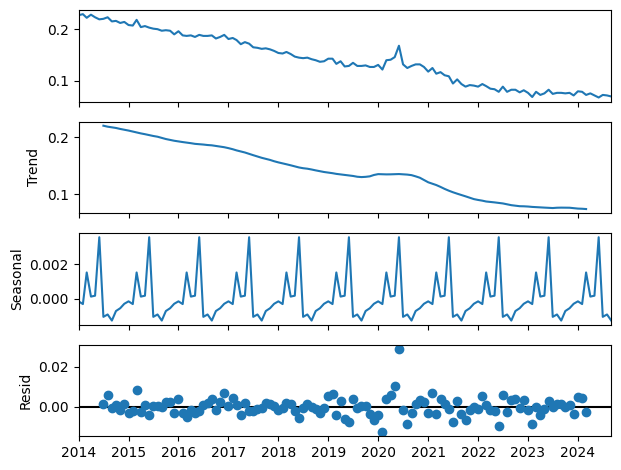

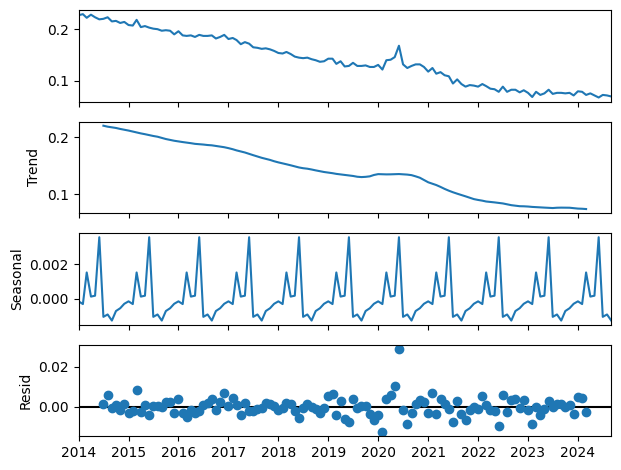

In [178]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-725.298, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-778.383, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-744.424, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-812.995, Time=0.55 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-814.970, Time=0.62 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-816.047, Time=0.26 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-830.134, Time=2.60 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.35 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=inf, Time=2.67 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-830.064, T

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


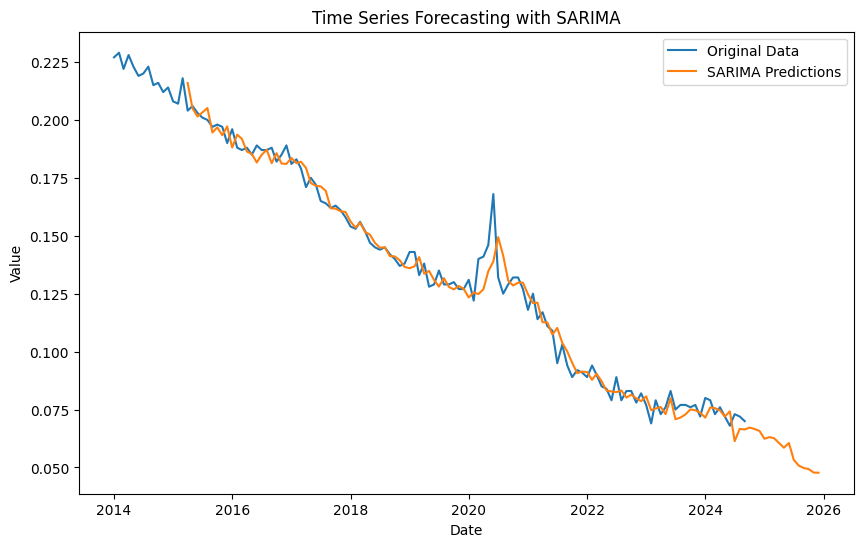

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 3.6082736591231224e-05, RMSE: 0.006006890759055905, MAPE: 3.43%


In [179]:
model_sarima(data_filtered,'Greece', '25+', 'Male')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-916.144, Time=0.73 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-786.852, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-848.507, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-788.851, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-906.735, Time=0.15 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-908.074, Time=0.72 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-919.782, Time=0.07 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-929.058, Time=0.09 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-925.774, Time=0.29 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-930.999, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-937.200, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=0.07 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-922.947, Time=0.29 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(1,2,3)(0,0,0)[0]  

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


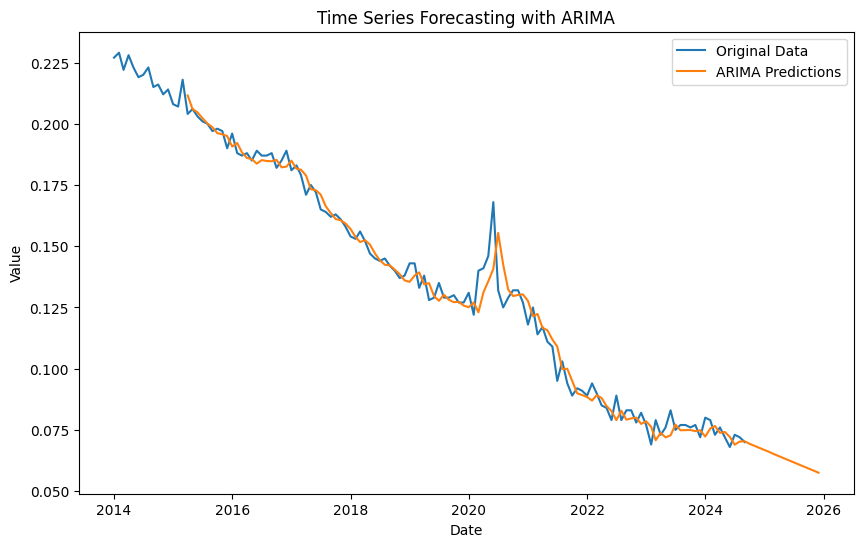

R^2 Score for ARIMA: 0.98
ARIMA - MSE: 3.5995559861588645e-05, RMSE: 0.005999629977055972, MAPE: 3.50%


In [180]:
model_arima(data_filtered,'Greece', '25+', 'Male')

>expected=0.163, predicted=0.165
>expected=0.161, predicted=0.163
>expected=0.158, predicted=0.162
>expected=0.154, predicted=0.159
>expected=0.153, predicted=0.156
>expected=0.156, predicted=0.153
>expected=0.152, predicted=0.154
>expected=0.147, predicted=0.154
>expected=0.145, predicted=0.152
>expected=0.144, predicted=0.149
>expected=0.145, predicted=0.145
>expected=0.142, predicted=0.145
>expected=0.140, predicted=0.143
>expected=0.137, predicted=0.142
>expected=0.138, predicted=0.140
>expected=0.143, predicted=0.138
>expected=0.143, predicted=0.138
>expected=0.133, predicted=0.142
>expected=0.138, predicted=0.137
>expected=0.128, predicted=0.136
>expected=0.129, predicted=0.129
>expected=0.135, predicted=0.130
>expected=0.129, predicted=0.134
>expected=0.129, predicted=0.133
>expected=0.130, predicted=0.129
>expected=0.127, predicted=0.130
>expected=0.127, predicted=0.128
>expected=0.131, predicted=0.128
>expected=0.122, predicted=0.131
>expected=0.140, predicted=0.129
>expected=

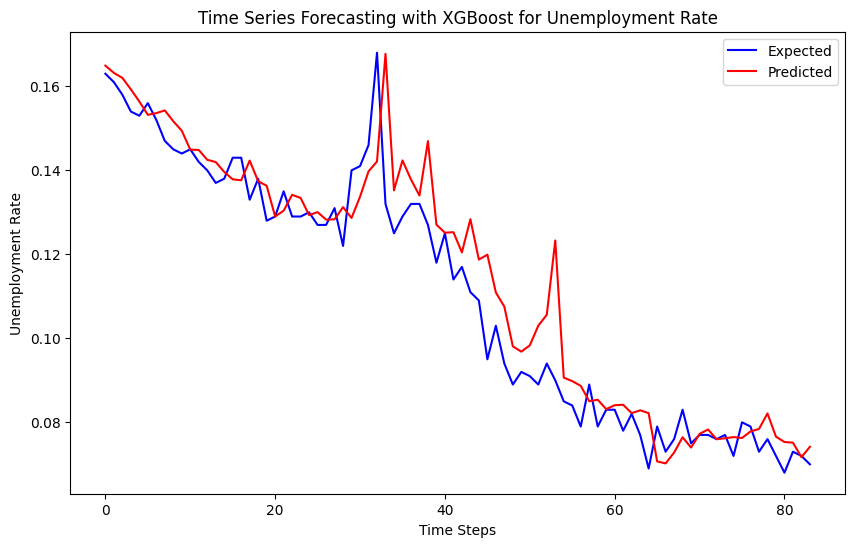

In [181]:
xgboostprediction(combined_df, country='Greece', age='25+', sex='Male')

### 25+, Total

In [182]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Total')

In [183]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9922
Strong seasonality detected.


(0.992198902478935, True)

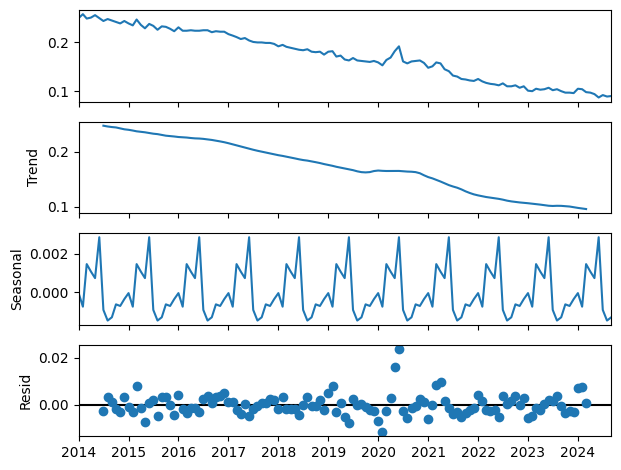

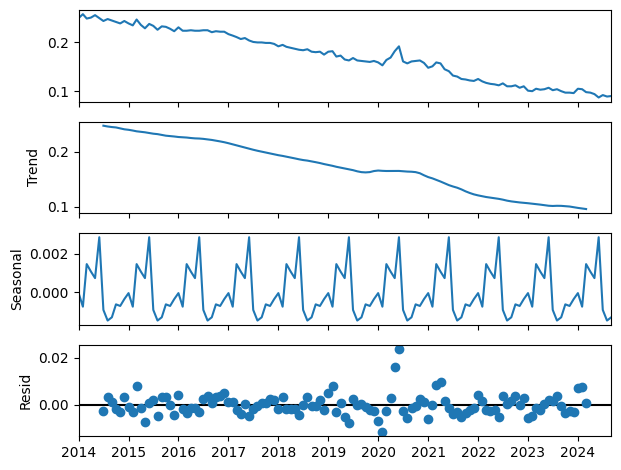

In [184]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=4.76 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-762.978, Time=0.15 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-803.113, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-841.705, Time=1.22 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-771.624, Time=0.44 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-841.378, Time=1.19 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=3.52 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-805.767, Time=1.34 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=4.70 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-836.111, Time=0.46 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-849.419, Time=0.46 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-779.599, Time=0.18 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


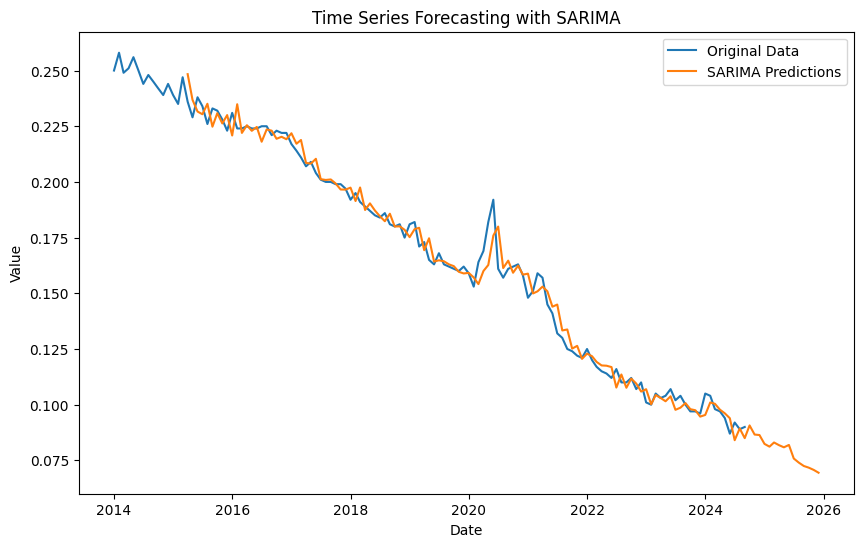

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 3.152398597848334e-05, RMSE: 0.005614622514335522, MAPE: 2.57%


In [185]:
model_sarima(data_filtered,'Greece', '25+', 'Total')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-937.223, Time=1.42 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-849.313, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-877.131, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-929.154, Time=0.12 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-851.307, Time=0.05 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-946.564, Time=3.21 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-918.929, Time=0.52 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-933.459, Time=3.26 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.10 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-947.932, Time=4.25 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-949.251, Time=3.46 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-952.301, Time=9.81 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-955.422, Time=6.03 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-956.367, Time=7.45 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-952.232, Time=6.96 sec
 ARIMA(3,2,2)(0

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


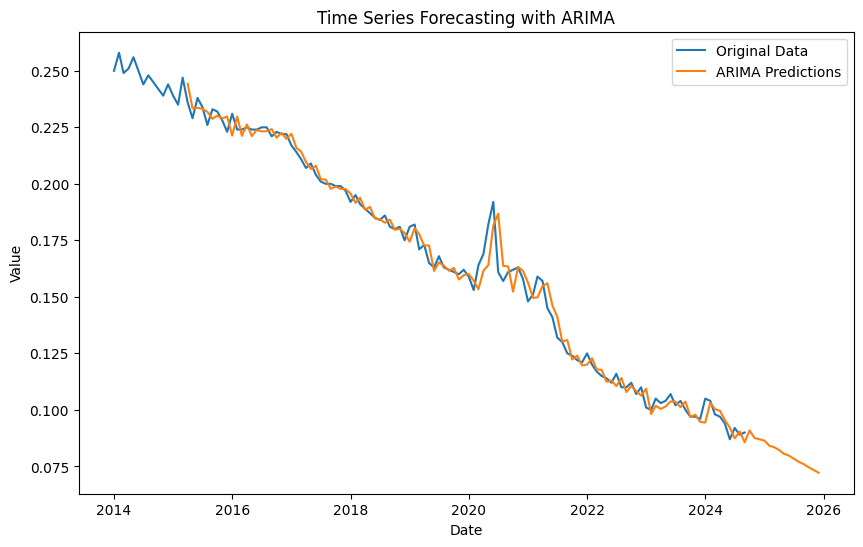

R^2 Score for ARIMA: 0.99
ARIMA - MSE: 2.6988692017246454e-05, RMSE: 0.005195064197605883, MAPE: 2.36%


In [186]:
model_arima(data_filtered,'Greece', '25+', 'Total')

>expected=0.199, predicted=0.201
>expected=0.199, predicted=0.200
>expected=0.197, predicted=0.199
>expected=0.192, predicted=0.199
>expected=0.195, predicted=0.196
>expected=0.191, predicted=0.194
>expected=0.189, predicted=0.192
>expected=0.187, predicted=0.190
>expected=0.185, predicted=0.188
>expected=0.184, predicted=0.187
>expected=0.186, predicted=0.185
>expected=0.181, predicted=0.185
>expected=0.180, predicted=0.183
>expected=0.181, predicted=0.181
>expected=0.175, predicted=0.182
>expected=0.181, predicted=0.176
>expected=0.182, predicted=0.177
>expected=0.171, predicted=0.180
>expected=0.173, predicted=0.174
>expected=0.165, predicted=0.172
>expected=0.163, predicted=0.168
>expected=0.168, predicted=0.165
>expected=0.163, predicted=0.165
>expected=0.162, predicted=0.164
>expected=0.161, predicted=0.163
>expected=0.160, predicted=0.162
>expected=0.162, predicted=0.161
>expected=0.159, predicted=0.161
>expected=0.153, predicted=0.160
>expected=0.164, predicted=0.154
>expected=

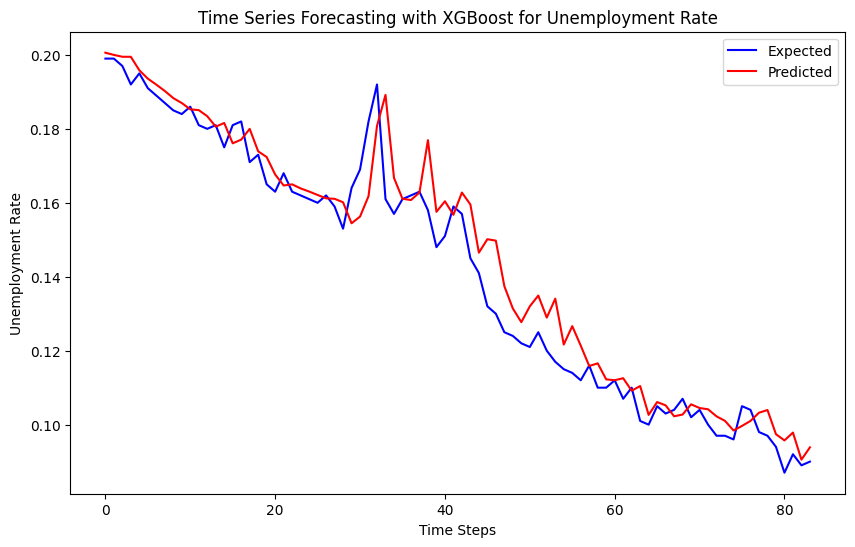

In [187]:
xgboostprediction(combined_df, country='Greece', age='25+', sex='Total')

# Spain

### 15-24, Female

In [188]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Female')

In [189]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9709
Strong seasonality detected.


(0.9708672509726848, True)

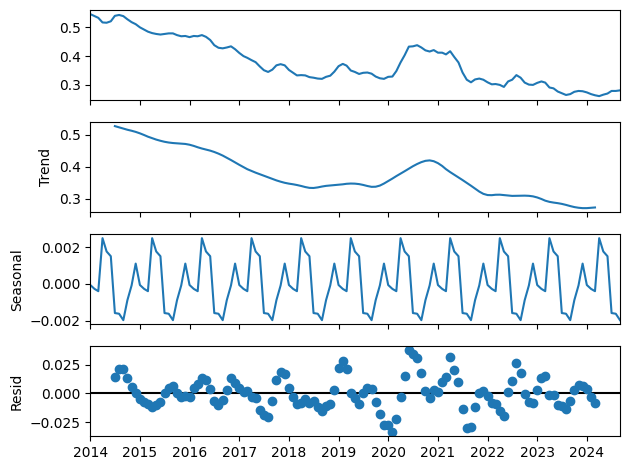

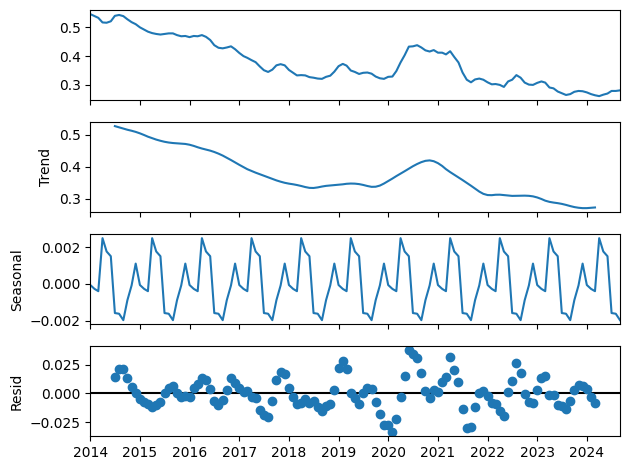

In [190]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=3.94 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-627.468, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-709.661, Time=0.45 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.33 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-682.491, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-715.254, Time=0.95 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-711.131, Time=0.65 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-671.571, Time=0.25 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-714.386, Time=0.79 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-713.942, Time=0.81 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-701.155, Time=0.49 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-711.125, Time=0.92 sec
 ARIMA(1,1,0)(2,1,0)[12] intercept   : AIC=-713.325, Time=0.57 sec

Best model:  ARIMA(1,1,0)(2,1,0)[

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


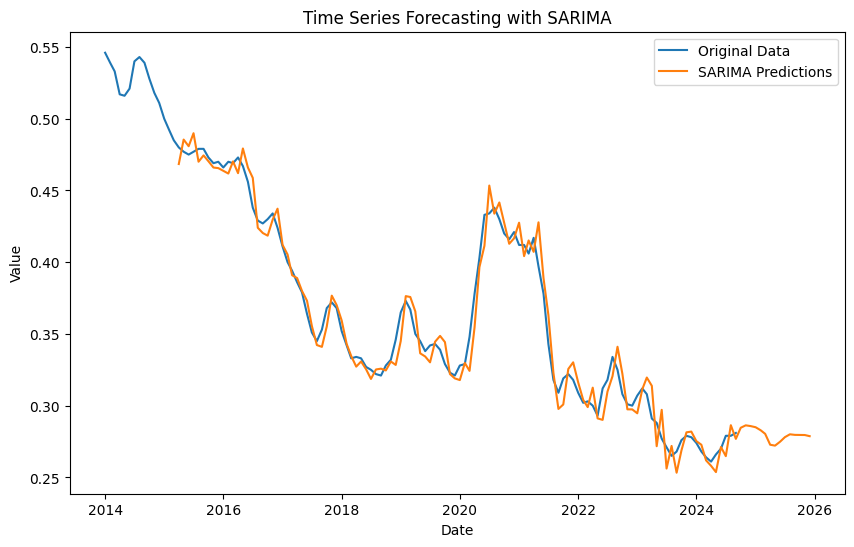

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 0.00011448704236303957, RMSE: 0.010699861791772807, MAPE: 2.41%


In [191]:
model_sarima(data_filtered,'Spain', '15-24', 'Female')

>expected=0.368, predicted=0.351
>expected=0.372, predicted=0.354
>expected=0.368, predicted=0.358
>expected=0.352, predicted=0.365
>expected=0.342, predicted=0.359
>expected=0.333, predicted=0.351
>expected=0.334, predicted=0.340
>expected=0.333, predicted=0.341
>expected=0.327, predicted=0.339
>expected=0.325, predicted=0.333
>expected=0.322, predicted=0.327
>expected=0.321, predicted=0.325
>expected=0.328, predicted=0.322
>expected=0.332, predicted=0.326
>expected=0.346, predicted=0.324
>expected=0.365, predicted=0.339
>expected=0.373, predicted=0.367
>expected=0.367, predicted=0.374
>expected=0.350, predicted=0.366
>expected=0.345, predicted=0.342
>expected=0.338, predicted=0.347
>expected=0.342, predicted=0.353
>expected=0.343, predicted=0.347
>expected=0.339, predicted=0.343
>expected=0.329, predicted=0.338
>expected=0.323, predicted=0.330
>expected=0.321, predicted=0.323
>expected=0.328, predicted=0.326
>expected=0.329, predicted=0.331
>expected=0.348, predicted=0.332
>expected=

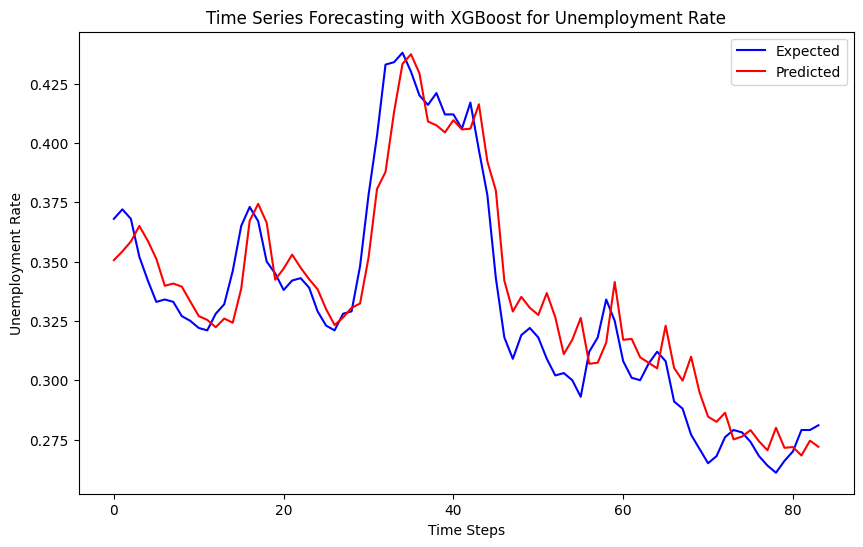

In [192]:
xgboostprediction(combined_df, country='Spain', age='15-24', sex='Female')

### 15-24, Male

In [193]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Male')

In [194]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9881
Strong seasonality detected.


(0.9881290159075603, True)

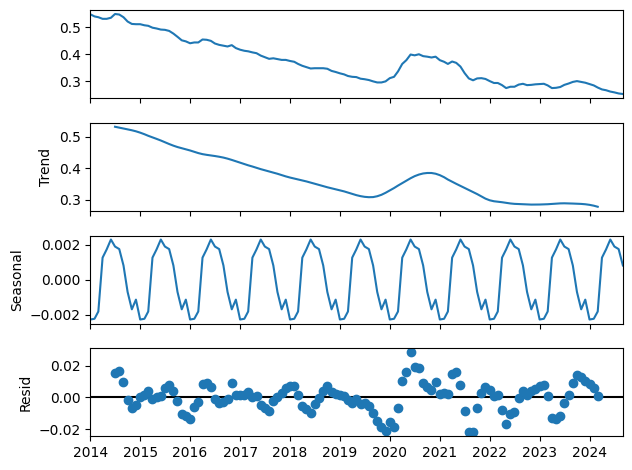

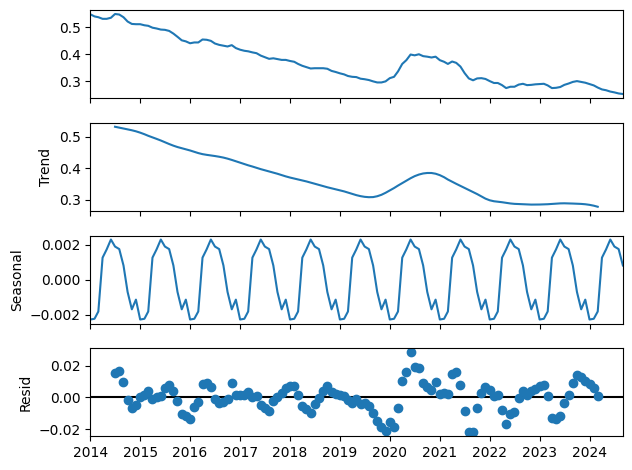

In [195]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-721.011, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-786.476, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.68 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-763.124, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-794.333, Time=0.28 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-791.479, Time=0.57 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-791.480, Time=0.07 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-755.933, Time=0.25 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-793.455, Time=0.99 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-792.755, Time=0.94 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-780.556, Time=0.56 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-793.138, Time=0.99 sec
 ARIMA(1,1,0)(2,1,0)[12] intercept   : AIC=-793.056, Time=0.90 sec

Best model:  ARIMA(1,1,0)(2,

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


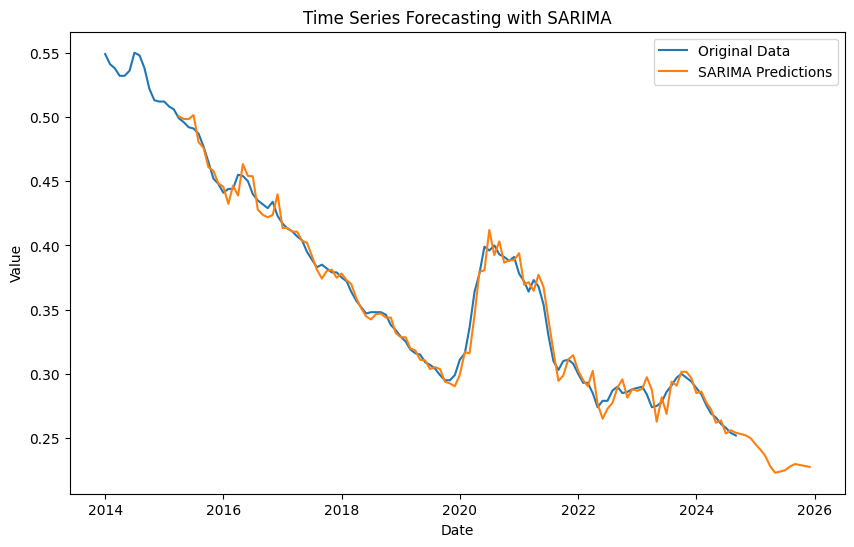

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 5.924328977745185e-05, RMSE: 0.007696966271035092, MAPE: 1.68%


In [196]:
model_sarima(data_filtered,'Spain', '15-24', 'Male')

>expected=0.382, predicted=0.384
>expected=0.379, predicted=0.383
>expected=0.379, predicted=0.380
>expected=0.375, predicted=0.380
>expected=0.372, predicted=0.376
>expected=0.364, predicted=0.374
>expected=0.357, predicted=0.370
>expected=0.352, predicted=0.359
>expected=0.347, predicted=0.354
>expected=0.348, predicted=0.348
>expected=0.348, predicted=0.348
>expected=0.348, predicted=0.348
>expected=0.346, predicted=0.348
>expected=0.338, predicted=0.347
>expected=0.334, predicted=0.339
>expected=0.329, predicted=0.335
>expected=0.325, predicted=0.330
>expected=0.319, predicted=0.326
>expected=0.316, predicted=0.320
>expected=0.315, predicted=0.317
>expected=0.309, predicted=0.316
>expected=0.307, predicted=0.310
>expected=0.304, predicted=0.308
>expected=0.299, predicted=0.305
>expected=0.295, predicted=0.300
>expected=0.295, predicted=0.296
>expected=0.299, predicted=0.296
>expected=0.311, predicted=0.299
>expected=0.316, predicted=0.310
>expected=0.336, predicted=0.315
>expected=

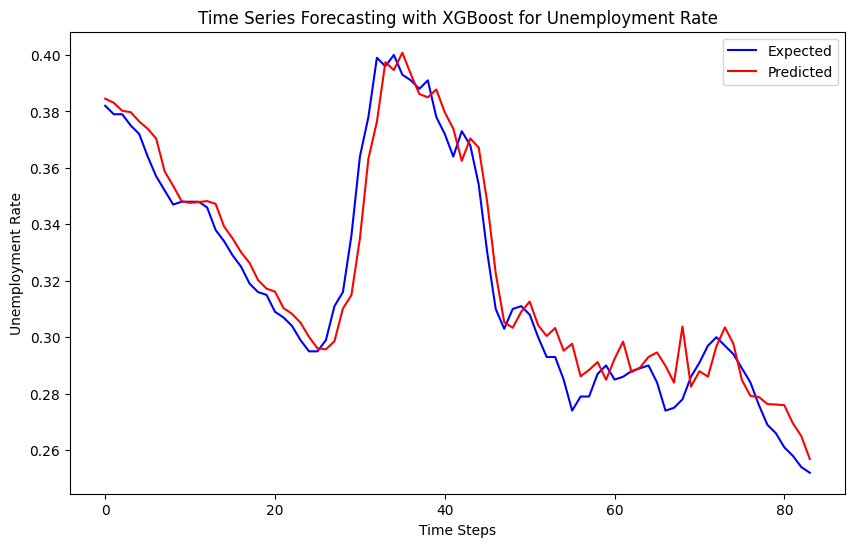

In [197]:
xgboostprediction(combined_df, country='Spain', age='15-24', sex='Male')

### 15-24, Total

In [198]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Total')

In [199]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9841
Strong seasonality detected.


(0.9841243763892986, True)

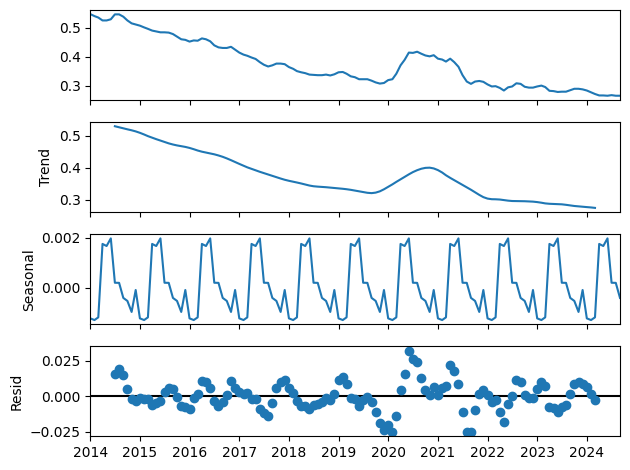

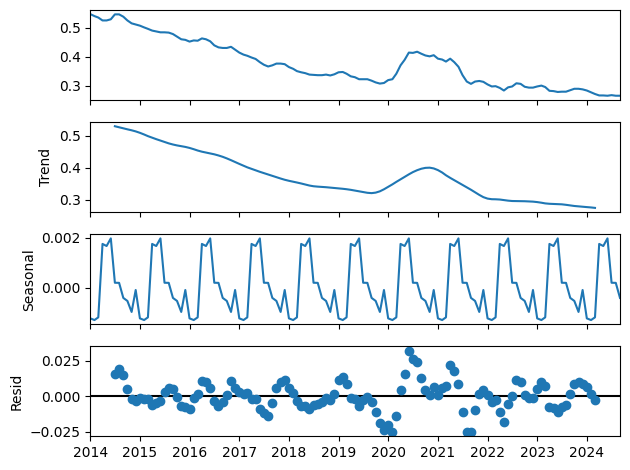

In [200]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-790.597, Time=7.70 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-693.396, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-763.057, Time=4.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-775.151, Time=5.67 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-739.582, Time=1.00 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=11.01 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=9.04 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-761.241, Time=10.65 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-785.818, Time=6.07 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=16.37 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=inf, Time=9.55 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-804.020, Time=14.12 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-753.691, Time=1.55 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-804.290, Time=9.86 sec
 ARIMA(1,1,2)(1,1,0)[12]           

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


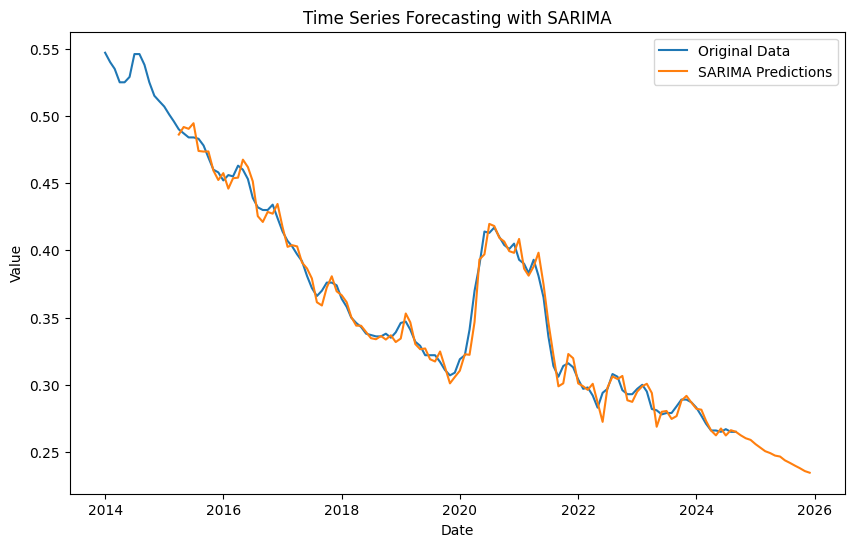

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 5.1288253871477505e-05, RMSE: 0.007161581799538249, MAPE: 1.55%


In [201]:
model_sarima(data_filtered,'Spain', '15-24', 'Total')

>expected=0.376, predicted=0.367
>expected=0.376, predicted=0.373
>expected=0.374, predicted=0.372
>expected=0.364, predicted=0.370
>expected=0.358, predicted=0.365
>expected=0.350, predicted=0.360
>expected=0.346, predicted=0.355
>expected=0.343, predicted=0.348
>expected=0.338, predicted=0.344
>expected=0.337, predicted=0.339
>expected=0.336, predicted=0.338
>expected=0.336, predicted=0.337
>expected=0.338, predicted=0.337
>expected=0.335, predicted=0.337
>expected=0.339, predicted=0.336
>expected=0.346, predicted=0.337
>expected=0.347, predicted=0.346
>expected=0.341, predicted=0.347
>expected=0.332, predicted=0.341
>expected=0.329, predicted=0.335
>expected=0.322, predicted=0.337
>expected=0.322, predicted=0.329
>expected=0.322, predicted=0.327
>expected=0.317, predicted=0.323
>expected=0.311, predicted=0.321
>expected=0.307, predicted=0.314
>expected=0.309, predicted=0.309
>expected=0.319, predicted=0.309
>expected=0.322, predicted=0.310
>expected=0.341, predicted=0.322
>expected=

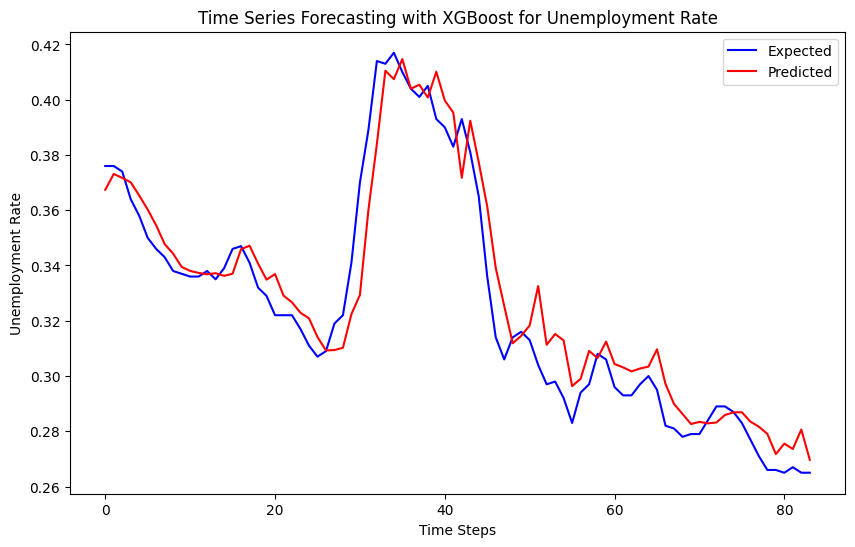

In [202]:
xgboostprediction(combined_df, country='Spain', age='15-24', sex='Total')

### 25+, Male

In [203]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Male')

In [204]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9942
Strong seasonality detected.


(0.9941591319475841, True)

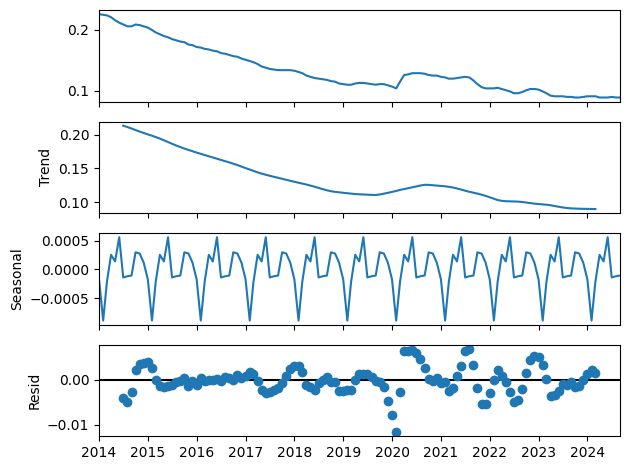

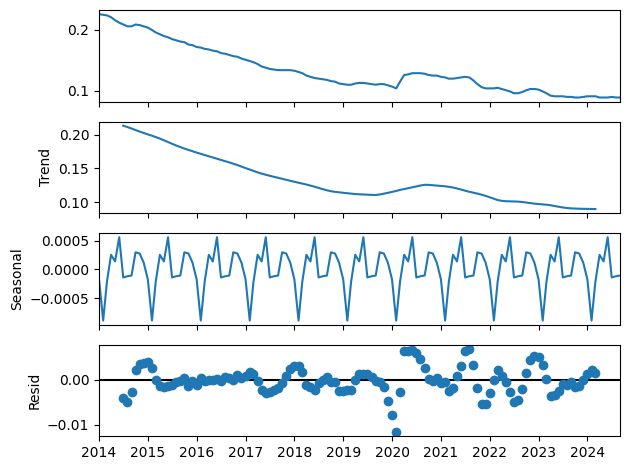

In [205]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1083.325, Time=0.74 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1008.896, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1065.771, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1080.418, Time=0.66 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1041.541, Time=0.44 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1073.917, Time=0.54 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1037.541, Time=1.47 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1067.471, Time=0.15 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.99 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1082.211, Time=0.39 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1081.725, Time=0.96 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1081.663, Time=0.94 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1043.474, Time=0.15 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1083.141, Time=0.74 sec
 ARIMA(2,1,

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


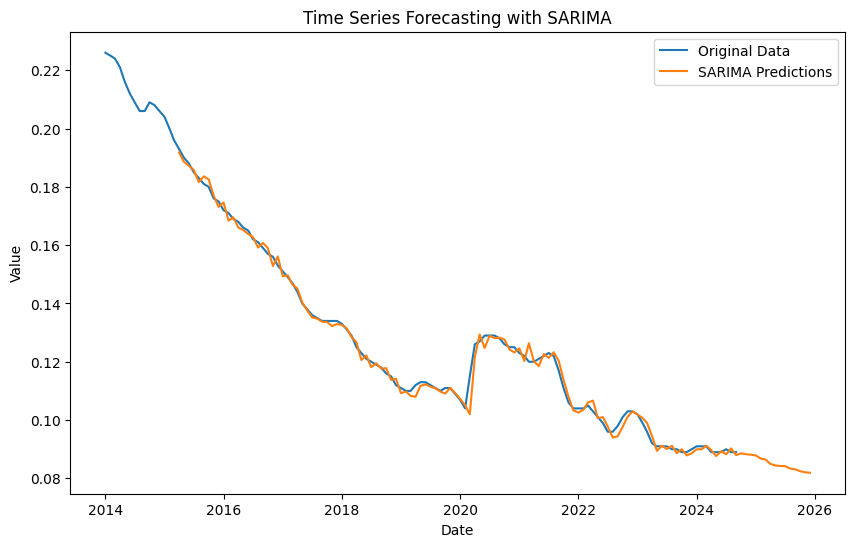

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 4.755028583267448e-06, RMSE: 0.0021806028027285137, MAPE: 1.28%


In [206]:
model_sarima(data_filtered,'Spain', '25+', 'Male')

>expected=0.134, predicted=0.135
>expected=0.134, predicted=0.135
>expected=0.134, predicted=0.134
>expected=0.133, predicted=0.134
>expected=0.131, predicted=0.134
>expected=0.129, predicted=0.132
>expected=0.125, predicted=0.130
>expected=0.123, predicted=0.126
>expected=0.121, predicted=0.124
>expected=0.120, predicted=0.122
>expected=0.119, predicted=0.121
>expected=0.118, predicted=0.120
>expected=0.116, predicted=0.119
>expected=0.115, predicted=0.117
>expected=0.112, predicted=0.116
>expected=0.111, predicted=0.113
>expected=0.110, predicted=0.112
>expected=0.110, predicted=0.111
>expected=0.112, predicted=0.111
>expected=0.113, predicted=0.111
>expected=0.113, predicted=0.113
>expected=0.112, predicted=0.113
>expected=0.111, predicted=0.112
>expected=0.110, predicted=0.111
>expected=0.111, predicted=0.111
>expected=0.111, predicted=0.111
>expected=0.109, predicted=0.111
>expected=0.107, predicted=0.110
>expected=0.104, predicted=0.109
>expected=0.115, predicted=0.106
>expected=

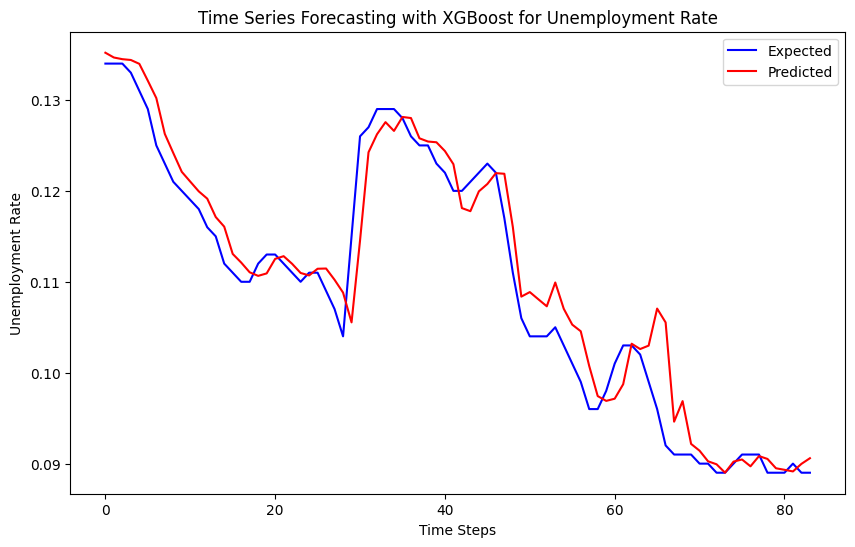

In [207]:
xgboostprediction(combined_df, country='Spain', age='25+', sex='Male')

### 25+, Female

In [208]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Female')

In [209]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9953
Strong seasonality detected.


(0.9952539764495535, True)

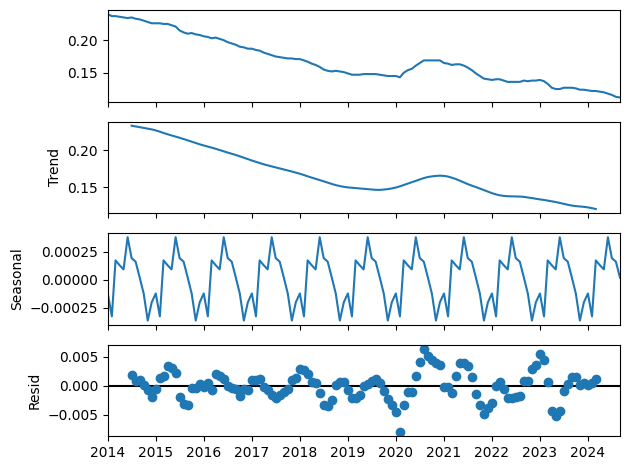

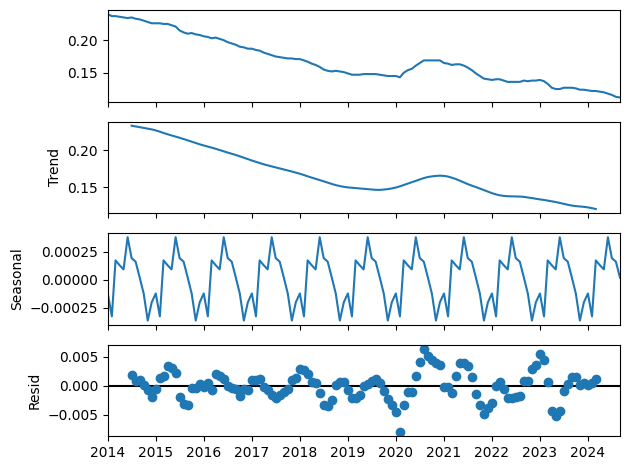

In [210]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1112.186, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1026.865, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1090.382, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1090.471, Time=0.96 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1065.494, Time=0.20 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1096.356, Time=1.05 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1061.494, Time=1.56 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1090.759, Time=0.39 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.29 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1111.877, Time=0.22 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1105.727, Time=1.38 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1114.051, Time=0.19 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1069.430, Time=0.35 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1097.668, Time=0.93 sec
 ARIMA(1,1,

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


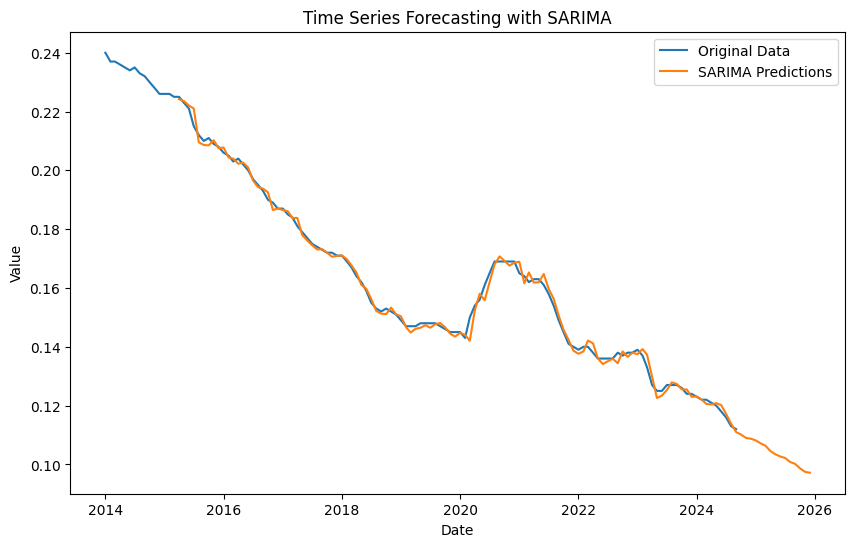

R^2 Score for SARIMA: 1.00
SARIMA - MSE: 3.568591067104246e-06, RMSE: 0.0018890714827936622, MAPE: 0.91%


In [211]:
model_sarima(data_filtered,'Spain', '25+', 'Female')

>expected=0.172, predicted=0.174
>expected=0.172, predicted=0.173
>expected=0.171, predicted=0.173
>expected=0.171, predicted=0.172
>expected=0.169, predicted=0.172
>expected=0.167, predicted=0.170
>expected=0.164, predicted=0.168
>expected=0.162, predicted=0.165
>expected=0.159, predicted=0.163
>expected=0.155, predicted=0.160
>expected=0.153, predicted=0.156
>expected=0.152, predicted=0.154
>expected=0.153, predicted=0.153
>expected=0.152, predicted=0.153
>expected=0.151, predicted=0.153
>expected=0.149, predicted=0.152
>expected=0.147, predicted=0.150
>expected=0.147, predicted=0.148
>expected=0.147, predicted=0.147
>expected=0.148, predicted=0.147
>expected=0.148, predicted=0.147
>expected=0.148, predicted=0.148
>expected=0.148, predicted=0.148
>expected=0.147, predicted=0.148
>expected=0.146, predicted=0.148
>expected=0.145, predicted=0.147
>expected=0.145, predicted=0.146
>expected=0.145, predicted=0.146
>expected=0.143, predicted=0.146
>expected=0.150, predicted=0.144
>expected=

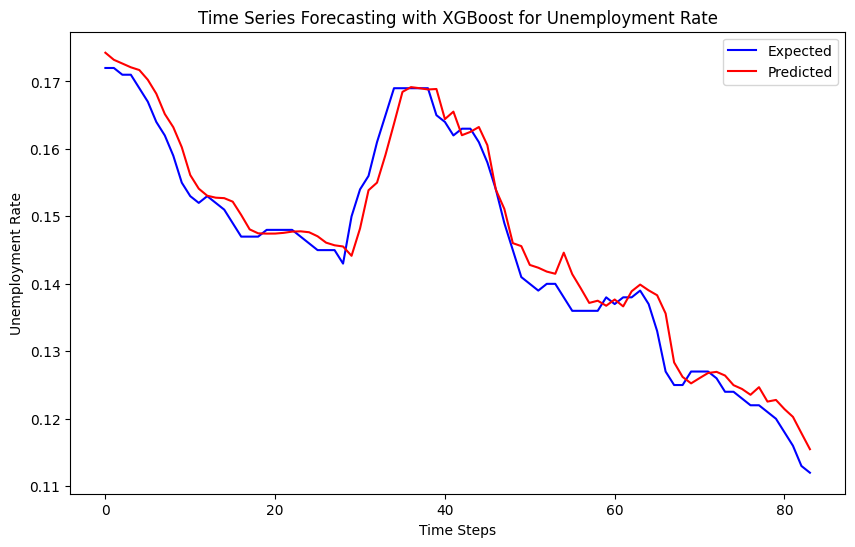

In [212]:
xgboostprediction(combined_df, country='Spain', age='25+', sex='Female')

 ### 25+, Total

In [213]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Total')

In [214]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9956
Strong seasonality detected.


(0.995639970623257, True)

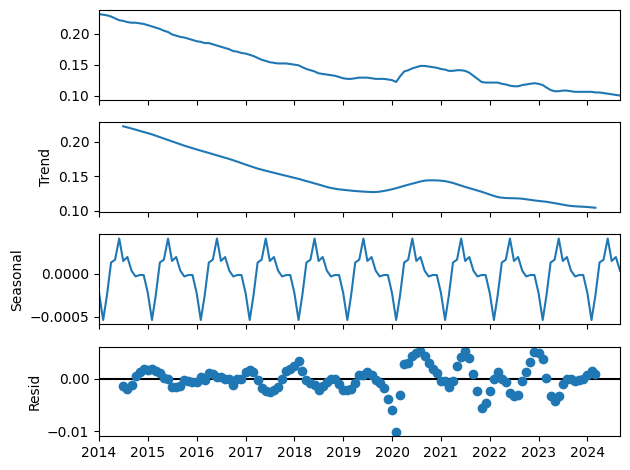

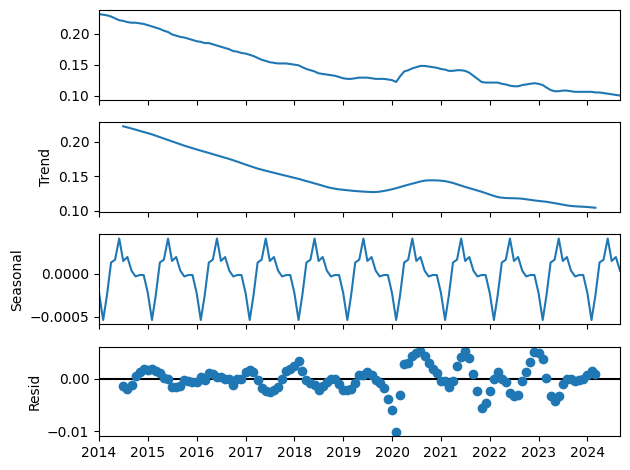

In [215]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1132.727, Time=1.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1046.399, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1113.441, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1123.950, Time=0.84 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1086.284, Time=0.11 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1122.102, Time=0.26 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1082.284, Time=0.78 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1111.692, Time=0.24 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1106.811, Time=0.97 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1134.498, Time=0.88 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1088.223, Time=0.07 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1123.779, Time=0.22 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1084.223, Time=0.69 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1108.523, Time=0.63 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


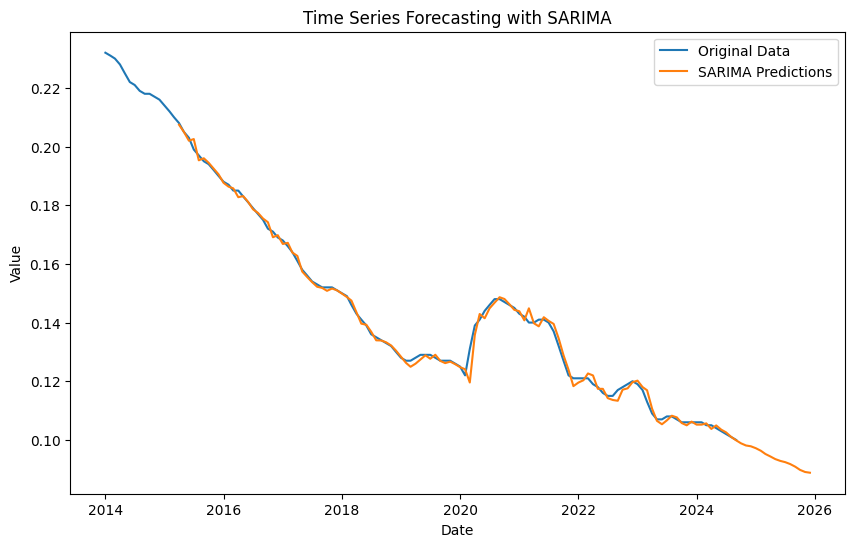

R^2 Score for SARIMA: 1.00
SARIMA - MSE: 3.1697019696116524e-06, RMSE: 0.0017803656842378345, MAPE: 0.87%


In [216]:
model_sarima(data_filtered,'Spain', '25+', 'Total')

>expected=0.152, predicted=0.153
>expected=0.152, predicted=0.153
>expected=0.151, predicted=0.153
>expected=0.150, predicted=0.152
>expected=0.149, predicted=0.151
>expected=0.146, predicted=0.150
>expected=0.143, predicted=0.147
>expected=0.141, predicted=0.144
>expected=0.139, predicted=0.142
>expected=0.136, predicted=0.140
>expected=0.135, predicted=0.137
>expected=0.134, predicted=0.136
>expected=0.133, predicted=0.135
>expected=0.132, predicted=0.134
>expected=0.130, predicted=0.133
>expected=0.128, predicted=0.131
>expected=0.127, predicted=0.129
>expected=0.127, predicted=0.128
>expected=0.128, predicted=0.128
>expected=0.129, predicted=0.128
>expected=0.129, predicted=0.128
>expected=0.129, predicted=0.129
>expected=0.128, predicted=0.129
>expected=0.127, predicted=0.128
>expected=0.127, predicted=0.128
>expected=0.127, predicted=0.128
>expected=0.126, predicted=0.128
>expected=0.125, predicted=0.127
>expected=0.122, predicted=0.126
>expected=0.131, predicted=0.123
>expected=

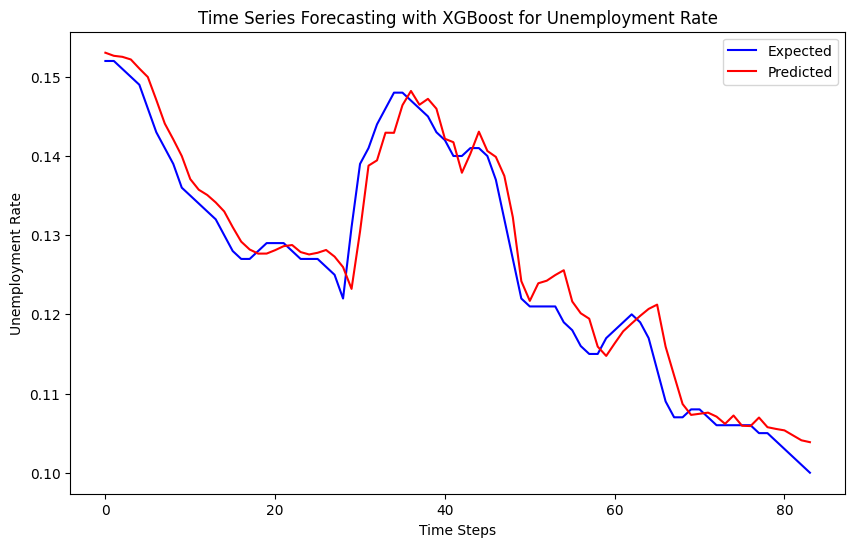

In [217]:
xgboostprediction(combined_df, country='Spain', age='25+', sex='Total')

# Slovenia

### 15-24, Male

In [218]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Male')

In [219]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9005
Strong seasonality detected.


(0.9004514690253576, True)

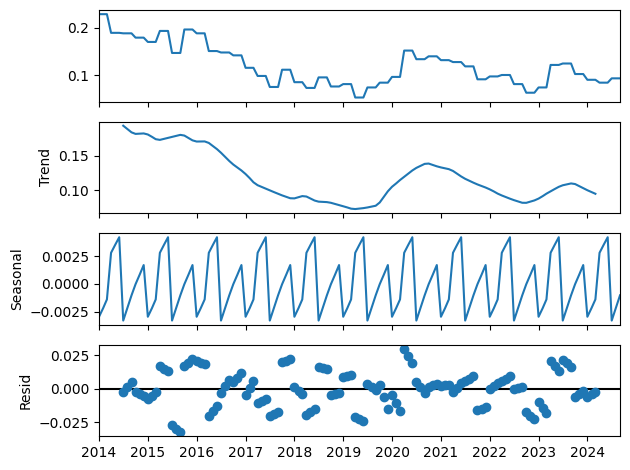

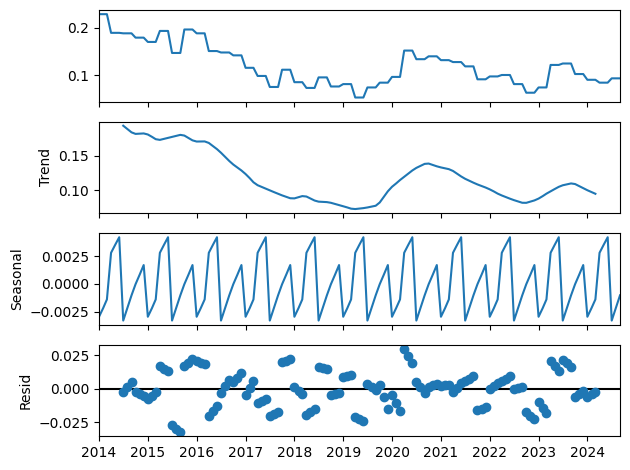

In [220]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-633.442, Time=1.58 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-573.636, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-632.756, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-635.442, Time=0.95 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-571.636, Time=0.05 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-644.075, Time=1.06 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-632.755, Time=0.19 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-648.565, Time=0.75 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-645.518, Time=0.76 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=inf, Time=2.19 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-642.166, Time=3.40 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-650.574, Time=1.03 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-646.063, Time=0.41 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-647.519, Time=0.86 sec
 ARIMA(0,1,0)(2,1,2)[12]

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


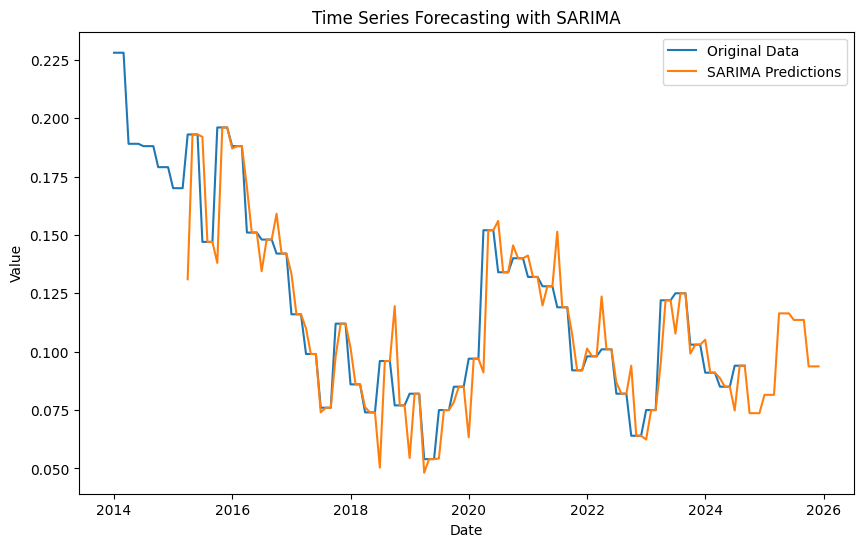

R^2 Score for SARIMA: 0.81
SARIMA - MSE: 0.0002320551241727326, RMSE: 0.015233355643873498, MAPE: 6.12%


In [221]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Male')

>expected=0.112, predicted=0.112
>expected=0.112, predicted=0.112
>expected=0.112, predicted=0.112
>expected=0.086, predicted=0.110
>expected=0.086, predicted=0.087
>expected=0.086, predicted=0.086
>expected=0.074, predicted=0.082
>expected=0.074, predicted=0.074
>expected=0.074, predicted=0.074
>expected=0.096, predicted=0.073
>expected=0.096, predicted=0.094
>expected=0.096, predicted=0.096
>expected=0.077, predicted=0.089
>expected=0.077, predicted=0.077
>expected=0.077, predicted=0.076
>expected=0.082, predicted=0.095
>expected=0.082, predicted=0.081
>expected=0.082, predicted=0.082
>expected=0.054, predicted=0.082
>expected=0.054, predicted=0.055
>expected=0.054, predicted=0.055
>expected=0.075, predicted=0.071
>expected=0.075, predicted=0.076
>expected=0.075, predicted=0.075
>expected=0.085, predicted=0.066
>expected=0.085, predicted=0.083
>expected=0.085, predicted=0.084
>expected=0.097, predicted=0.060
>expected=0.097, predicted=0.089
>expected=0.097, predicted=0.097
>expected=

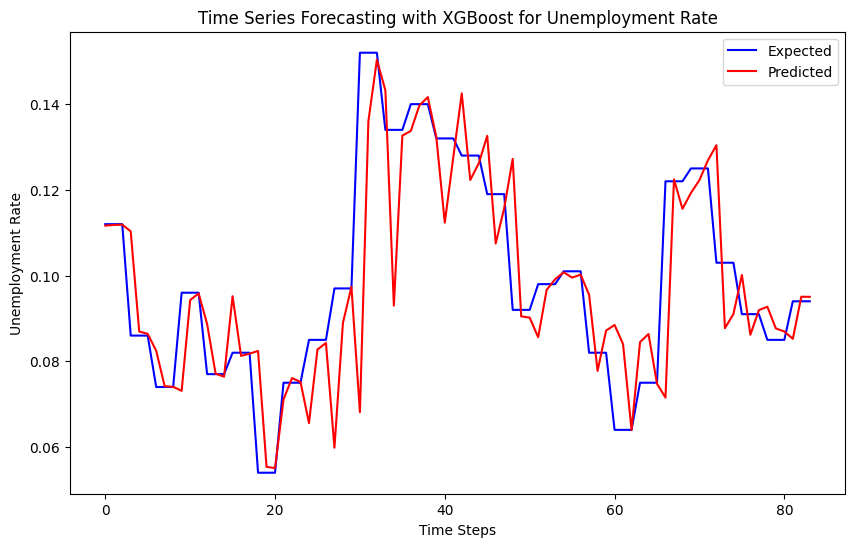

In [222]:
xgboostprediction(combined_df, country='Slovenia', age='15-24', sex='Male')

### 15-24, Female

In [223]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Female')

In [224]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8323
Strong seasonality detected.


(0.8322960275578615, True)

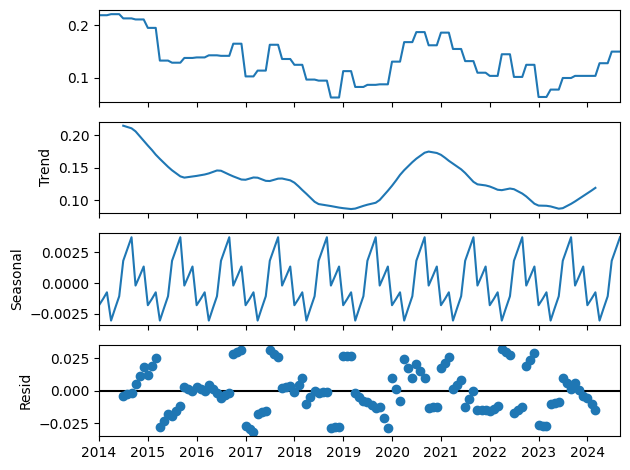

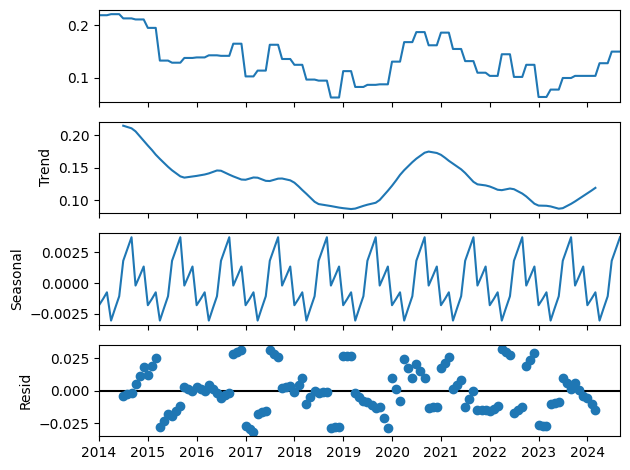

In [225]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-541.721, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-555.276, Time=0.13 sec


C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1901: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_auto_solvers.py:38: RuntimeWarning: invalid value encountered in divide
  max_invroot = max(0, *np.abs(1 / model.arroots()))


 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-539.721, Time=0.09 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-572.055, Time=0.61 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.72 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-574.055, Time=0.83 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-559.426, Time=0.53 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-572.055, Time=1.01 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-570.055, Time=1.02 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=-572.351, Time=0.88 sec

Best model:  ARIMA(0,1,0)(2,1,0)[12]          
Total fit time: 13.491 seconds
                                     SARIMAX Results                                      
Dep. Variable:                                  y  

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


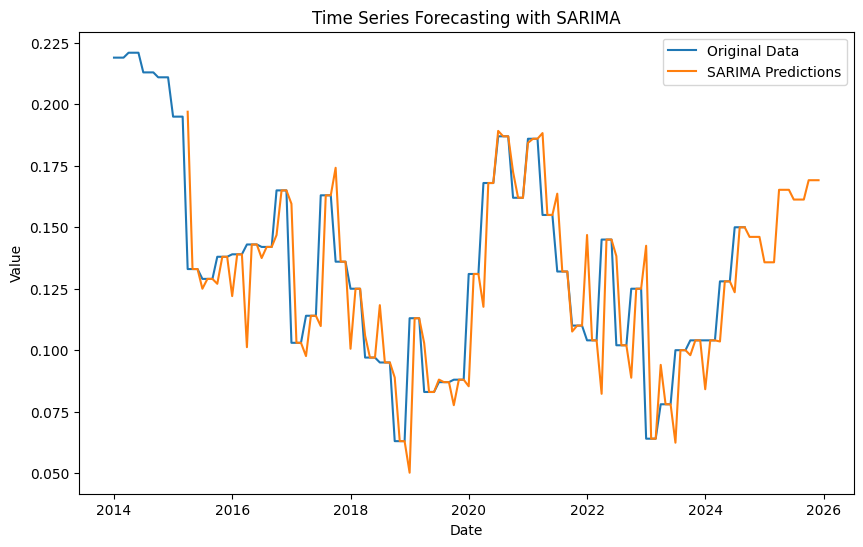

R^2 Score for SARIMA: 0.58
SARIMA - MSE: 0.00040393560937603077, RMSE: 0.020098149401774054, MAPE: 8.35%


In [226]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Female')

>expected=0.136, predicted=0.147
>expected=0.136, predicted=0.137
>expected=0.136, predicted=0.139
>expected=0.125, predicted=0.145
>expected=0.125, predicted=0.138
>expected=0.125, predicted=0.136
>expected=0.097, predicted=0.137
>expected=0.097, predicted=0.131
>expected=0.097, predicted=0.123
>expected=0.095, predicted=0.131
>expected=0.095, predicted=0.122
>expected=0.095, predicted=0.120
>expected=0.063, predicted=0.106
>expected=0.063, predicted=0.117
>expected=0.063, predicted=0.109
>expected=0.113, predicted=0.105
>expected=0.113, predicted=0.113
>expected=0.113, predicted=0.118
>expected=0.083, predicted=0.119
>expected=0.083, predicted=0.112
>expected=0.083, predicted=0.108
>expected=0.087, predicted=0.102
>expected=0.087, predicted=0.105
>expected=0.087, predicted=0.087
>expected=0.088, predicted=0.106
>expected=0.088, predicted=0.104
>expected=0.088, predicted=0.098
>expected=0.131, predicted=0.087
>expected=0.131, predicted=0.117
>expected=0.131, predicted=0.119
>expected=

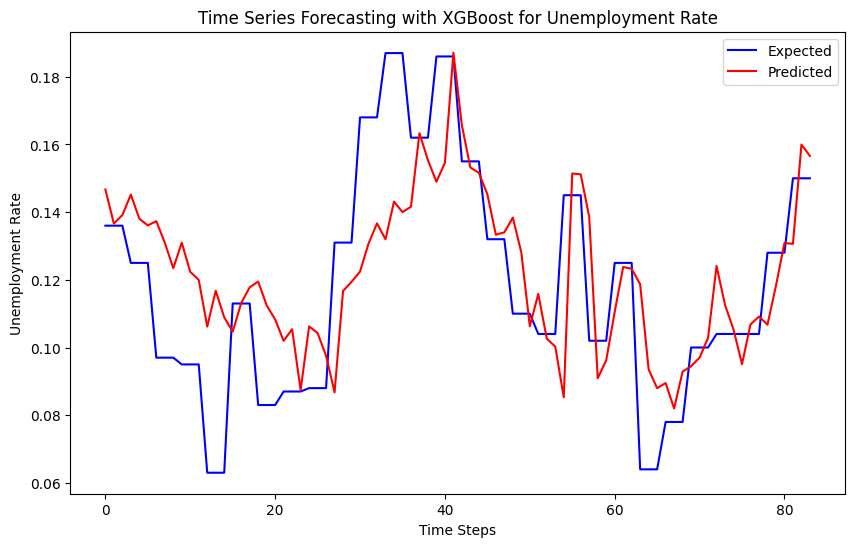

In [227]:
xgboostprediction(combined_df, country='Slovenia', age='15-24', sex='Female')

### 15-24, Total

In [228]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Total')

In [229]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9136
Strong seasonality detected.


(0.9136172349650212, True)

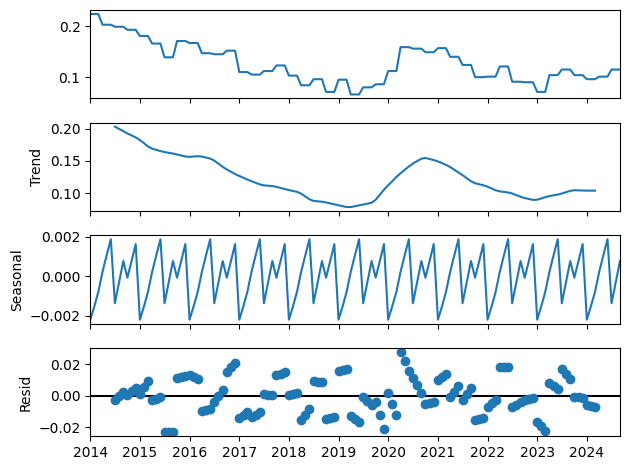

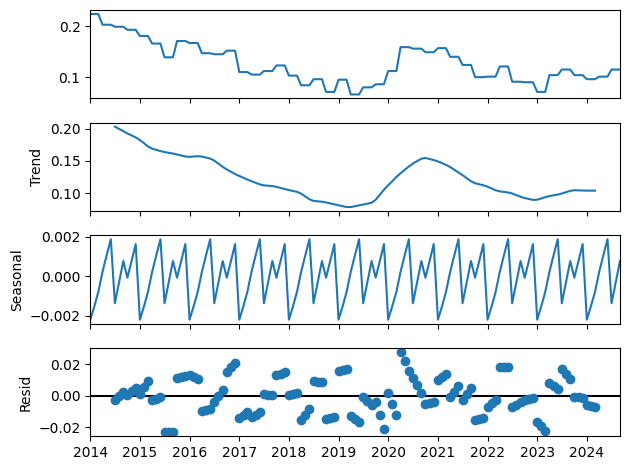

In [230]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-675.084, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-640.767, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-661.878, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-677.170, Time=0.44 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-638.767, Time=0.19 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-675.886, Time=0.92 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.19 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-661.879, Time=0.52 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-679.137, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-677.887, Time=1.08 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-663.879, Time=0.18 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-675.879, Time=1.58 sec
 ARIMA(1,1,0)(0,1,1)[12]          

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


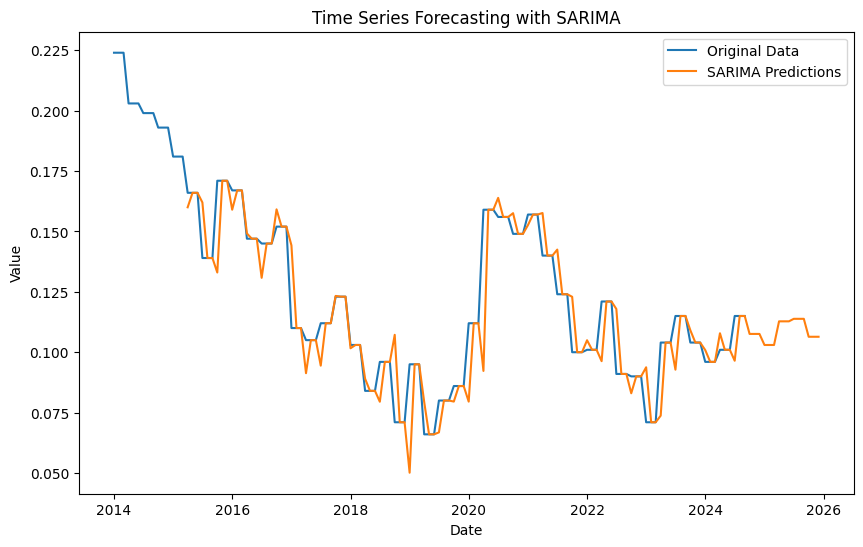

R^2 Score for SARIMA: 0.81
SARIMA - MSE: 0.00016473634504316962, RMSE: 0.012834965720373764, MAPE: 5.26%


In [231]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Total') 

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-690.917, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-725.165, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-692.917, Time=0.07 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-733.675, Time=0.27 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-742.058, Time=0.56 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-764.575, Time=0.91 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-763.641, Time=0.57 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-761.498, Time=0.10 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-769.705, Time=0.40 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-744.043, Time=0.24 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-767.002, Time=0.65 sec
 ARIMA(2,2,0)(0,0,0)[0]       

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


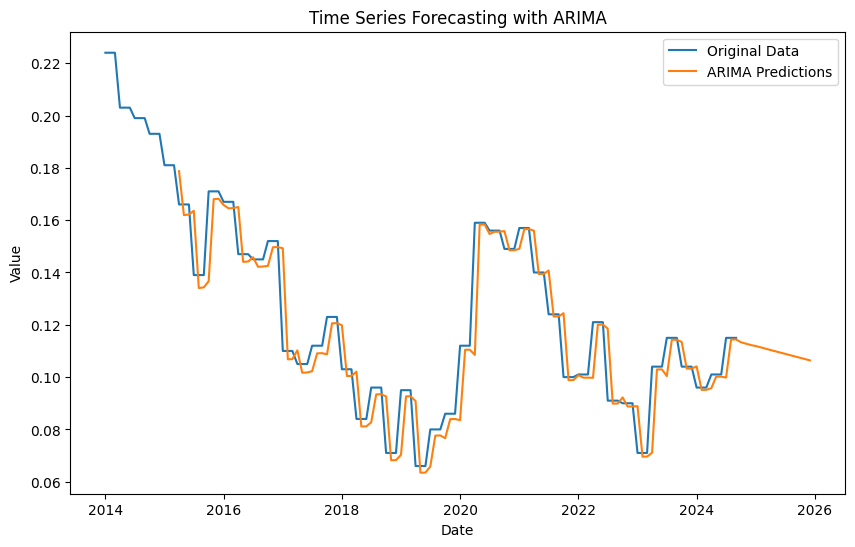

R^2 Score for ARIMA: 0.85
ARIMA - MSE: 0.00013489512651691183, RMSE: 0.011614436125654652, MAPE: 6.21%


In [232]:
model_arima(data_filtered,'Slovenia', '15-24', 'Total')

>expected=0.123, predicted=0.110
>expected=0.123, predicted=0.123
>expected=0.123, predicted=0.123
>expected=0.103, predicted=0.106
>expected=0.103, predicted=0.104
>expected=0.103, predicted=0.104
>expected=0.084, predicted=0.114
>expected=0.084, predicted=0.088
>expected=0.084, predicted=0.085
>expected=0.096, predicted=0.088
>expected=0.096, predicted=0.096
>expected=0.096, predicted=0.096
>expected=0.071, predicted=0.094
>expected=0.071, predicted=0.072
>expected=0.071, predicted=0.071
>expected=0.095, predicted=0.087
>expected=0.095, predicted=0.095
>expected=0.095, predicted=0.095
>expected=0.066, predicted=0.095
>expected=0.066, predicted=0.070
>expected=0.066, predicted=0.067
>expected=0.080, predicted=0.081
>expected=0.080, predicted=0.080
>expected=0.080, predicted=0.080
>expected=0.086, predicted=0.071
>expected=0.086, predicted=0.085
>expected=0.086, predicted=0.086
>expected=0.112, predicted=0.082
>expected=0.112, predicted=0.110
>expected=0.112, predicted=0.112
>expected=

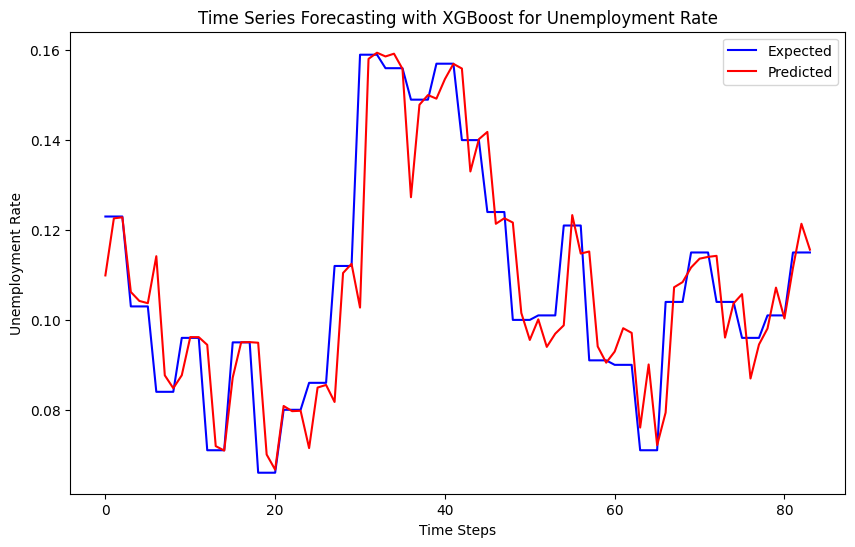

In [233]:
xgboostprediction(combined_df, country='Slovenia', age='15-24', sex='Total')

### 25+, Male

In [234]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Male')

In [235]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9683
Strong seasonality detected.


(0.9683391424180268, True)

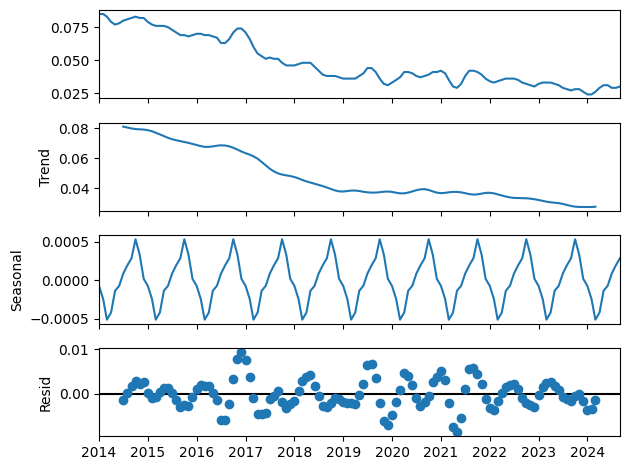

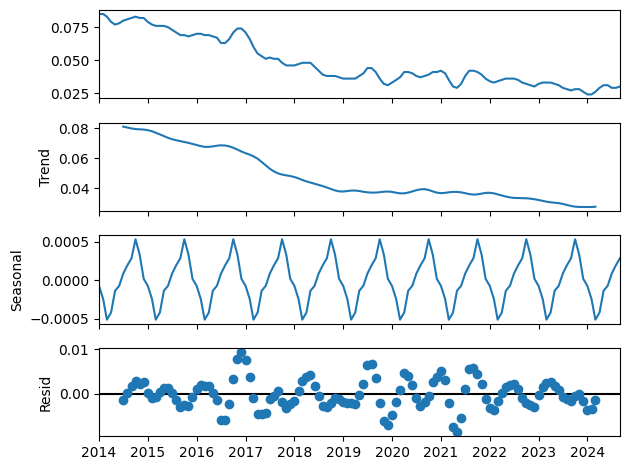

In [236]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1114.341, Time=1.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-984.582, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1111.094, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1083.321, Time=0.71 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1061.257, Time=0.06 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1112.492, Time=0.87 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1112.880, Time=1.28 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1117.453, Time=0.13 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-1118.614, Time=1.82 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1116.150, Time=0.96 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-1073.375, Time=1.20 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1112.540, Time=1.04 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-1138.188, Time=1.66 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-1132.950, Time=0.92 sec
 ARIMA

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


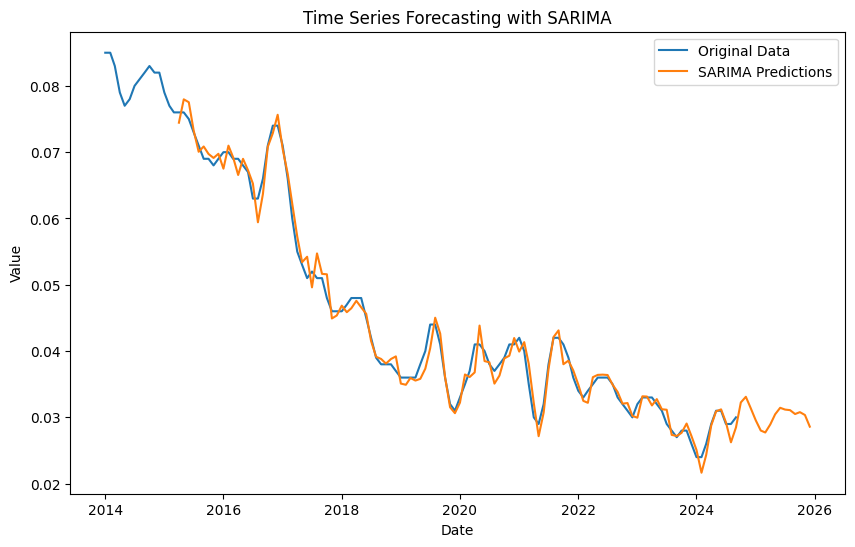

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 2.4530798386863815e-06, RMSE: 0.0015662310936405206, MAPE: 2.92%


In [237]:
model_sarima(data_filtered,'Slovenia', '25+', 'Male')

>expected=0.048, predicted=0.051
>expected=0.046, predicted=0.051
>expected=0.046, predicted=0.049
>expected=0.046, predicted=0.047
>expected=0.047, predicted=0.048
>expected=0.048, predicted=0.048
>expected=0.048, predicted=0.048
>expected=0.048, predicted=0.048
>expected=0.045, predicted=0.048
>expected=0.042, predicted=0.046
>expected=0.039, predicted=0.043
>expected=0.038, predicted=0.041
>expected=0.038, predicted=0.045
>expected=0.038, predicted=0.040
>expected=0.037, predicted=0.038
>expected=0.036, predicted=0.038
>expected=0.036, predicted=0.037
>expected=0.036, predicted=0.037
>expected=0.036, predicted=0.035
>expected=0.038, predicted=0.036
>expected=0.040, predicted=0.037
>expected=0.044, predicted=0.039
>expected=0.044, predicted=0.043
>expected=0.041, predicted=0.044
>expected=0.036, predicted=0.041
>expected=0.032, predicted=0.036
>expected=0.031, predicted=0.034
>expected=0.033, predicted=0.033
>expected=0.035, predicted=0.037
>expected=0.037, predicted=0.038
>expected=

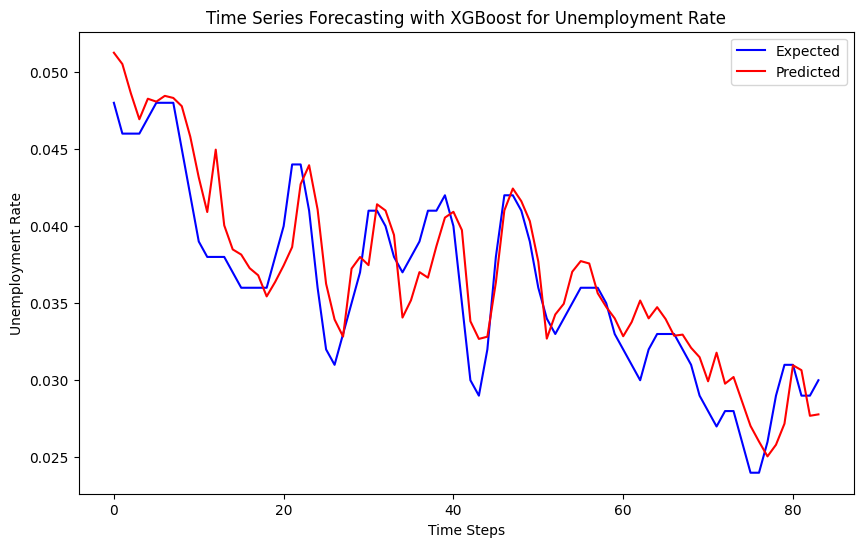

In [238]:
xgboostprediction(combined_df, country='Slovenia', age='25+', sex='Male')

### 25+, Female

In [239]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Female')

In [240]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9821
Strong seasonality detected.


(0.982109509787186, True)

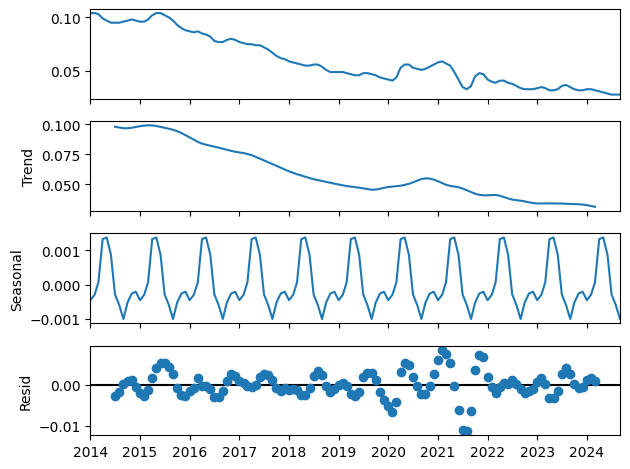

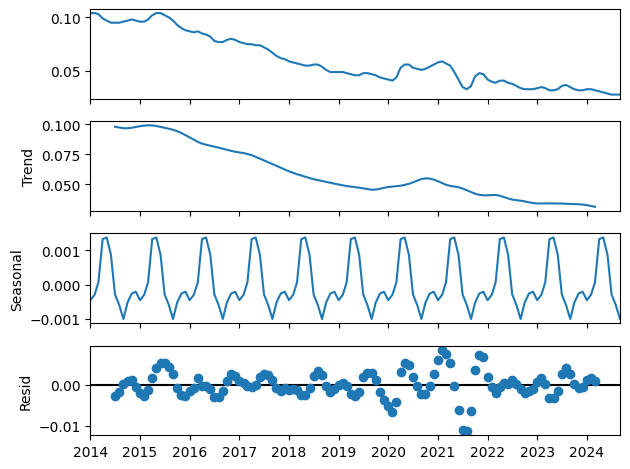

In [241]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1109.044, Time=0.87 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-983.910, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1071.274, Time=0.62 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1067.432, Time=0.50 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1057.631, Time=0.18 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1093.138, Time=0.76 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1053.630, Time=0.83 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1083.055, Time=0.35 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1078.179, Time=0.91 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1098.492, Time=0.37 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1123.539, Time=0.43 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1077.711, Time=0.71 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1107.631, Time=0.33 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1073.712, Time=1.15 sec
 ARIMA

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


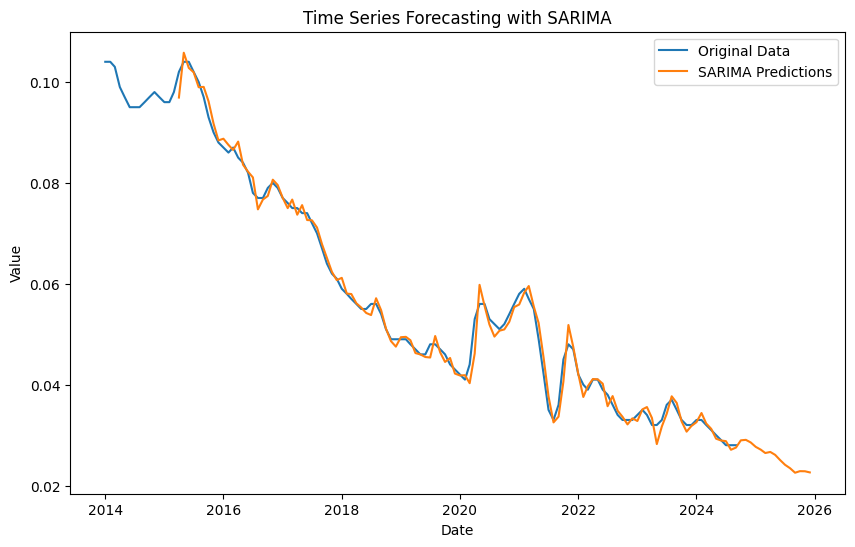

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 3.1083555289870113e-06, RMSE: 0.0017630529002236465, MAPE: 2.56%


In [242]:
model_sarima(data_filtered,'Slovenia', '25+', 'Female')

>expected=0.064, predicted=0.068
>expected=0.062, predicted=0.065
>expected=0.061, predicted=0.063
>expected=0.059, predicted=0.062
>expected=0.058, predicted=0.060
>expected=0.057, predicted=0.059
>expected=0.056, predicted=0.058
>expected=0.055, predicted=0.057
>expected=0.055, predicted=0.056
>expected=0.056, predicted=0.056
>expected=0.056, predicted=0.056
>expected=0.054, predicted=0.056
>expected=0.051, predicted=0.055
>expected=0.049, predicted=0.052
>expected=0.049, predicted=0.050
>expected=0.049, predicted=0.050
>expected=0.049, predicted=0.050
>expected=0.048, predicted=0.050
>expected=0.047, predicted=0.049
>expected=0.046, predicted=0.048
>expected=0.046, predicted=0.047
>expected=0.048, predicted=0.047
>expected=0.048, predicted=0.047
>expected=0.047, predicted=0.047
>expected=0.046, predicted=0.047
>expected=0.044, predicted=0.047
>expected=0.043, predicted=0.045
>expected=0.042, predicted=0.044
>expected=0.041, predicted=0.043
>expected=0.044, predicted=0.042
>expected=

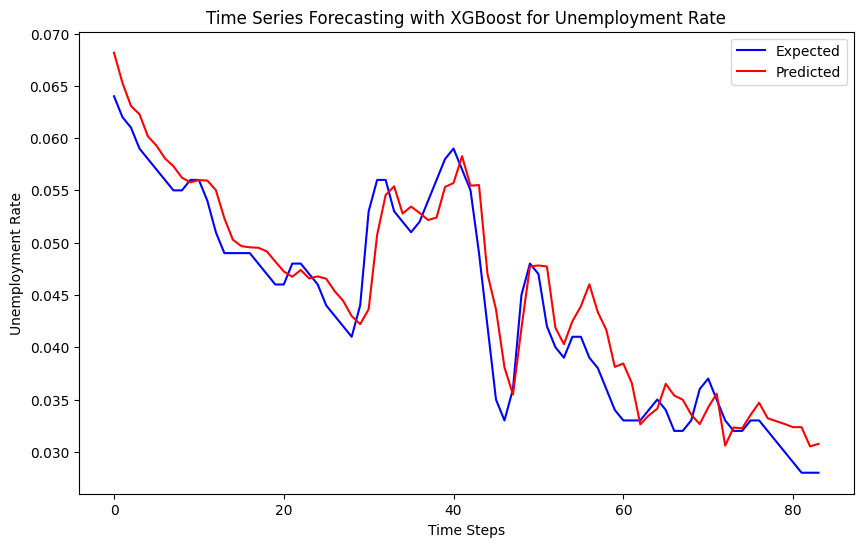

In [243]:
xgboostprediction(combined_df, country='Slovenia', age='25+', sex='Female')

### 25+, Total

In [244]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Total')

In [245]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9859
Strong seasonality detected.


(0.9858657057630562, True)

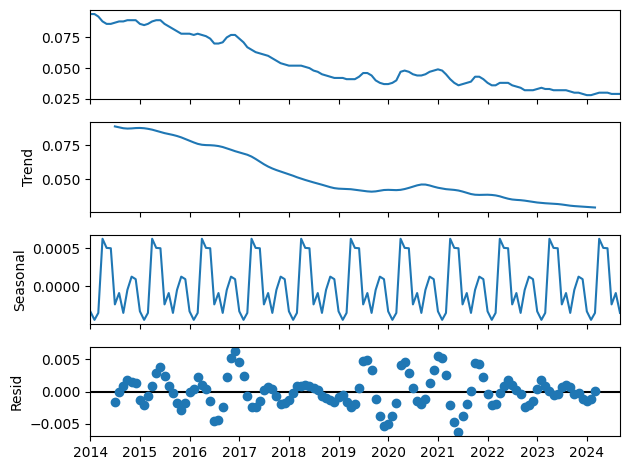

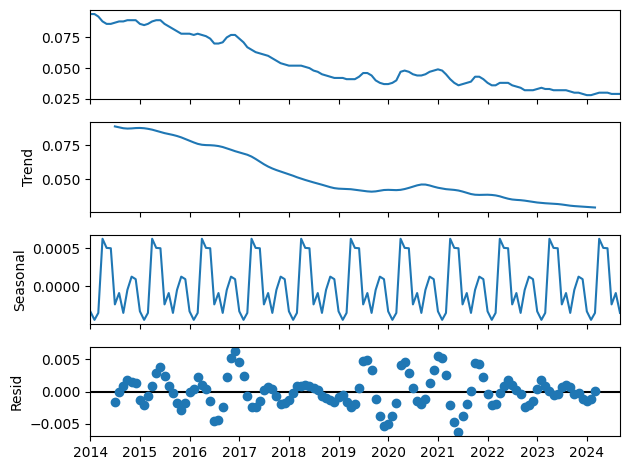

In [246]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1148.351, Time=0.86 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1031.448, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1140.176, Time=1.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1142.416, Time=0.73 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1084.930, Time=0.15 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1139.586, Time=0.82 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1080.931, Time=0.42 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1143.185, Time=0.67 sec


C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1908: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1120.670, Time=0.71 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1144.618, Time=0.54 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1091.186, Time=0.54 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1139.458, Time=0.67 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1096.167, Time=0.24 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1154.119, Time=0.50 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-1093.066, Time=0.33 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1144.009, Time=0.60 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1089.067, Time=0.83 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-1147.322, Time=0.40 sec
 ARIMA(0,1,2)(1,1,2)[12]             : AIC=-1142.138, Time=1.28 sec
 ARIMA(0,1,3)(0,1,1)[12]             : AIC=-1134.164, Time=0.93 sec
 ARIMA(1,1,3)(0,1,1)[12]             : AIC=-1153.294, Time=0.70 sec
 ARIMA(0,1,2)(0,1,1)[12] intercept   : AIC=-1152.319, Time=0.75 sec

Best model:  ARIMA(0,1,2)(0,1,1)[12]          


C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


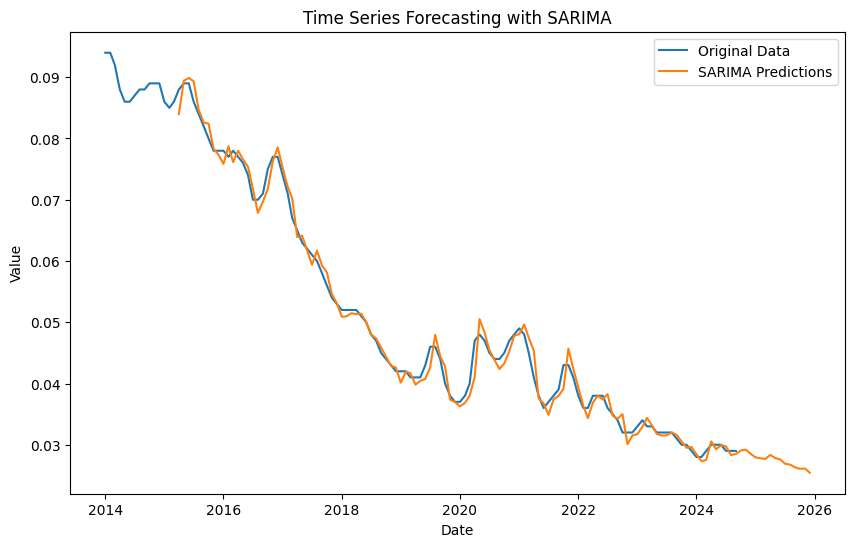

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 2.63324984411412e-06, RMSE: 0.0016227291345489918, MAPE: 2.60%


In [247]:
model_sarima(data_filtered,'Slovenia', '25+', 'Total')

>expected=0.056, predicted=0.059
>expected=0.054, predicted=0.057
>expected=0.053, predicted=0.055
>expected=0.052, predicted=0.054
>expected=0.052, predicted=0.053
>expected=0.052, predicted=0.053
>expected=0.052, predicted=0.052
>expected=0.051, predicted=0.052
>expected=0.050, predicted=0.053
>expected=0.048, predicted=0.051
>expected=0.047, predicted=0.049
>expected=0.045, predicted=0.048
>expected=0.044, predicted=0.048
>expected=0.043, predicted=0.047
>expected=0.042, predicted=0.044
>expected=0.042, predicted=0.043
>expected=0.042, predicted=0.043
>expected=0.041, predicted=0.042
>expected=0.041, predicted=0.042
>expected=0.041, predicted=0.042
>expected=0.043, predicted=0.041
>expected=0.046, predicted=0.042
>expected=0.046, predicted=0.045
>expected=0.044, predicted=0.046
>expected=0.040, predicted=0.043
>expected=0.038, predicted=0.041
>expected=0.037, predicted=0.039
>expected=0.037, predicted=0.040
>expected=0.038, predicted=0.039
>expected=0.040, predicted=0.038
>expected=

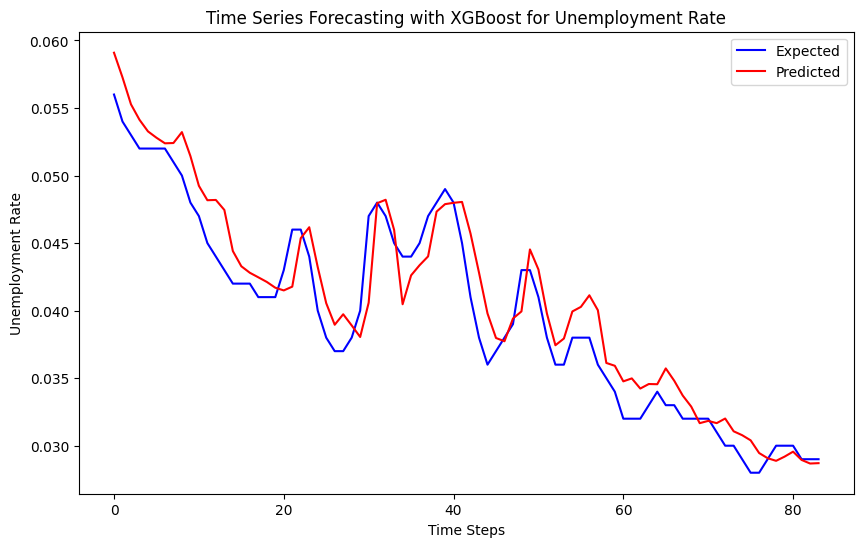

In [248]:
xgboostprediction(combined_df, country='Slovenia', age='25+', sex='Total')

## Norway

In [30]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Female')

>expected=0.123, predicted=0.151
>expected=0.157, predicted=0.153
>expected=0.137, predicted=0.144
>expected=0.113, predicted=0.147
>expected=0.150, predicted=0.151
>expected=0.147, predicted=0.134
>expected=0.128, predicted=0.135
>expected=0.139, predicted=0.145
>expected=0.155, predicted=0.152
>expected=0.128, predicted=0.122
>expected=0.135, predicted=0.137
>expected=0.145, predicted=0.151
>expected=0.118, predicted=0.135
>expected=0.130, predicted=0.135
>expected=0.142, predicted=0.154
>expected=0.113, predicted=0.121
>expected=0.116, predicted=0.131
>expected=0.121, predicted=0.148
>expected=0.128, predicted=0.116
>expected=0.115, predicted=0.123
>expected=0.142, predicted=0.118
>expected=0.130, predicted=0.127
>expected=0.119, predicted=0.126
>expected=0.126, predicted=0.139
>expected=0.128, predicted=0.117
>expected=0.122, predicted=0.124
>expected=0.119, predicted=0.132
>expected=0.114, predicted=0.130
>expected=0.133, predicted=0.121
>expected=0.111, predicted=0.124
>expected=

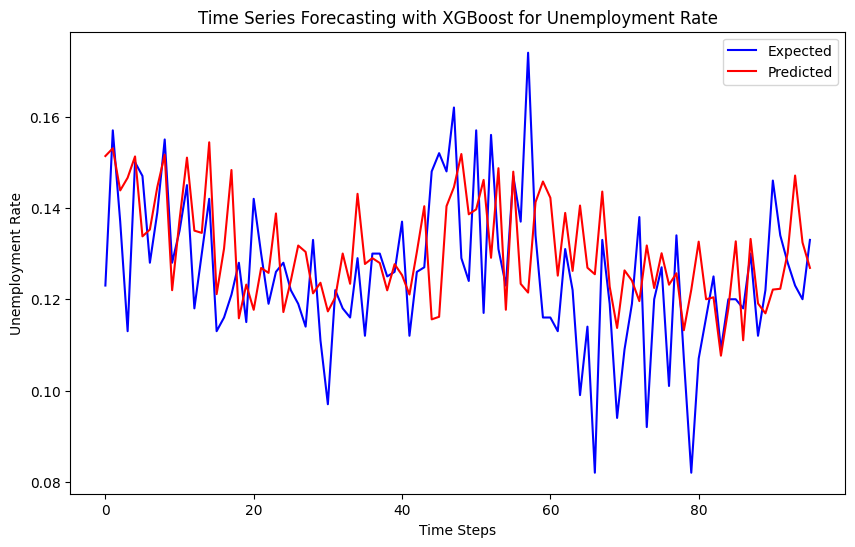

In [250]:
from numpy import asarray
from pandas import DataFrame, concat, to_datetime
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from xgboost import XGBRegressor
from matplotlib import pyplot
import math

# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return data[:-n_test, :], data[-n_test:, :]

# fit an xgboost model and make a one step prediction
def xgboost_forecast(train, testX):
    # transform list into array
    train = asarray(train)
    # split into input and output columns
    trainX, trainy = train[:, :-1], train[:, -1]
    # fit model
    model = XGBRegressor(objective='reg:squarederror', n_estimators=1000)
    model.fit(trainX, trainy)
    # make a one-step prediction
    yhat = model.predict(asarray([testX]))
    return yhat[0]

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test):
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test)
    # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set
    for i in range(len(test)):
        # split test row into input and output columns
        testX, testy = test[i, :-1], test[i, -1]
        # fit model on history and make a prediction
        yhat = xgboost_forecast(history, testX)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
        # summarize progress
        print('>expected=%.3f, predicted=%.3f' % (testy, yhat))
    # estimate prediction error
    mae = mean_absolute_error(test[:, -1], predictions)
    r2 = r2_score(test[:, -1], predictions)
    rmse = math.sqrt(mean_squared_error(test[:, -1], predictions))
    return mae, r2, rmse, test[:, -1], predictions

# Load and preprocess dataset
def prepare_data_for_xgboost(combined_df, country, age, sex):
    # Filter the data based on provided country, age, and sex
    data_filtered = combined_df[
        (combined_df['Country'] == country) &
        (combined_df['Age'] == age) &
        (combined_df['Sex'] == sex)
    ].copy()

    # Prepare the Date column
    data_filtered['Date'] = to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')

    # Drop unnecessary columns and set the index
    data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
    data_filtered.set_index('Date', inplace=True)
    data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
    data_filtered = data_filtered.sort_values(by='Date')

    return data_filtered

# Apply the XGBoost time series prediction to the unemployment dataset
data_filtered = prepare_data_for_xgboost(combined_df, country='Norway', age='15-24', sex='Male')
values = data_filtered['Value'].values.reshape(-1, 1)

# Transform the time series data into supervised learning
data = series_to_supervised(values, n_in=12)

# Evaluate the model
mae, r2, rmse, y, yhat = walk_forward_validation(data, 96)
print('MAE: %.3f' % mae)
print('R^2: %.3f' % r2)
print('RMSE: %.3f' % rmse)

# Plot expected vs predicted
pyplot.figure(figsize=(10, 6))
pyplot.plot(y, label='Expected', color='blue')
pyplot.plot(yhat, label='Predicted', color='red')
pyplot.legend()
pyplot.title('Time Series Forecasting with XGBoost for Unemployment Rate')
pyplot.xlabel('Time Steps')
pyplot.ylabel('Unemployment Rate')
pyplot.show()


In [62]:
data_filtered

,y,ds
18182,0.114,2014-01-01
18183,0.077,2014-02-01
18184,0.118,2014-03-01
18185,0.103,2014-04-01
18186,0.094,2014-05-01
...,...,...
18255,0.134,2024-05-01
18256,0.128,2024-06-01
18257,0.123,2024-07-01
18258,0.120,2024-08-01


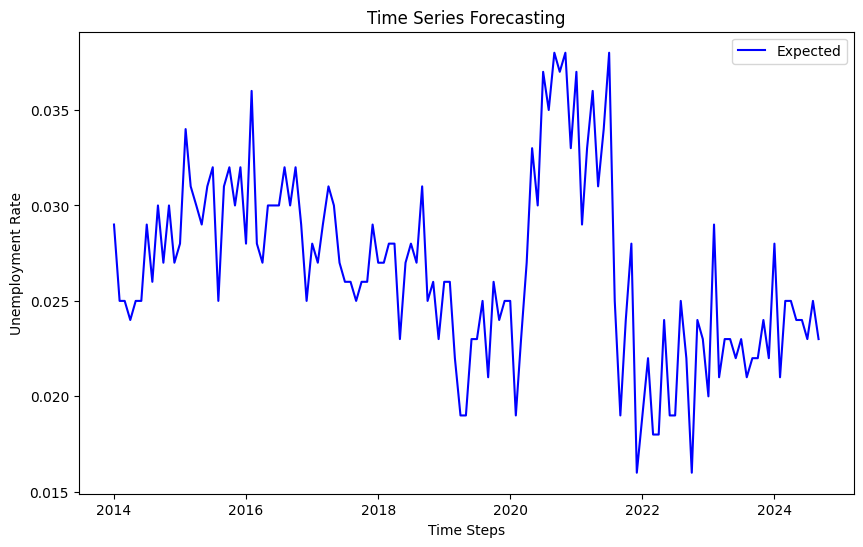

In [31]:
# Plot expected vs predicted
pyplot.figure(figsize=(10, 6))
pyplot.plot(data_filtered['Value'], label='Expected', color='blue')
pyplot.legend()
pyplot.title('Time Series Forecasting')
pyplot.xlabel('Time Steps')
pyplot.ylabel('Unemployment Rate')
pyplot.show()   

>expected=0.123, predicted=0.152
>expected=0.157, predicted=0.143
>expected=0.137, predicted=0.141
>expected=0.113, predicted=0.137
>expected=0.150, predicted=0.143
>expected=0.147, predicted=0.133
>expected=0.128, predicted=0.138
>expected=0.139, predicted=0.143
>expected=0.155, predicted=0.149
>expected=0.128, predicted=0.133
>expected=0.135, predicted=0.138
>expected=0.145, predicted=0.147
>expected=0.118, predicted=0.134
>expected=0.130, predicted=0.135
>expected=0.142, predicted=0.146
>expected=0.113, predicted=0.124
>expected=0.116, predicted=0.134
>expected=0.121, predicted=0.141
>expected=0.128, predicted=0.125
>expected=0.115, predicted=0.122
>expected=0.142, predicted=0.123
>expected=0.130, predicted=0.129
>expected=0.119, predicted=0.127
>expected=0.126, predicted=0.133
>expected=0.128, predicted=0.129
>expected=0.122, predicted=0.120
>expected=0.119, predicted=0.134
>expected=0.114, predicted=0.135
>expected=0.133, predicted=0.126
>expected=0.111, predicted=0.123
>expected=

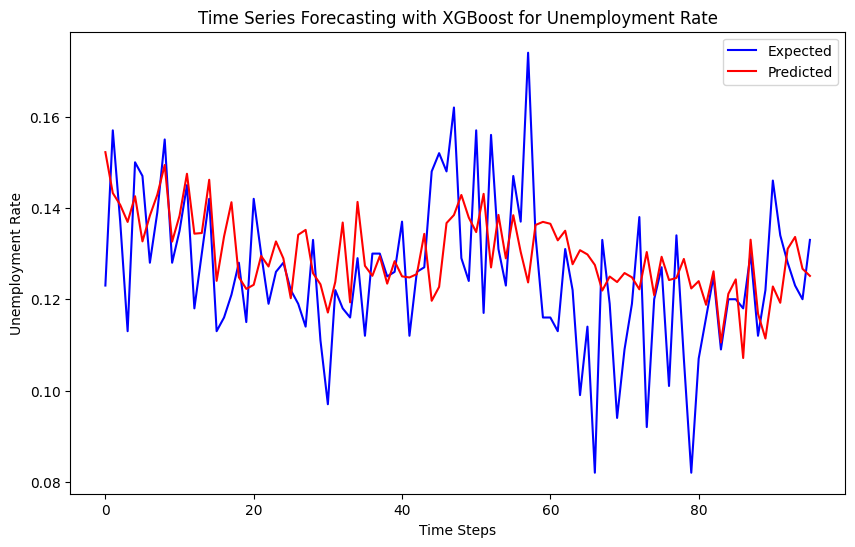

In [6]:
from numpy import asarray
from pandas import DataFrame, concat, to_datetime
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from xgboost import XGBRegressor
from matplotlib import pyplot
import math

# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return data[:-n_test, :], data[-n_test:, :]

# fit an xgboost model with Grid Search and make a one-step prediction
def xgboost_forecast(train, testX):
    # transform list into array
    train = asarray(train)
    # split into input and output columns
    trainX, trainy = train[:, :-1], train[:, -1]
    # define parameter grid for Grid Search
    param_grid = {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [2, 3, 4],
        'subsample': [0.8, 1],
        'colsample_bytree': [0.8, 1]
    }
    # define TimeSeriesSplit for cross-validation
    tscv = TimeSeriesSplit(n_splits=5)
    # define model
    xgb_model = XGBRegressor(objective='reg:squarederror', random_state=0)
    # define Grid Search with cross-validation
    grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)
    # fit Grid Search
    grid_search.fit(trainX, trainy)
    # get the best model
    best_model = grid_search.best_estimator_
    # make a one-step prediction
    yhat = best_model.predict(asarray([testX]))
    return yhat[0]

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test):
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test)
    # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set
    for i in range(len(test)):
        # split test row into input and output columns
        testX, testy = test[i, :-1], test[i, -1]
        # fit model on history and make a prediction
        yhat = xgboost_forecast(history, testX)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
        # summarize progress
        print(f'>expected={testy:.3f}, predicted={yhat:.3f}')
    # estimate prediction error
    mae = mean_absolute_error(test[:, -1], predictions)
    r2 = r2_score(test[:, -1], predictions)
    rmse = math.sqrt(mean_squared_error(test[:, -1], predictions))
    return mae, r2, rmse, test[:, -1], predictions

# Load and preprocess dataset
def prepare_data_for_xgboost(combined_df, country, age, sex):
    # Filter the data based on provided country, age, and sex
    data_filtered = combined_df[
        (combined_df['Country'] == country) &
        (combined_df['Age'] == age) &
        (combined_df['Sex'] == sex)
    ].copy()

    # Prepare the Date column
    data_filtered['Date'] = to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')

    # Drop unnecessary columns and set the index
    data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
    data_filtered.set_index('Date', inplace=True)
    data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
    data_filtered = data_filtered.sort_values(by='Date')

    return data_filtered

# Apply the XGBoost time series prediction to the unemployment dataset
data_filtered = prepare_data_for_xgboost(combined_df, country='Norway', age='15-24', sex='Male')
values = data_filtered['Value'].values.reshape(-1, 1)

# Transform the time series data into supervised learning
data = series_to_supervised(values, n_in=12)

# Evaluate the model
mae, r2, rmse, y, yhat = walk_forward_validation(data, n_test=96)
print('MAE: %.3f' % mae)
print('R^2: %.3f' % r2)
print('RMSE: %.3f' % rmse)

# Plot expected vs predicted
pyplot.figure(figsize=(10, 6))
pyplot.plot(y, label='Expected', color='blue')
pyplot.plot(yhat, label='Predicted', color='red')
pyplot.legend()
pyplot.title('Time Series Forecasting with XGBoost for Unemployment Rate')
pyplot.xlabel('Time Steps')
pyplot.ylabel('Unemployment Rate')
pyplot.show()


>expected=0.123, predicted=0.152
>expected=0.157, predicted=0.143
>expected=0.137, predicted=0.141
>expected=0.113, predicted=0.137
>expected=0.150, predicted=0.143
>expected=0.147, predicted=0.133
>expected=0.128, predicted=0.138
>expected=0.139, predicted=0.143
>expected=0.155, predicted=0.149
>expected=0.128, predicted=0.133
>expected=0.135, predicted=0.138
>expected=0.145, predicted=0.147
>expected=0.118, predicted=0.134
>expected=0.130, predicted=0.135
>expected=0.142, predicted=0.146
>expected=0.113, predicted=0.124
>expected=0.116, predicted=0.134
>expected=0.121, predicted=0.141
>expected=0.128, predicted=0.125
>expected=0.115, predicted=0.122
>expected=0.142, predicted=0.123
>expected=0.130, predicted=0.129
>expected=0.119, predicted=0.127
>expected=0.126, predicted=0.133
>expected=0.128, predicted=0.129
>expected=0.122, predicted=0.120
>expected=0.119, predicted=0.134
>expected=0.114, predicted=0.135
>expected=0.133, predicted=0.126
>expected=0.111, predicted=0.123
>expected=

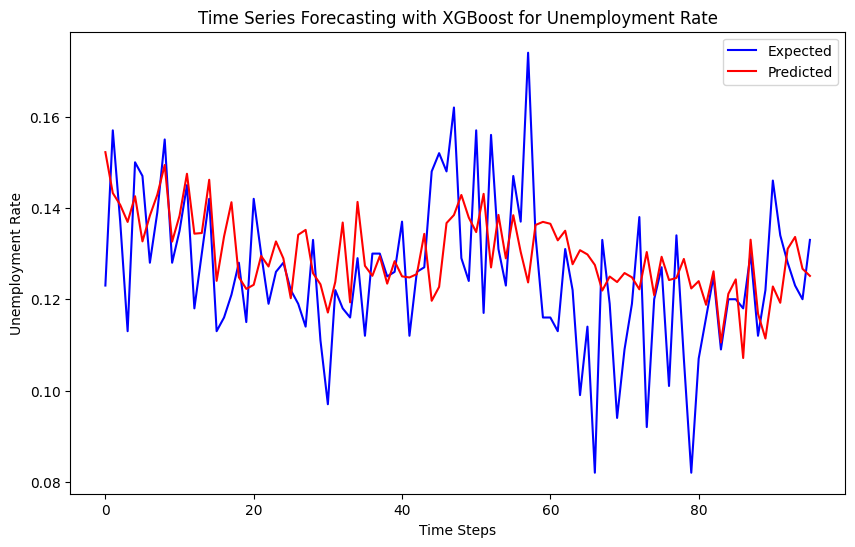

TypeError: list indices must be integers or slices, not tuple

In [5]:
from numpy import asarray
from pandas import DataFrame, concat, to_datetime
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from xgboost import XGBRegressor
from matplotlib import pyplot
import math

# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return data[:-n_test, :], data[-n_test:, :]

# fit an xgboost model with Grid Search and make a one-step prediction
def xgboost_forecast(train, testX):
    # transform list into array
    train = asarray(train)
    # split into input and output columns
    trainX, trainy = train[:, :-1], train[:, -1]
    # define parameter grid for Grid Search
    param_grid = {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [2, 3, 4],
        'subsample': [0.8, 1],
        'colsample_bytree': [0.8, 1]
    }
    # define TimeSeriesSplit for cross-validation
    tscv = TimeSeriesSplit(n_splits=5)
    # define model
    xgb_model = XGBRegressor(objective='reg:squarederror', random_state=0)
    # define Grid Search with cross-validation
    grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=tscv, scoring='neg_mean_squared_error', n_jobs=-1)
    # fit Grid Search
    grid_search.fit(trainX, trainy)
    # get the best model
    best_model = grid_search.best_estimator_
    # make a one-step prediction
    yhat = best_model.predict(asarray([testX]))
    return yhat[0]

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test):
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test)
    # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set
    for i in range(len(test)):
        # split test row into input and output columns
        testX, testy = test[i, :-1], test[i, -1]
        # fit model on history and make a prediction
        yhat = xgboost_forecast(history, testX)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
        # summarize progress
        print(f'>expected={testy:.3f}, predicted={yhat:.3f}')
    # estimate prediction error
    mae = mean_absolute_error(test[:, -1], predictions)
    r2 = r2_score(test[:, -1], predictions)
    rmse = math.sqrt(mean_squared_error(test[:, -1], predictions))
    return mae, r2, rmse, test[:, -1], predictions

# Load and preprocess dataset
def prepare_data_for_xgboost(combined_df, country, age, sex):
    # Filter the data based on provided country, age, and sex
    data_filtered = combined_df[
        (combined_df['Country'] == country) &
        (combined_df['Age'] == age) &
        (combined_df['Sex'] == sex)
    ].copy()

    # Prepare the Date column
    data_filtered['Date'] = to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')

    # Drop unnecessary columns and set the index
    data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
    data_filtered.set_index('Date', inplace=True)
    data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
    data_filtered = data_filtered.sort_values(by='Date')

    return data_filtered

# Apply the XGBoost time series prediction to the unemployment dataset
data_filtered = prepare_data_for_xgboost(combined_df, country='Norway', age='15-24', sex='Male')
values = data_filtered['Value'].values.reshape(-1, 1)

# Transform the time series data into supervised learning
data = series_to_supervised(values, n_in=12)

# Evaluate the model
mae, r2, rmse, y, yhat = walk_forward_validation(data, n_test=96)
print('MAE: %.3f' % mae)
print('R^2: %.3f' % r2)
print('RMSE: %.3f' % rmse)

# Plot expected vs predicted
pyplot.figure(figsize=(10, 6))
pyplot.plot(y, label='Expected', color='blue')
pyplot.plot(yhat, label='Predicted', color='red')
pyplot.legend()
pyplot.title('Time Series Forecasting with XGBoost for Unemployment Rate')
pyplot.xlabel('Time Steps')
pyplot.ylabel('Unemployment Rate')
pyplot.show()

# Forecast for 2025
def forecast_2025(data, n_months=12):
    history = [x for x in data]
    predictions_2025 = list()
    # Generate predictions for the next n_months
    for _ in range(n_months):
        testX = history[-12:, :-1]  # Use the last 12 months as input features
        yhat = xgboost_forecast(history, testX[0])
        predictions_2025.append(yhat)
        # Append the new prediction to history
        new_row = list(testX[0]) + [yhat]
        history.append(new_row)
    return predictions_2025

# Generate predictions for 2025 and save to DataFrame
predictions_2025 = forecast_2025(data)
dates_2025 = [data_filtered.index[-1] + pd.DateOffset(months=i+1) for i in range(len(predictions_2025))]
forecast_df = DataFrame({'Date': dates_2025, 'Predicted_Unemployment_Rate': predictions_2025})
forecast_df.set_index('Date', inplace=True)
print(forecast_df)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=7.39 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-502.190, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-554.606, Time=0.56 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-522.634, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-560.186, Time=0.50 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-532.083, Time=0.14 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-592.743, Time=0.51 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-587.497, Time=0.31 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.75 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-592.008, Time=0.71 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-594.5

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


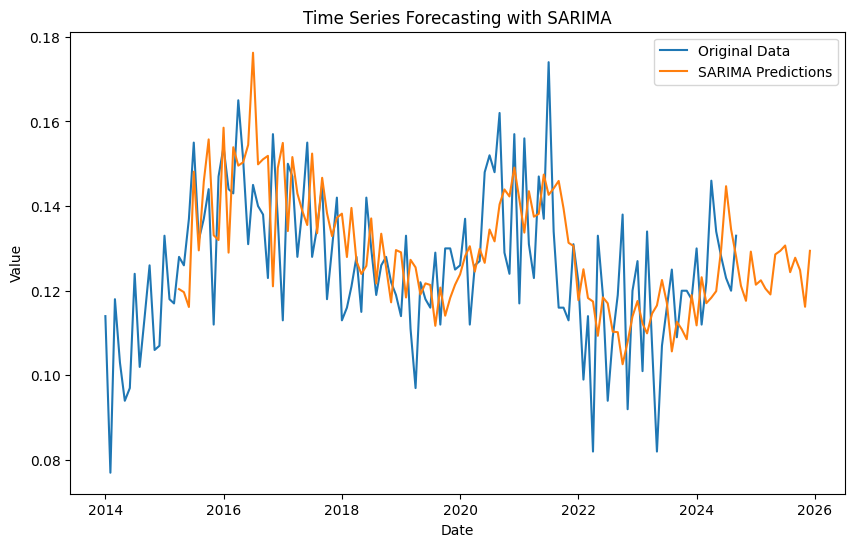

R^2 Score for SARIMA: 0.04
SARIMA - MSE: 0.0002701378199509816, RMSE: 0.016435869917682533, MAPE: 10.80%


In [258]:
model_sarima(data_filtered,'Norway', '25+', 'Female')

In [ ]:
model_arima(data_filtered,'Norway', '25+', 'Female')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from xgboost import XGBRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Підготовка даних
data = data_filtered.copy()
data.index = pd.to_datetime(data.index)

# Розділення на тренувальну і тестову вибірку
train_data = data[:'2024-09']
test_data = data['2015-04':]

# Прогнозування за допомогою SARIMA
sarima_model = SARIMAX(train_data['Value'], order=(2,2, 1), seasonal_order=(2,2,1, 12))
sarima_fit = sarima_model.fit(disp=False)
sarima_forecast_train = sarima_fit.get_prediction(start=train_data.index[0], end=train_data.index[-1]).predicted_mean

# Підготовка даних для XGBoost
train_data_features = np.array(train_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)
train_data_values = train_data['Value'].values

test_data_features = np.array(test_data.index.map(pd.Timestamp.toordinal)).reshape(-1, 1)

# Навчання моделі XGBoost
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0)
xgb_model.fit(train_data_features, train_data_values)

# Створення ансамблевого прогнозу з використанням StackingRegressor
# Використання прогнозу SARIMA як нової змінної для стекінгу
train_data_combined = np.column_stack((train_data_features, sarima_forecast_train.values))

estimators = [
    ('xgb', xgb_model)
]
stacking_model = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())
stacking_model.fit(train_data_combined, train_data_values)

# Прогнозування за допомогою SARIMA для тестового періоду
sarima_forecast_test = sarima_fit.get_prediction(start=test_data.index[0], end=test_data.index[-1]).predicted_mean

# Підготовка даних для прогнозування ансамблю
test_data_combined = np.column_stack((test_data_features, sarima_forecast_test.values))

# Прогнозування за допомогою ансамблю (Stacking)
ensemble_forecast = stacking_model.predict(test_data_combined)

# Обчислення метрик якості
r2 = r2_score(test_data['Value'], ensemble_forecast)
rmse = np.sqrt(mean_squared_error(test_data['Value'], ensemble_forecast))

# Виведення результатів
print(f'R^2: {r2:.4f}')
print(f'RMSE: {rmse:.4f}')

# Візуалізація
plt.figure(figsize=(10, 6))
plt.plot(train_data.index, train_data['Value'], label='Train Data')
plt.plot(test_data.index, test_data['Value'], label='Actual Test Data')
plt.plot(test_data.index, ensemble_forecast, label='Ensemble Forecast (Stacking SARIMA + XGBoost)', linestyle='--')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Ensemble Forecast vs Actual')
plt.show()

In [ ]:
forecast_results_df 

In [ ]:
data = forecast_results_df.copy()
filtered_data = data[pd.to_datetime(data['Date']) >= pd.to_datetime("2025-01-01")]

In [ ]:
filtered_data

# Latvia

## 15-24, Female

In [9]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Female')

In [10]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7596
Strong seasonality detected.


(0.7596440413530112, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=4.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-537.251, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-632.196, Time=1.84 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=6.65 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-594.929, Time=0.15 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-654.745, Time=5.39 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-600.295, Time=0.09 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-703.166, Time=2.13 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-674.077, Time=1.45 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-714.236, Time=4.80 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-708.935, Time=1.71 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-704.637, Time=1.78 sec
 ARIMA(2,1,0)(1,1,2)[12]             : 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


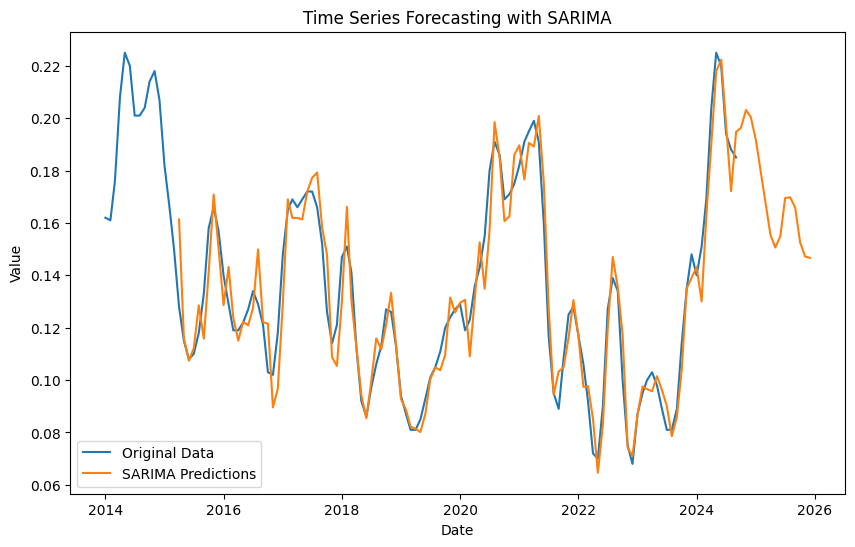

R^2 Score for SARIMA: 0.92
SARIMA - MSE: 9.977012378826495e-05, RMSE: 0.009988499576426129, MAPE: 6.00%


C:\Users\Sofia\AppData\Local\Temp\ipykernel_10936\2546965128.py:48: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  forecast_results_df = pd.concat([forecast_results_df, results], ignore_index=True)


In [11]:
model_sarima(data_filtered,'Latvia', '15-24', 'Female')

C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-870.188, Time=1.06 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-841.026, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-871.050, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-842.988, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-869.467, Time=1.25 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-867.265, Time=1.60 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=-872.983, Time=0.05 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-871.405, Time=0.25 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-872.102, Time=0.38 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-891.628, Time=0.61 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-893.459, Time=0.93 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-887.637, Time=1.76 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-909.548, Time=1.73 sec
 ARIMA(1,2,3)(0,0,0)[0]             : 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization fa

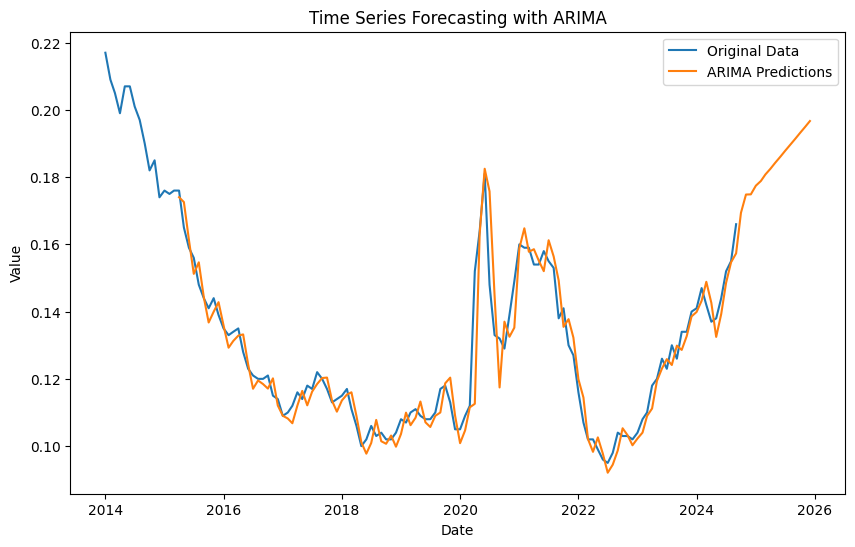

R^2 Score for ARIMA: 0.89
ARIMA - MSE: 4.168577299404144e-05, RMSE: 0.00645645204381179, MAPE: 3.33%


In [20]:
model_arima(data_filtered,'Latvia', '15-24', 'Female')

## 15-24, Male

In [21]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Male')

In [22]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4867
Weak or no seasonality detected.


(0.48671863469056353, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-686.100, Time=3.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-523.421, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-642.107, Time=1.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-635.323, Time=0.58 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-679.628, Time=0.73 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.87 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-681.504, Time=3.17 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-685.517, Time=11.46 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-649.192, Time=1.80 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-719.605, Time=5.10 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-677.653, Time=0.33 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-712.926, Time=2.06 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=9.61 sec
 ARIMA(2,1,1)(1,1,0)[12]         

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


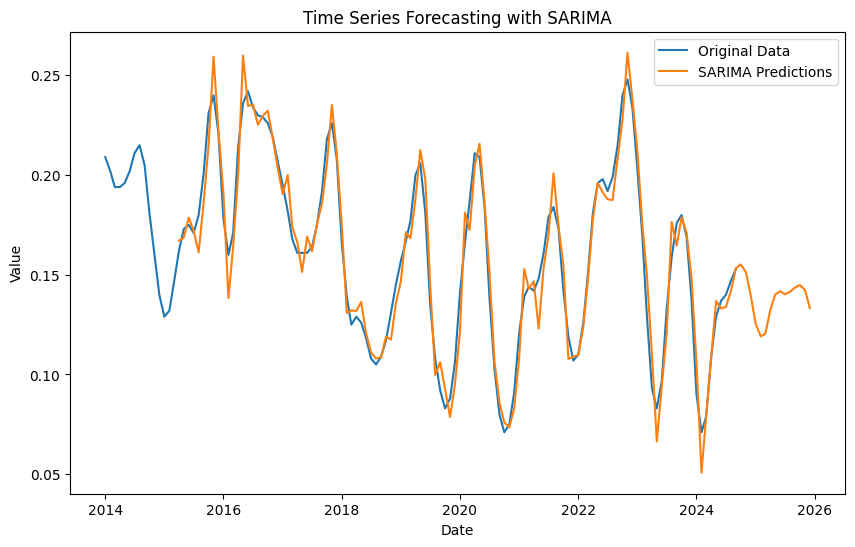

R^2 Score for SARIMA: 0.95
SARIMA - MSE: 0.00010553061371162307, RMSE: 0.010272809436158303, MAPE: 5.73%


In [23]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-757.041, Time=1.27 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-721.536, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-751.699, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-753.812, Time=1.55 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-723.529, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-803.824, Time=0.89 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-771.180, Time=0.42 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-793.060, Time=1.73 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-779.776, Time=0.65 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-785.229, Time=0.67 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-791.458, Time=0.06 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-781.042, Time=0.64 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-811.898, Time=0.41 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-759.039, Time=0.14 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-773.176, Time=0.06 sec
 ARIMA(3,2

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization fa

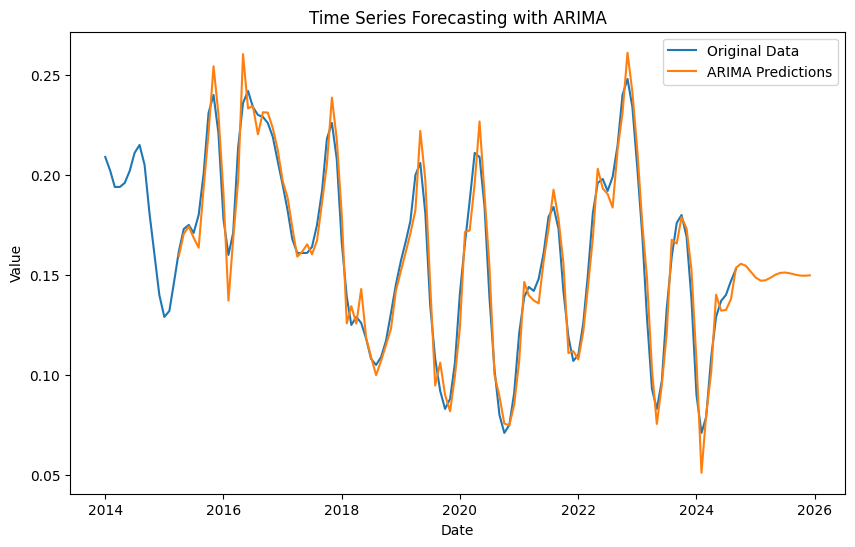

R^2 Score for ARIMA: 0.95
ARIMA - MSE: 9.85748115568831e-05, RMSE: 0.009928484857060674, MAPE: 5.56%


In [24]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Total

In [25]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Total')

In [26]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6432
Weak or no seasonality detected.


(0.6431984976613868, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-647.176, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-745.106, Time=0.47 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-712.708, Time=1.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-718.059, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-747.645, Time=0.67 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-751.874, Time=11.88 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-751.667, Time=2.60 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=5.40 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=6.35 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=3.34 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-791.182, Time=5.87 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-794.323, Time=3.90 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-805.454, Time=6.29 sec
 ARIMA(2,1,0)(0,1,0)[12]             :

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


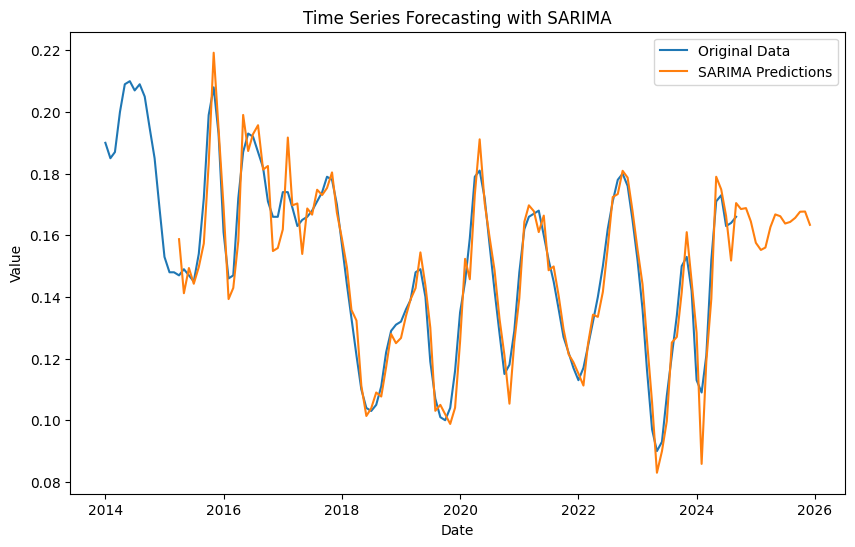

R^2 Score for SARIMA: 0.93
SARIMA - MSE: 5.351021598654581e-05, RMSE: 0.007315067736292385, MAPE: 4.13%


In [27]:
model_sarima(data_filtered,'Latvia', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-861.397, Time=1.34 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-847.265, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-860.557, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-862.406, Time=0.34 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-849.259, Time=0.06 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-867.153, Time=0.77 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-872.609, Time=0.88 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-881.874, Time=0.97 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-885.885, Time=0.71 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-868.223, Time=0.17 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-885.912, Time=0.47 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-887.808, Time=0.30 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-889.807, Time=0.48 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-870.223, Time=0.14 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-887.874, Time=0.35 sec
 ARIMA(2,2

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


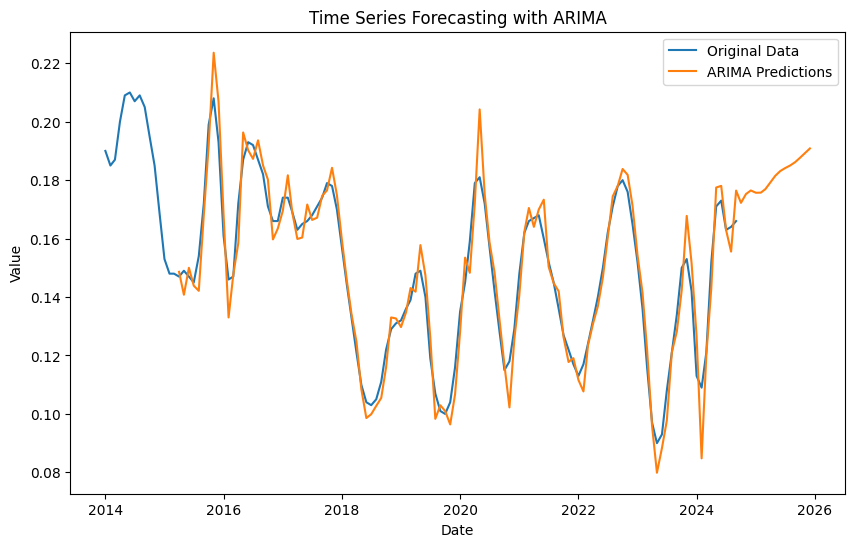

R^2 Score for ARIMA: 0.93
ARIMA - MSE: 5.0344618111272253e-05, RMSE: 0.007095394147704006, MAPE: 3.85%


In [28]:
model_arima(data_filtered,'Latvia', '15-24', 'Total')

## 25+, Male

In [29]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Male')

In [30]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9287
Strong seasonality detected.


(0.9287275949532755, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1041.088, Time=2.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-918.480, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1022.548, Time=0.59 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-939.434, Time=0.97 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-998.560, Time=0.44 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1033.046, Time=1.77 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1027.290, Time=1.61 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1032.469, Time=1.02 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1033.536, Time=2.99 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1024.930, Time=0.80 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1058.356, Time=0.98 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1018.310, Time=0.11 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1041.260, Time=2.13 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1037.406, Time=3.85 sec
 ARIMA(2

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


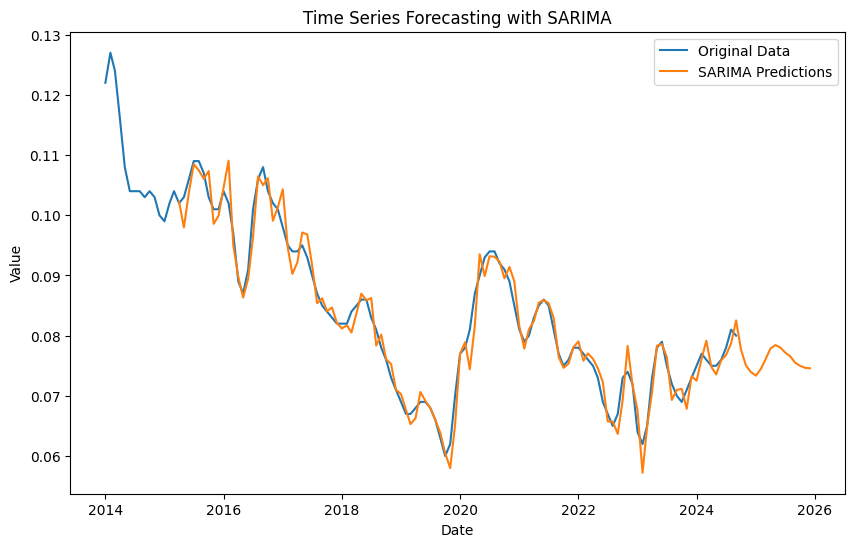

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 5.572890910763695e-06, RMSE: 0.0023606971238944855, MAPE: 2.13%


In [31]:
model_sarima(data_filtered,'Latvia', '25+', 'Male')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1122.685, Time=1.65 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1131.992, Time=0.14 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1138.164, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1137.454, Time=0.40 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1133.954, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1149.287, Time=0.18 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1177.261, Time=0.71 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1174.910, Time=0.79 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1125.992, Time=0.78 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1179.264, Time=0.44 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-1151.263, Time=0.45 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1176.912, Time=0.52 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1127.956, Time=0.41 sec

Best model:  ARIMA(3,2,0)(0,0,0)[0]          
Total fit time: 6.571 seconds
                               SARIMAX Results      

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


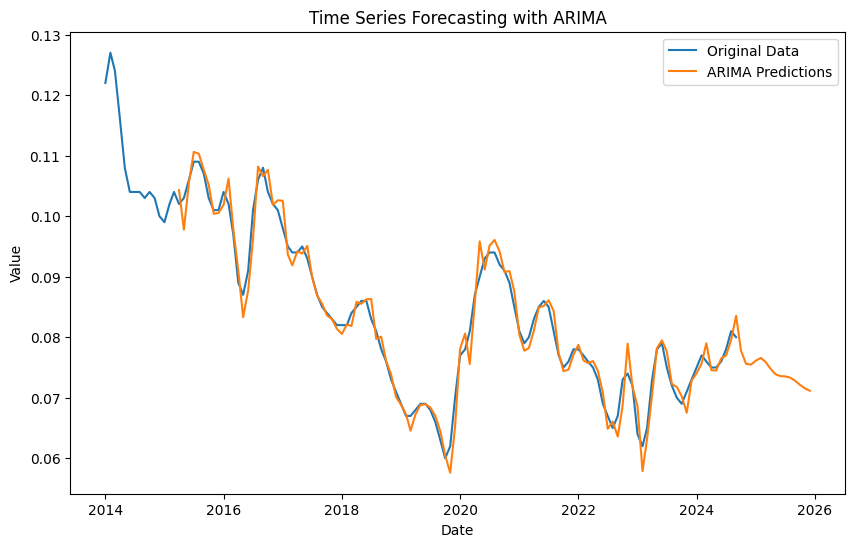

R^2 Score for ARIMA: 0.97
ARIMA - MSE: 4.7432194523171186e-06, RMSE: 0.002177893351915359, MAPE: 2.03%


In [32]:
model_arima(data_filtered,'Latvia', '25+', 'Male')

## 25+, Female

In [33]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Female')

In [34]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9488
Strong seasonality detected.


(0.9488473117690015, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-968.168, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1076.033, Time=0.75 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1033.705, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1100.432, Time=1.18 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1097.209, Time=1.27 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1090.370, Time=1.17 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-1047.506, Time=0.42 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-1098.957, Time=1.53 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-1091.809, Time=1.99 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-910.487, Time=0.84 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-1101.935, Time=3.08 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-1098.148, Time=1.18 sec
 ARIMA(2,1,1)(2,1,1

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


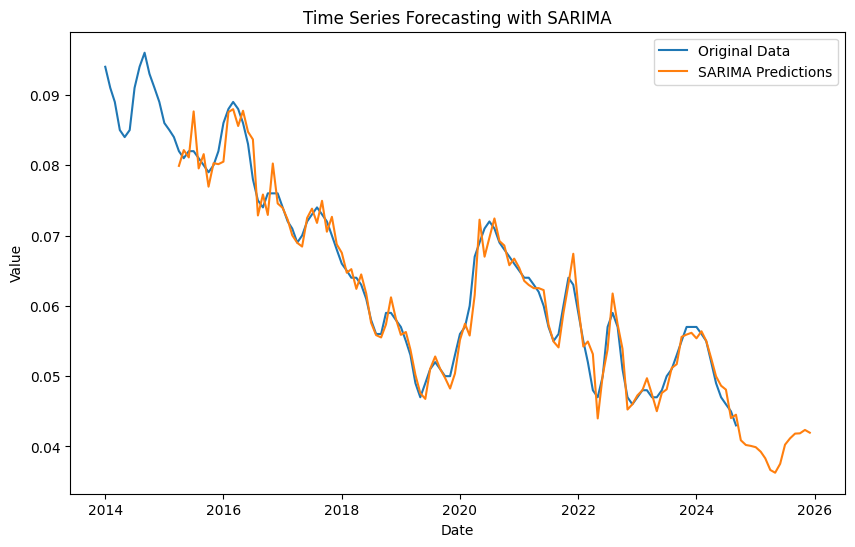

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 3.945664585104768e-06, RMSE: 0.0019863697000067153, MAPE: 2.34%


In [35]:
model_sarima(data_filtered,'Latvia', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1208.276, Time=0.42 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1222.099, Time=0.12 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1222.851, Time=0.15 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1223.247, Time=0.58 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1224.097, Time=0.08 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 1.367 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  129
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 613.048
Date:                Fri, 08 Nov 2024   AIC                          -1224.097
Time:                        20:16:22   BIC                          -1221.252
Sample:                    01-01-2014   HQIC                         -1222.941
                         - 09-01-2024                                         
Covariance Type:                  o

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


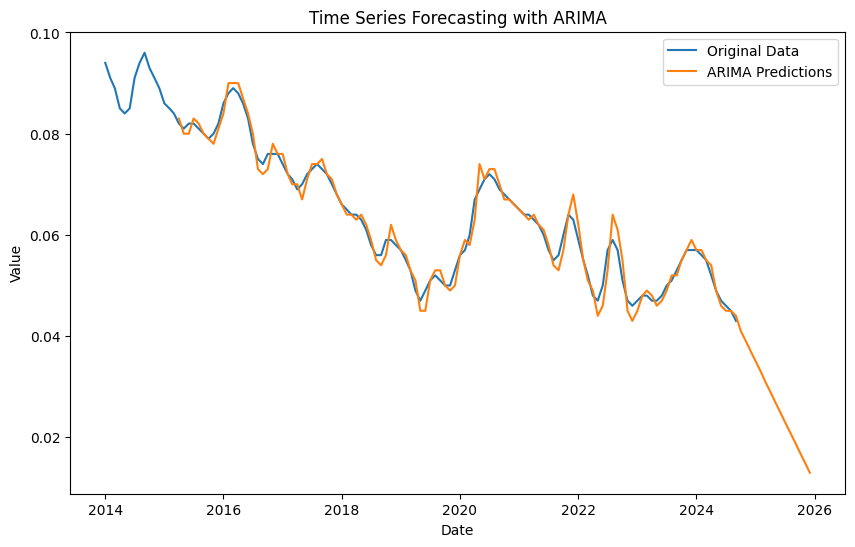

R^2 Score for ARIMA: 0.97
ARIMA - MSE: 3.5225225225225396e-06, RMSE: 0.0018768384380448253, MAPE: 2.33%


In [36]:
model_arima(data_filtered,'Latvia', '25+', 'Female')

## 25+, Total

In [37]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Total')

In [38]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9716
Strong seasonality detected.


(0.9715671806491789, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1135.026, Time=2.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1022.457, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1121.286, Time=0.70 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1106.137, Time=2.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1084.044, Time=1.46 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1131.427, Time=1.19 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1125.220, Time=2.16 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1121.948, Time=2.92 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=4.36 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1129.785, Time=1.79 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1137.491, Time=1.59 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1086.117, Time=0.70 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1128.446, Time=1.25 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1126.554, Time=1.94 sec
 ARIMA(2,1,

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


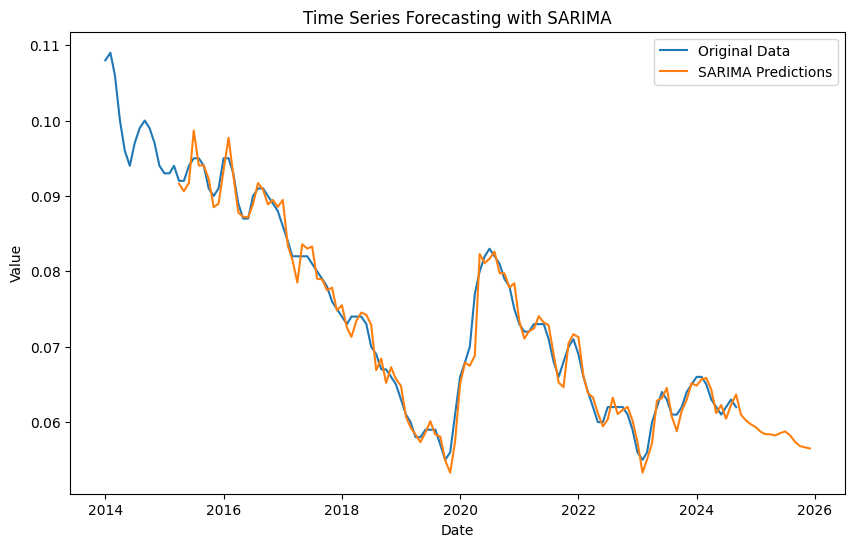

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 2.737667506394439e-06, RMSE: 0.0016545898302583752, MAPE: 1.71%


In [39]:
model_sarima(data_filtered,'Latvia', '25+', 'Total')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1243.029, Time=1.47 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1247.031, Time=0.13 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1245.762, Time=0.23 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1245.007, Time=0.48 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1249.020, Time=0.06 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 2.376 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  129
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 625.510
Date:                Fri, 08 Nov 2024   AIC                          -1249.020
Time:                        20:17:20   BIC                          -1246.176
Sample:                    01-01-2014   HQIC                         -1247.864
                         - 09-01-2024                                         
Covariance Type:                  o

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


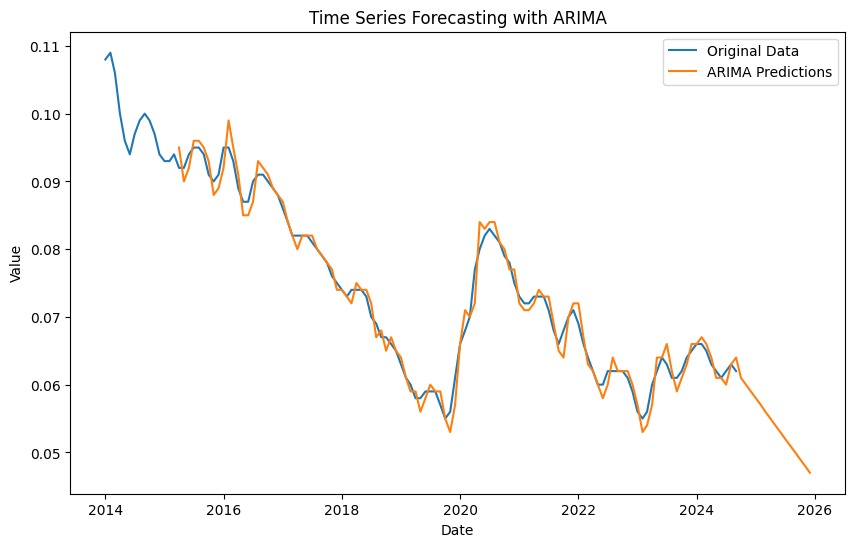

R^2 Score for ARIMA: 0.98
ARIMA - MSE: 2.810806029388921e-06, RMSE: 0.0016765458625963446, MAPE: 1.78%


In [40]:
model_arima(data_filtered,'Latvia', '25+', 'Total')

# Lithuania

## 15-24,Male

In [41]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Male')

In [42]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7065
Strong seasonality detected.


(0.7065319097842284, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1209.994, Time=2.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1170.855, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1195.386, Time=0.30 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1211.507, Time=0.89 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1169.142, Time=0.16 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1206.024, Time=1.28 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.47 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1195.266, Time=0.58 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1208.688, Time=2.37 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1212.711, Time=0.45 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1207.390, Time=1.09 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1196.894, Time=0.15 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1209.548, Time=1.96 sec
 ARIMA(1,1,0)(0,1

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


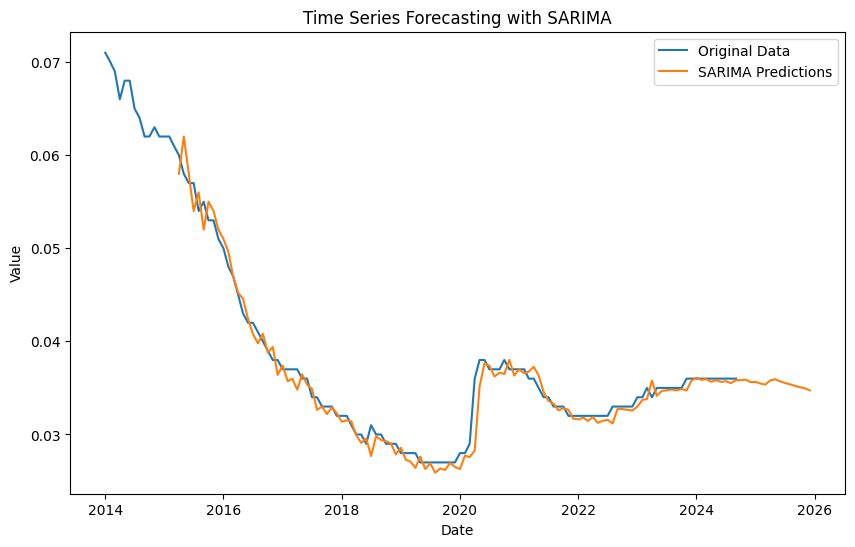

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 1.7513543108364202e-06, RMSE: 0.0013233874379169617, MAPE: 2.37%


In [99]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1362.949, Time=0.68 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1301.635, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1342.555, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1368.435, Time=0.36 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1303.641, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-1366.249, Time=0.88 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1365.516, Time=0.13 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-1370.323, Time=0.07 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-1364.882, Time=0.42 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-1368.139, Time=0.17 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=-1344.542, Time=0.03 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-1367.393, Time=0.56 sec

Best model:  ARIMA(0,2,1)(0,0,0)[0]          
Total fit time: 3.426 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


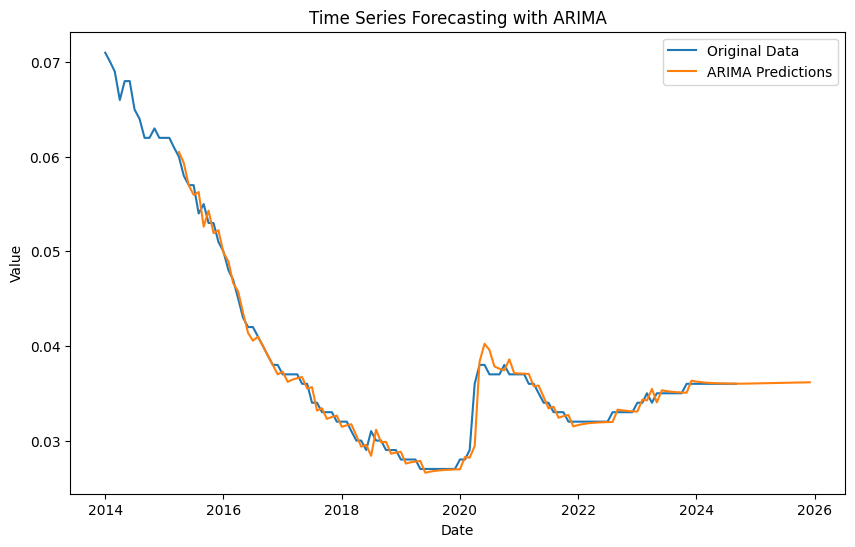

R^2 Score for ARIMA: 0.98
ARIMA - MSE: 1.0430511104605362e-06, RMSE: 0.0010212987371286308, MAPE: 1.78%


In [100]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Female

In [45]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Female')

In [46]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8614
Strong seasonality detected.


(0.861356613428324, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-661.947, Time=2.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-596.731, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-638.425, Time=0.85 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-606.378, Time=0.18 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.94 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-662.087, Time=1.93 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-661.201, Time=2.28 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-663.365, Time=2.10 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-662.192, Time=2.14 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=2.06 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-661.789, Time=2.13 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=2.01 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


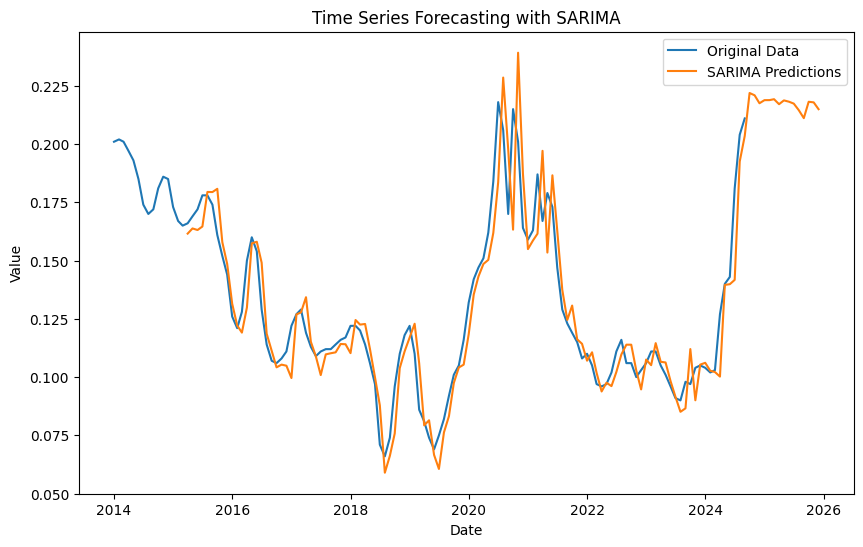

R^2 Score for SARIMA: 0.85
SARIMA - MSE: 0.0001595076246970276, RMSE: 0.012629632801353633, MAPE: 6.83%


In [47]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Female')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-708.020, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-717.038, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-749.655, Time=0.45 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-710.019, Time=0.03 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-755.799, Time=0.17 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-762.471, Time=0.84 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-760.808, Time=0.71 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-758.392, Time=0.49 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-758.557, Time=0.13 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-756.676, Time=0.62 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-753.198, Time=0.20 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-763.683, Time=0.52 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-761.100, Time=0.21 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-758.202, Time=0.45 sec
 ARIMA(2,2,2)(0

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


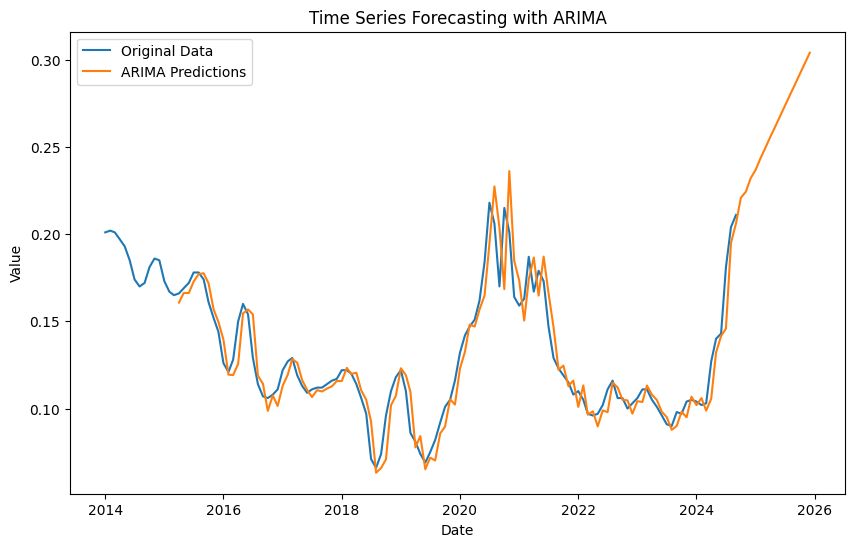

R^2 Score for ARIMA: 0.87
ARIMA - MSE: 0.00013528869824085344, RMSE: 0.011631366997943683, MAPE: 6.56%


In [48]:
model_arima(data_filtered,'Lithuania', '15-24', 'Female')

## 15-24, Total

In [49]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Total')

In [50]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8138
Strong seasonality detected.


(0.8137645287815473, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.70 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-594.019, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-619.689, Time=0.57 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.50 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-597.912, Time=0.10 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-629.254, Time=1.44 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-642.502, Time=2.42 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-642.846, Time=0.93 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=2.37 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=2.19 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=2.40 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-643.403, Time=1.72 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=1

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


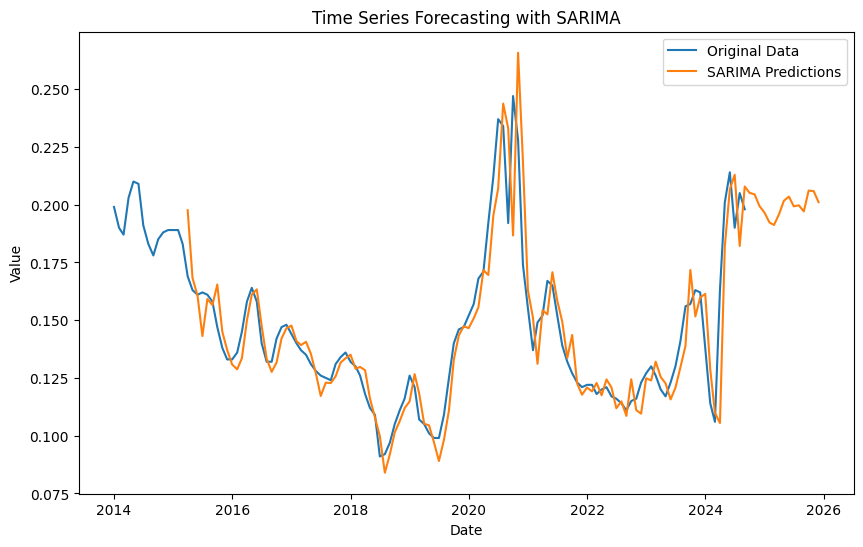

R^2 Score for SARIMA: 0.79
SARIMA - MSE: 0.00019273765397064238, RMSE: 0.013882998738408153, MAPE: 5.96%


In [51]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-724.735, Time=0.79 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-675.279, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-684.382, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-677.279, Time=0.05 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-719.984, Time=0.50 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-726.723, Time=0.42 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-725.003, Time=0.44 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-727.433, Time=1.09 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-729.830, Time=0.62 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,2,3)(0,0,0)[0] intercept
Total fit time: 5.973 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:          

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization fa

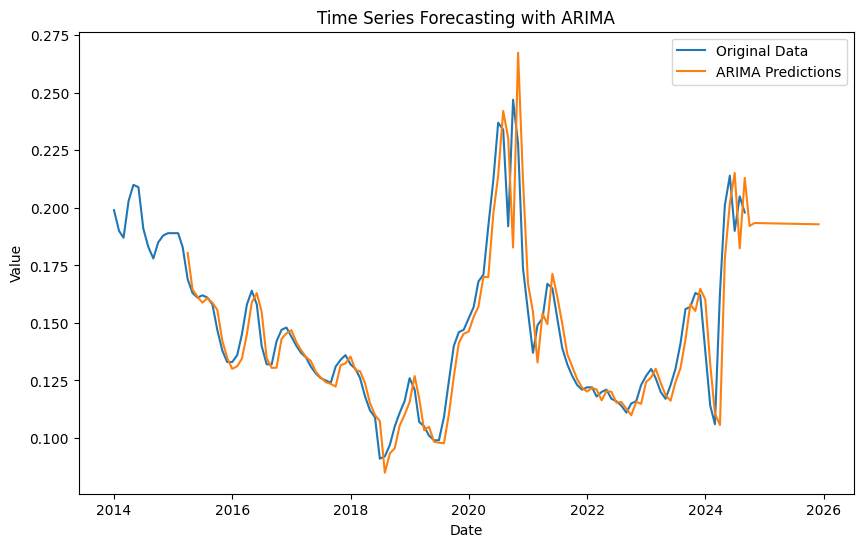

R^2 Score for ARIMA: 0.81
ARIMA - MSE: 0.00017417707931052605, RMSE: 0.013197616425344618, MAPE: 5.25%


In [52]:
model_arima(data_filtered,'Lithuania', '15-24', 'Total')

## 25+, Female

In [53]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Female')

In [54]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9410
Strong seasonality detected.


(0.9409643607337057, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1011.326, Time=1.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-970.685, Time=0.16 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1009.555, Time=0.60 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1012.975, Time=0.82 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-977.890, Time=0.39 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1014.621, Time=0.97 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1007.560, Time=0.83 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-1011.614, Time=0.67 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-999.179, Time=1.91 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1009.197, Time=1.54 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-1013.673, Time=0.69 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-1011.785, Time=2.51 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1008.964, Time=0.98 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1012.202, Time=1.12 sec
 ARIMA(0

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


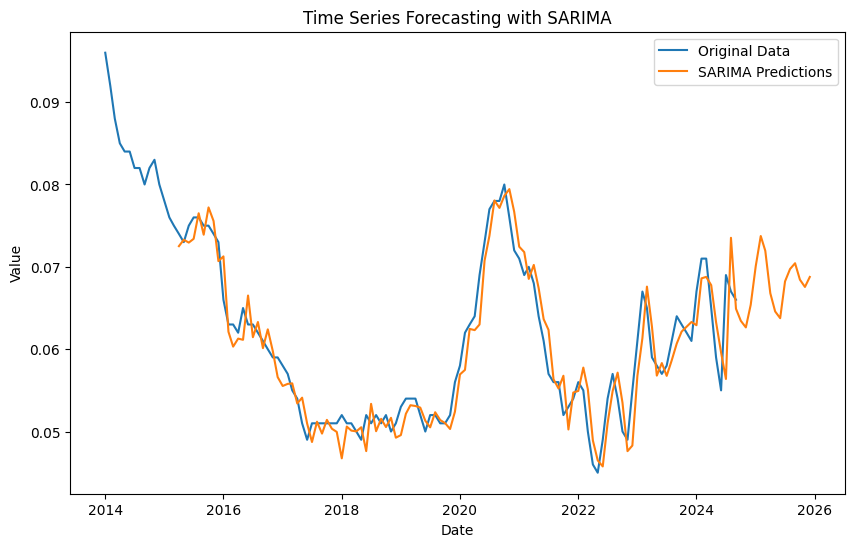

R^2 Score for SARIMA: 0.91
SARIMA - MSE: 6.8829134431350056e-06, RMSE: 0.0026235307208292806, MAPE: 3.67%


In [55]:
model_sarima(data_filtered,'Lithuania', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1127.130, Time=1.22 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1079.944, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1086.445, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1093.864, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1081.939, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1092.037, Time=0.43 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1123.584, Time=0.07 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-1123.687, Time=0.13 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1088.353, Time=0.29 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1121.199, Time=0.84 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-1079.915, Time=0.50 sec

Best model:  ARIMA(1,2,1)(0,0,0)[0] intercept
Total fit time: 3.682 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  129
Model:               SARIMAX

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


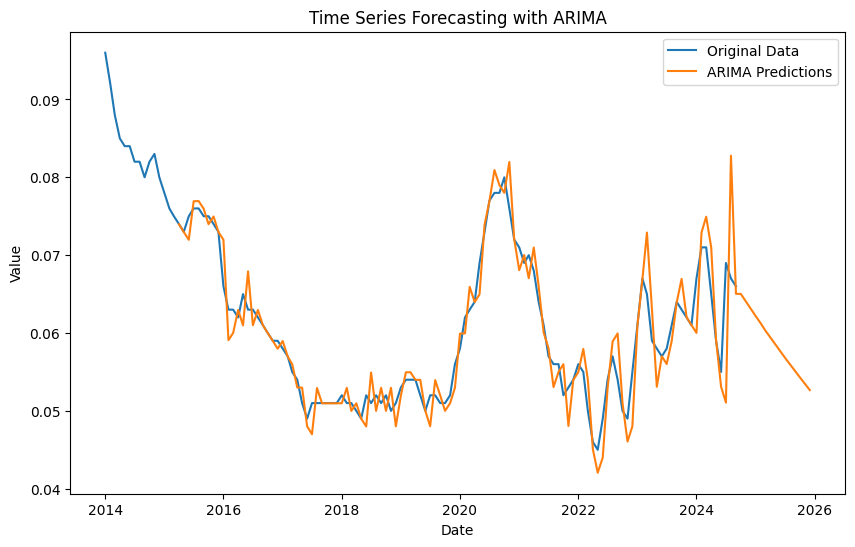

R^2 Score for ARIMA: 0.90
ARIMA - MSE: 7.337508528427222e-06, RMSE: 0.0027087835883339265, MAPE: 3.41%


In [56]:
model_arima(data_filtered,'Lithuania',  '25+', 'Female')

## 25+, Male

In [57]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Male')

In [58]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9531
Strong seasonality detected.


(0.9531364626282429, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-957.031, Time=1.96 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-931.494, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-943.655, Time=0.41 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-959.175, Time=0.80 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-930.721, Time=0.37 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-955.259, Time=1.85 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-965.114, Time=1.93 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=4.22 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=4.15 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=inf, Time=2.09 sec

Best model:  ARIMA(0,1,1)(0,1,2)[12]          
Total 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


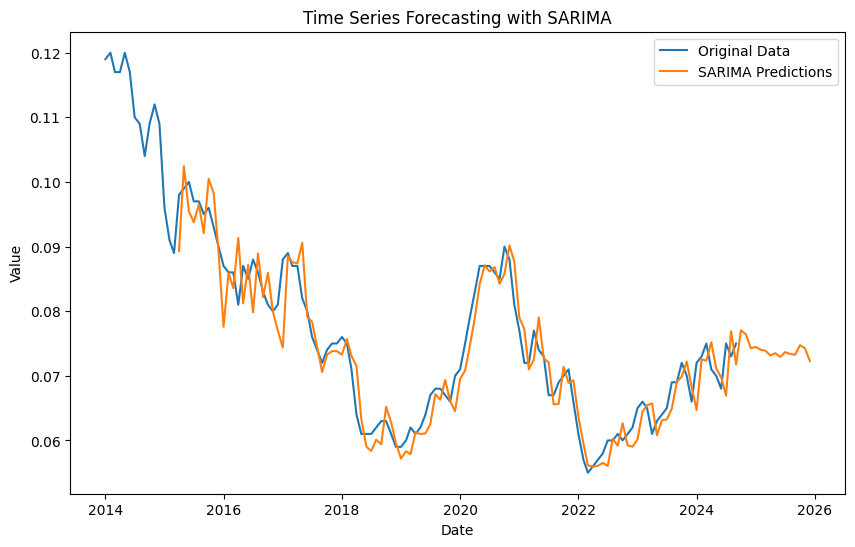

R^2 Score for SARIMA: 0.90
SARIMA - MSE: 1.3507874280668098e-05, RMSE: 0.003675306011840116, MAPE: 3.72%


In [59]:
model_sarima(data_filtered,'Lithuania', '25+', 'Male')

## 25+, Total

In [60]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Total')

In [61]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9579
Strong seasonality detected.


(0.9579229100070005, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1005.052, Time=1.55 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-970.460, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-992.389, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1007.675, Time=0.68 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-969.994, Time=0.78 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1006.311, Time=0.51 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1003.032, Time=1.03 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-991.765, Time=0.59 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-985.580, Time=0.78 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1006.037, Time=0.12 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1007.417, Time=2.16 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1008.131, Time=0.33 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-970.237, Time=0.10 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1006.807, Time=0.67 sec
 ARIMA(1,1,

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


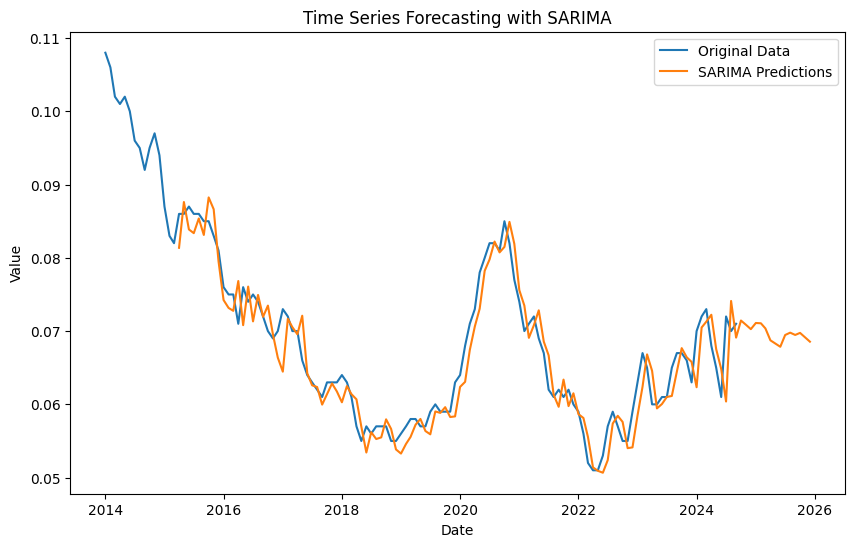

R^2 Score for SARIMA: 0.91
SARIMA - MSE: 8.04193113994259e-06, RMSE: 0.0028358298855789272, MAPE: 3.38%


In [62]:
model_sarima(data_filtered,'Lithuania', '25+', 'Total')

# Slovakia

## 15-24, Female

In [63]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Female')

In [64]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9150
Strong seasonality detected.


(0.9149539977319746, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-741.036, Time=2.33 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-611.246, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-709.675, Time=4.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-728.058, Time=4.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-676.591, Time=0.86 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-730.369, Time=4.21 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=5.75 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-712.872, Time=0.73 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-737.828, Time=1.33 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-737.910, Time=0.09 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-745.543, Time=0.50 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-683.142, Time=0.95 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-743.791, Time=3.04 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=3.06 sec
 ARIMA(2,1,1)(1,1,0)[12]     

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


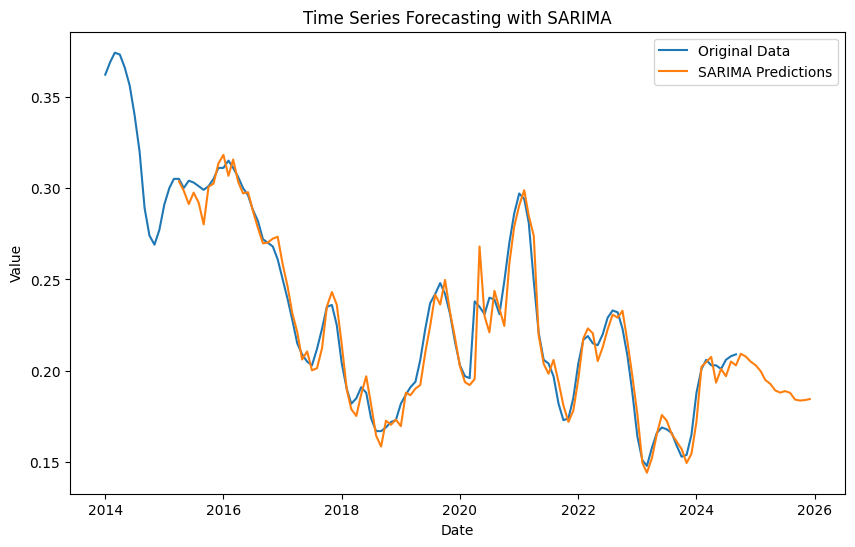

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 8.52225217840249e-05, RMSE: 0.009231604507561234, MAPE: 2.99%


In [65]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Female')

## 15-24, Male

In [66]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Male')

In [67]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9551
Strong seasonality detected.


(0.9550698633372218, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-815.710, Time=2.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-717.372, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-793.729, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-813.601, Time=0.99 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-774.718, Time=0.09 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-817.197, Time=1.70 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-798.029, Time=0.47 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-803.191, Time=3.10 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-812.956, Time=1.71 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-814.136, Time=2.01 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-805.715, Time=2.64 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-809.012, Time=3.45 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-804.161, Time=2.04 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-814.182, Time=1.17 sec
 ARIMA(2,1,1)(1,1,1

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


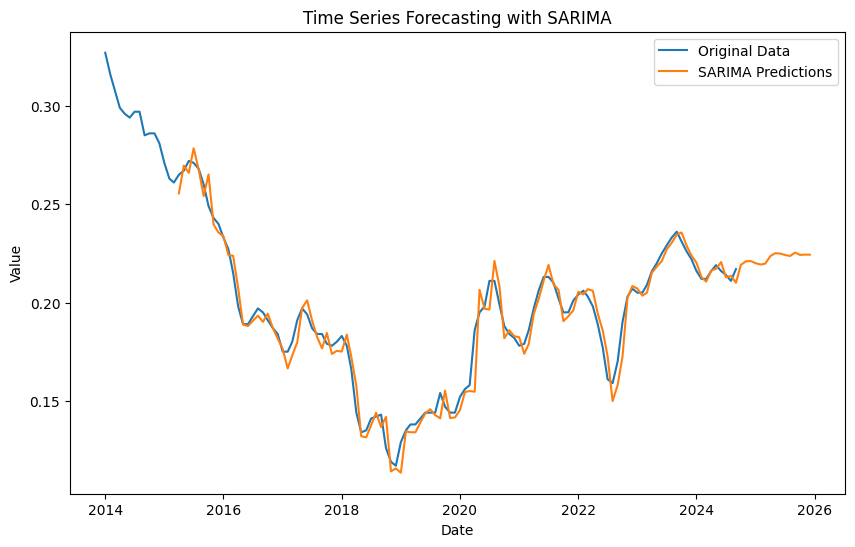

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 4.708781225883299e-05, RMSE: 0.006862055978992957, MAPE: 2.77%


In [68]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Male')

## 15-24, Total

In [69]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Total')

In [70]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9705
Strong seasonality detected.


(0.9705086691280204, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=5.12 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-758.603, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-806.924, Time=3.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-836.374, Time=7.80 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-782.930, Time=0.62 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-829.971, Time=0.90 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.66 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-806.318, Time=0.29 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.86 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-835.940, Time=2.20 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-839.621, Time=1.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-783.044, Time=0.05 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-822.517, Time=0.46 sec
 ARIMA(1,1,0)(0,1,2)[12]             : 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


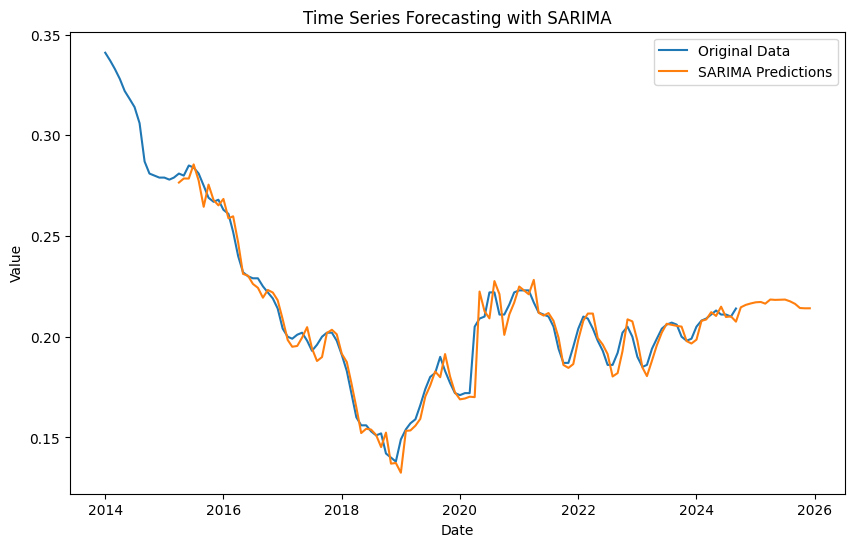

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 3.953501379928424e-05, RMSE: 0.006287687476273311, MAPE: 2.24%


In [71]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Total')

## 25+, Female

In [72]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Female')

In [73]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9963
Strong seasonality detected.


(0.9963075042842627, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1184.427, Time=1.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1119.968, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1174.996, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1181.898, Time=0.57 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1162.163, Time=0.17 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1173.933, Time=0.57 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1172.906, Time=0.29 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1188.200, Time=0.84 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1173.900, Time=2.26 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1178.221, Time=0.47 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1186.587, Time=0.63 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1190.409, Time=0.70 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(1,1,0)(1,1

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


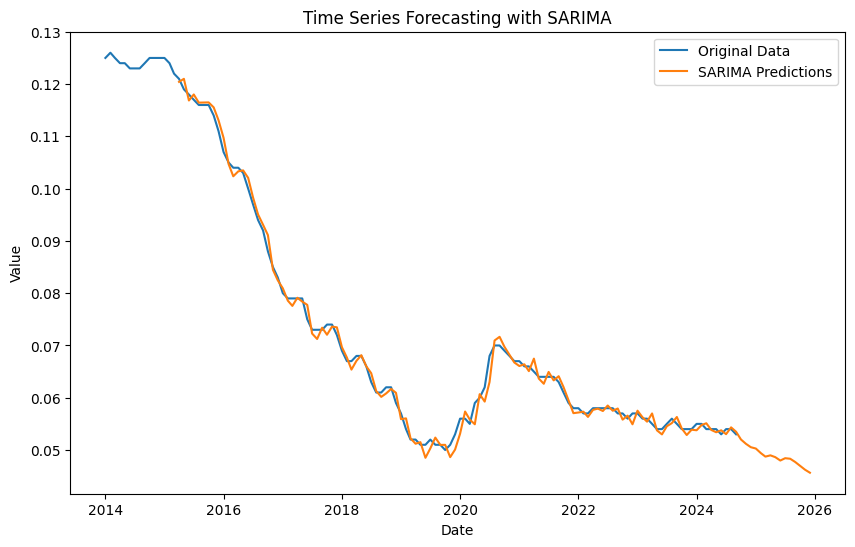

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.9104046529925925e-06, RMSE: 0.00138217388667005, MAPE: 1.63%


In [74]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Female')

## 25+, Male

In [75]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Male')

In [76]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9979
Strong seasonality detected.


(0.9978879030576164, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1247.347, Time=1.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1194.044, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1236.698, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1233.878, Time=0.43 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1206.069, Time=0.11 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1243.602, Time=0.66 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1202.069, Time=1.24 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1243.971, Time=0.34 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1247.498, Time=0.73 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1245.986, Time=1.13 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1240.468, Time=0.81 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1230.910, Time=1.23 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1238.916, Time=0.74 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1245.402, Time=0.79 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


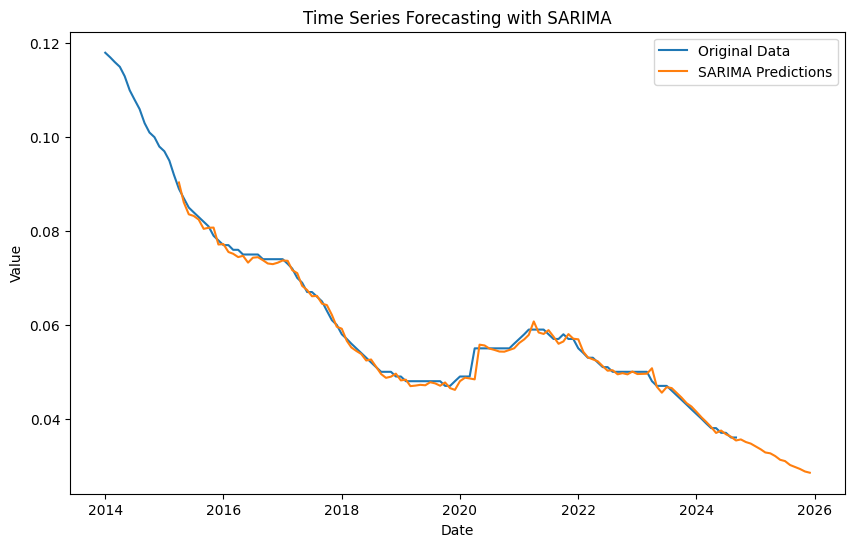

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.1323991877607113e-06, RMSE: 0.001064142465913616, MAPE: 1.36%


In [77]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Male')

## 25+, Total

In [78]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Total')

In [79]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9985
Strong seasonality detected.


(0.9984636299417607, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1256.678, Time=4.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1213.562, Time=0.12 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1238.446, Time=1.02 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1243.530, Time=0.95 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1225.629, Time=1.30 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1250.172, Time=0.94 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1221.629, Time=4.22 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1245.824, Time=0.38 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=5.14 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1247.902, Time=0.51 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1253.842, Time=1.83 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1254.007, Time=1.95 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1236.883, Time=1.65 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1247.257, Time=3.15 sec
 ARIMA(2,1,

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


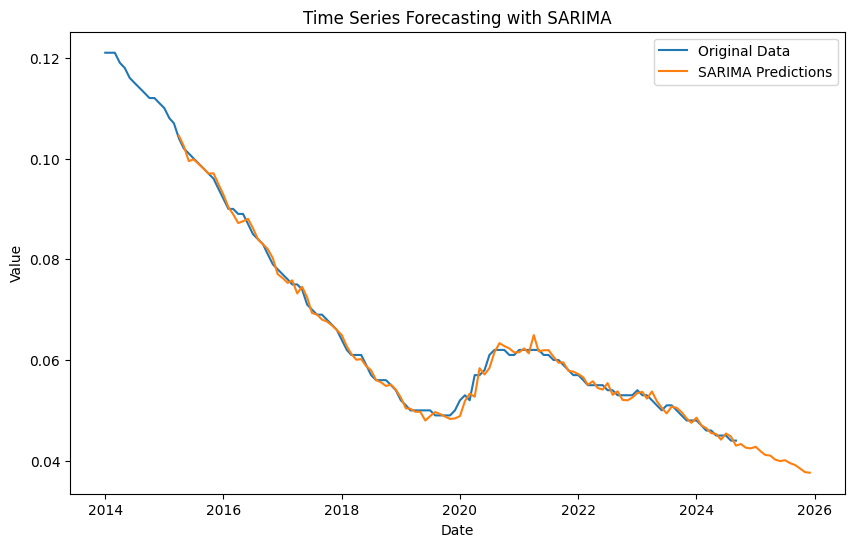

R^2 Score for SARIMA: 1.00
SARIMA - MSE: 1.065954130685873e-06, RMSE: 0.0010324505463632982, MAPE: 1.31%


In [80]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Total')

# Hungary

## 15-24, Female

In [81]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Female')

In [82]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9271
Strong seasonality detected.


(0.9271389426881999, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-725.163, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-759.690, Time=1.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-729.696, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-777.208, Time=3.67 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-778.701, Time=7.36 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-785.907, Time=6.29 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=7.90 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-787.873, Time=1.71 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=2.22 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-782.632, Time=5.34 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-785.0

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


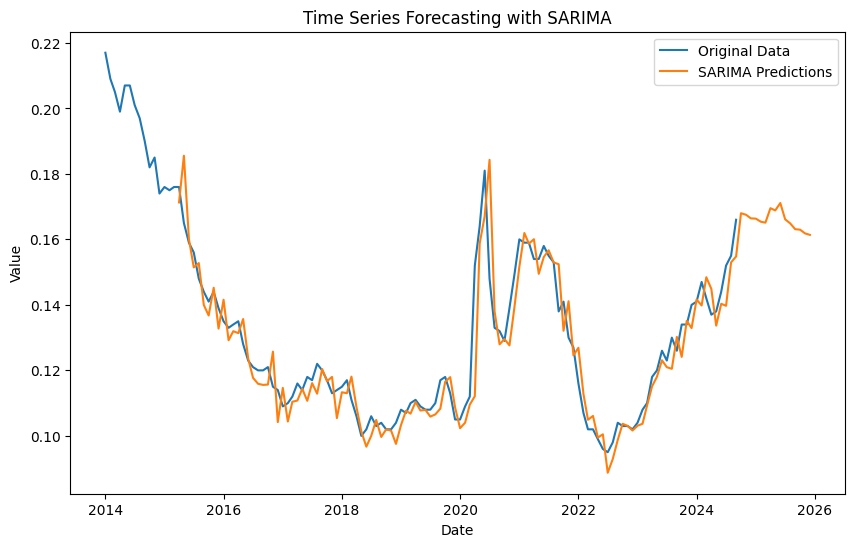

R^2 Score for SARIMA: 0.85
SARIMA - MSE: 5.8299664243030126e-05, RMSE: 0.007635421680760672, MAPE: 3.95%


In [83]:
model_sarima(data_filtered,'Hungary', '15-24', 'Female')

## 15-24, Male

In [84]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Male')

In [85]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9647
Strong seasonality detected.


(0.9646892366040152, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-821.505, Time=2.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-777.316, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-803.109, Time=0.51 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-826.724, Time=0.88 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-786.248, Time=0.07 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-820.291, Time=0.58 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-820.811, Time=0.70 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-803.730, Time=0.45 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-819.610, Time=3.73 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=1.77 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-834.621, Time=7.29 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-795.507, Time=1.37 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-826.192, Time=4.59 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-835.530, Time=12.49 sec
 ARIMA(0,1,2)(1,1,2)[12

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


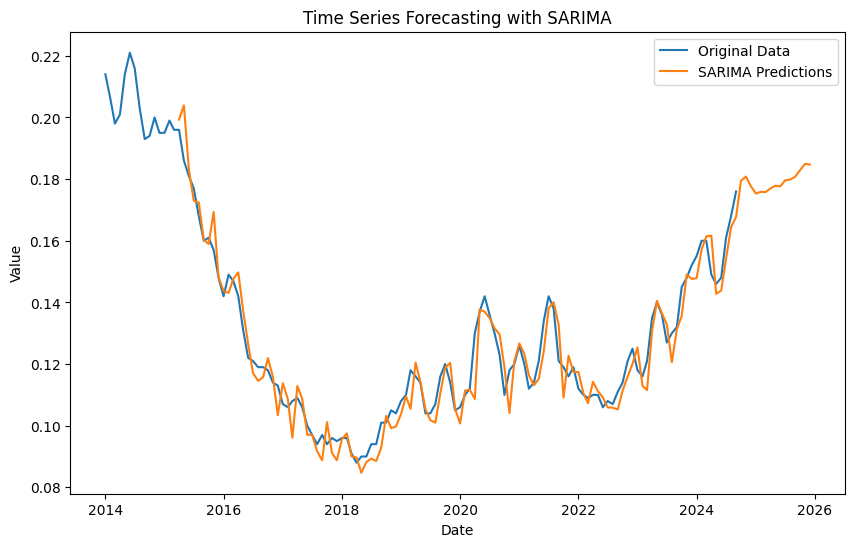

R^2 Score for SARIMA: 0.93
SARIMA - MSE: 3.500421579355613e-05, RMSE: 0.005916436071957182, MAPE: 3.73%


In [86]:
model_sarima(data_filtered,'Hungary', '15-24', 'Male')

## 15-24, Total

In [87]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Total')

In [88]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9573
Strong seasonality detected.


(0.957276205179078, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-821.598, Time=1.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-774.289, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-804.387, Time=0.70 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-821.589, Time=0.42 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-778.524, Time=0.63 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.82 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-827.287, Time=2.61 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.96 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-825.850, Time=0.85 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-829.239, Time=1.94 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-823.624, Time=0.18 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=2.01 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-827.932, Time=1.36 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-817.555, Time=0.83 sec
 ARIMA(2,1,0)(0,1,2)[12]          

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


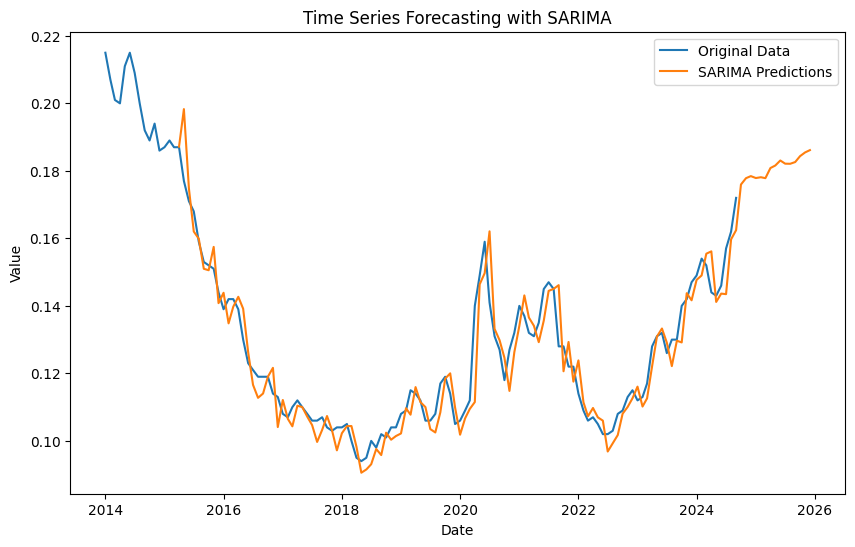

R^2 Score for SARIMA: 0.89
SARIMA - MSE: 4.150990636174381e-05, RMSE: 0.006442818200271043, MAPE: 3.76%


In [89]:
model_sarima(data_filtered,'Hungary', '15-24', 'Total')

## 25+, Female

In [90]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Female')

In [91]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9896
Strong seasonality detected.


(0.9896422360018663, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1166.264, Time=1.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1122.985, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1147.753, Time=0.45 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1169.049, Time=0.69 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1121.500, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1165.163, Time=0.68 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1117.501, Time=0.19 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1147.802, Time=0.51 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1139.005, Time=1.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1170.264, Time=0.67 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1166.583, Time=1.09 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1118.984, Time=0.81 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1149.542, Time=0.09 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1140.635, Time=1.13 sec
 ARIM

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


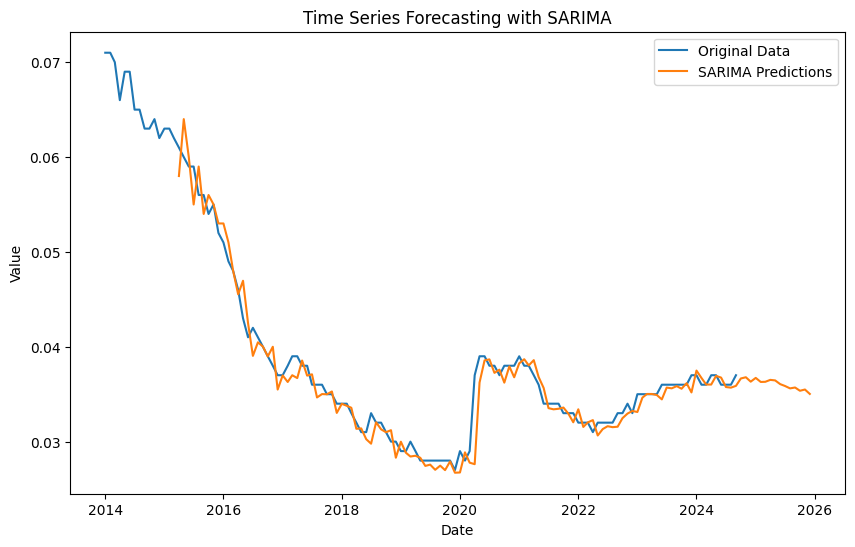

R^2 Score for SARIMA: 0.95
SARIMA - MSE: 2.55499948056744e-06, RMSE: 0.001598436573833144, MAPE: 2.76%


In [92]:
model_sarima(data_filtered,'Hungary', '25+', 'Female')

## 25+, Male

In [93]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Male')

In [94]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9929
Strong seasonality detected.


(0.9928584849989366, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1209.039, Time=2.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1174.267, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1196.860, Time=0.61 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1210.305, Time=0.55 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1172.481, Time=0.39 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1204.537, Time=1.22 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.60 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1196.433, Time=0.60 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1211.739, Time=0.43 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1206.226, Time=1.07 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1198.512, Time=0.43 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=2.52 sec
 ARIMA(1,1,0)(0,1,1)[12]     

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


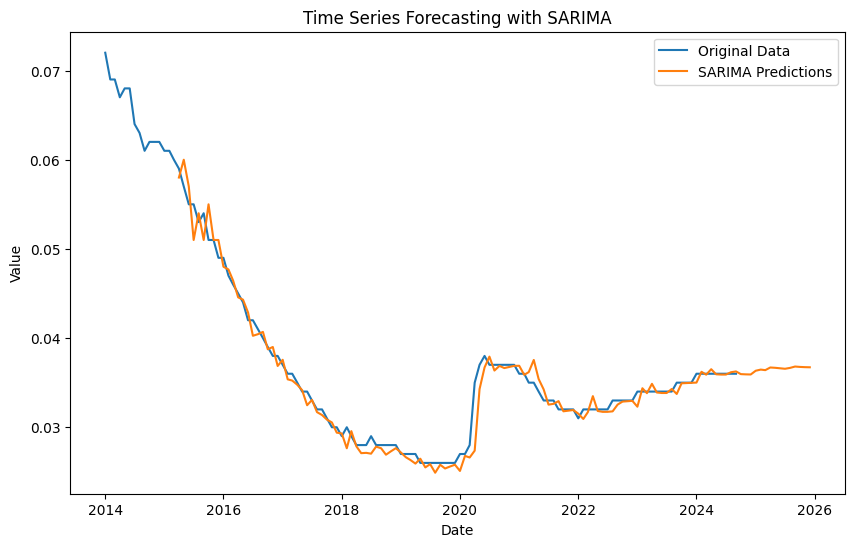

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 1.7262131765363184e-06, RMSE: 0.0013138543208957066, MAPE: 2.28%


In [95]:
model_sarima(data_filtered,'Hungary', '25+', 'Male')

## 25+, Total

In [96]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Total')

In [97]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9928
Strong seasonality detected.


(0.9928035179818278, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1209.994, Time=2.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1170.855, Time=0.11 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1195.386, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1211.507, Time=0.94 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1169.142, Time=0.37 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1206.024, Time=1.19 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.42 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1195.266, Time=0.58 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1208.688, Time=2.47 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1212.711, Time=0.42 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1207.390, Time=0.97 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.47 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1196.894, Time=0.13 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1209.548, Time=1.80 sec
 ARIMA(1,1,0)(0,1

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


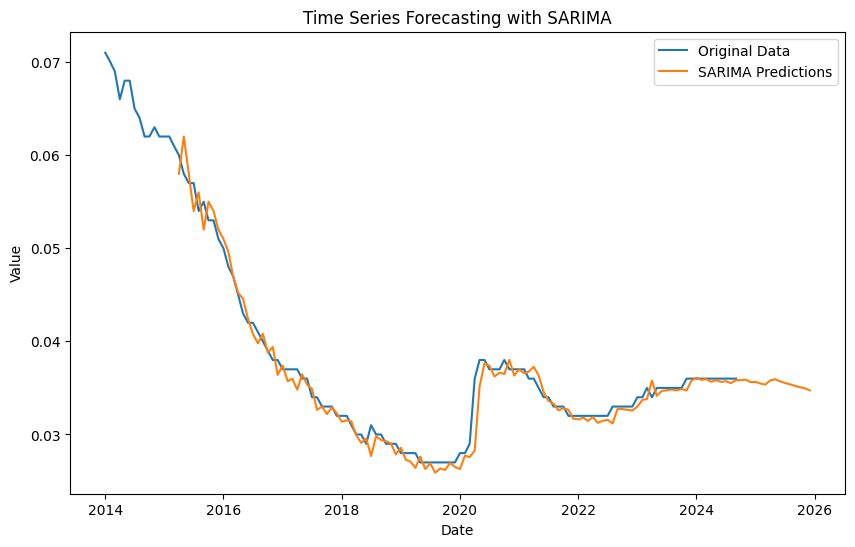

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 1.7513543108364202e-06, RMSE: 0.0013233874379169617, MAPE: 2.37%


In [98]:
model_sarima(data_filtered,'Hungary', '25+', 'Total')

# USA

## 15-24, Male

In [101]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Male')

In [102]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6633
Weak or no seasonality detected.


(0.6632541493219417, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-547.148, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-573.776, Time=0.98 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-546.667, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-579.640, Time=2.70 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.05 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-579.718, Time=0.92 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-574.390, Time=0.20 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-580.963, Time=0.98 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-574.594, Time=0.19 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, T

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


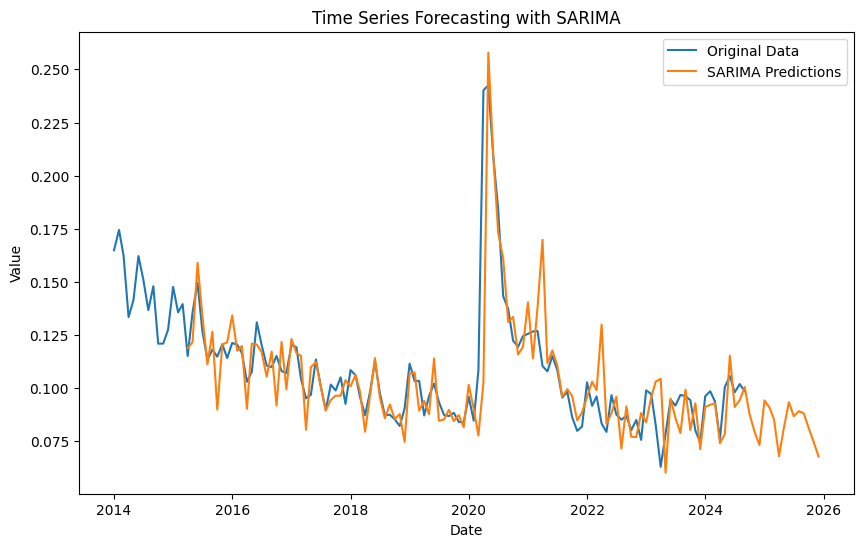

R^2 Score for SARIMA: 0.56
SARIMA - MSE: 0.0003285823592918775, RMSE: 0.018126840852500402, MAPE: 9.26%


In [103]:
model_sarima(data_filtered,'United States of America', '15-24', 'Male')

C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-655.996, Time=1.73 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-589.692, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-601.714, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.19 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-591.690, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-660.228, Time=9.36 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-660.085, Time=2.36 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-658.467, Time=5.08 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-657.256, Time=0.98 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-662.590, Time=0.55 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,2,3)(0,0,0)[0] intercept
Total fit time: 23.346 seconds
                               SARIMAX Results                                
Dep. Variable:         

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization fa

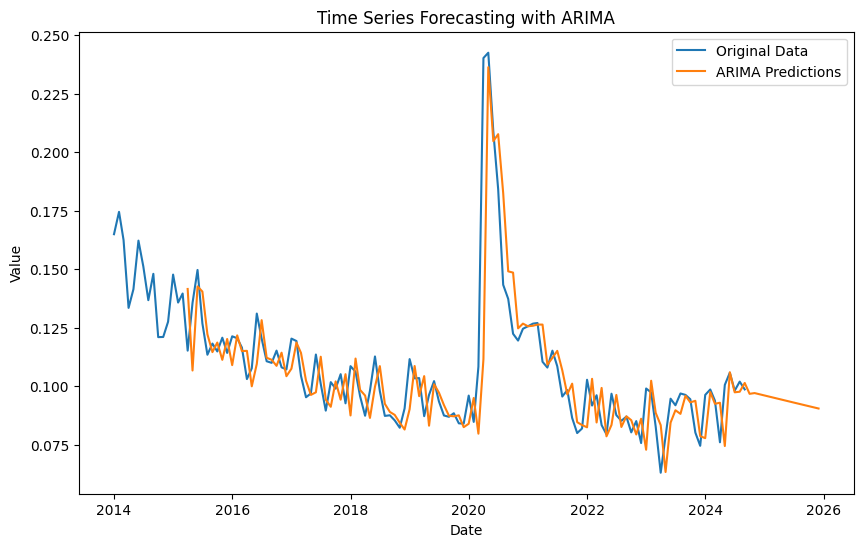

R^2 Score for ARIMA: 0.62
ARIMA - MSE: 0.00028823278268074484, RMSE: 0.016977419788670622, MAPE: 9.07%


In [104]:
model_arima(data_filtered,'United States of America', '15-24', 'Male')

## 15-24, Female

In [105]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Female')

In [106]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.5897
Weak or no seasonality detected.


(0.5896953440212638, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=5.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-472.505, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-496.818, Time=0.78 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-470.510, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-504.482, Time=5.14 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=3.82 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=4.06 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-506.482, Time=2.91 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-498.817, Time=0.17 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=5.86 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=2.16 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-504.482, Time=2.06 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-510.964, Time=3.36 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=inf, T

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


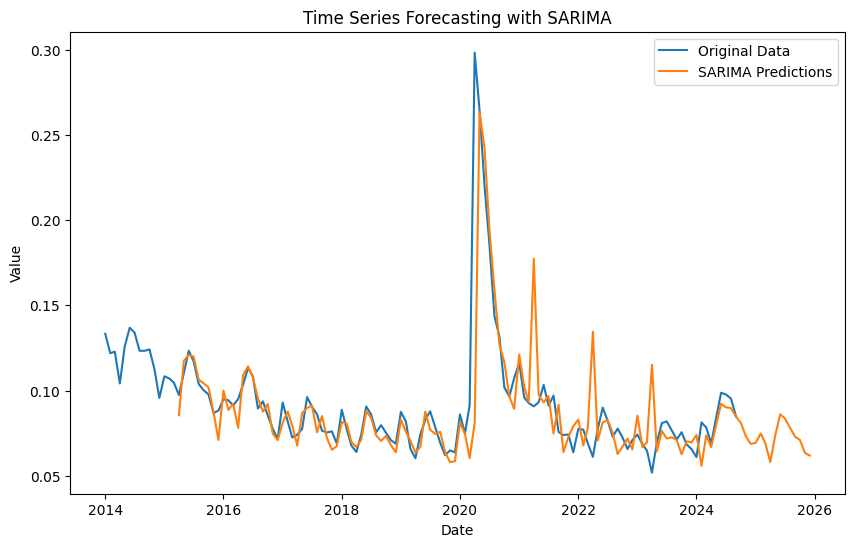

R^2 Score for SARIMA: 0.45
SARIMA - MSE: 0.0006516600560735247, RMSE: 0.025527633185893375, MAPE: 11.24%


In [107]:
model_sarima(data_filtered,'United States of America', '15-24', 'Female')

C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-517.813, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-538.268, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-519.813, Time=0.05 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-557.324, Time=2.51 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-560.540, Time=0.72 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.70 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-562.525, Time=0.23 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-559.320, Time=0.11 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=inf, Time=0.74 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=1.43 sec

Best model:  ARIMA(3,2,0)(0,0,0)[0]          
Total fit time: 12.152 seconds
                               SARIMAX Results     

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


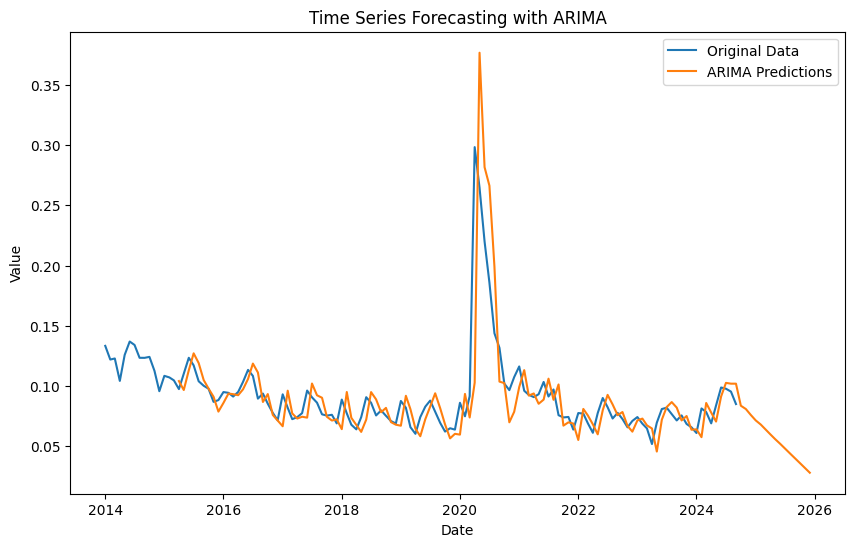

R^2 Score for ARIMA: 0.39
ARIMA - MSE: 0.0007224339222778604, RMSE: 0.026878130929770032, MAPE: 13.16%


In [108]:
model_arima(data_filtered,'United States of America', '15-24', 'Female')

## 15-24, Total

In [109]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Total')

In [110]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6263
Weak or no seasonality detected.


(0.6263438057495727, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-515.659, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-541.392, Time=1.98 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=3.36 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-514.452, Time=0.14 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-548.098, Time=0.89 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.63 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=4.29 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-549.185, Time=2.29 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-542.619, Time=1.47 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=5.49 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=2.52 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-548.647, Time=2.28 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-546.809, Time=2.30 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=-547.2

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


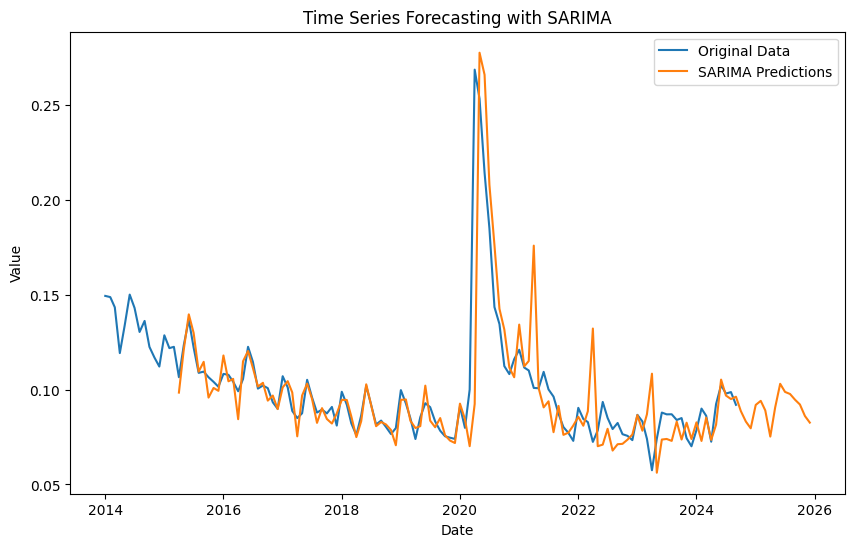

R^2 Score for SARIMA: 0.47
SARIMA - MSE: 0.0004918435711115504, RMSE: 0.02217754655302408, MAPE: 9.52%


In [111]:
model_sarima(data_filtered,'United States of America', '15-24', 'Total')

C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-567.811, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-581.492, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-569.811, Time=0.05 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-601.689, Time=1.75 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-605.283, Time=0.97 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-636.931, Time=2.47 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-641.533, Time=0.40 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-634.467, Time=4.71 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-635.413, Time=0.96 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=2.26 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 18.335 seconds
                               SARIMAX Re

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


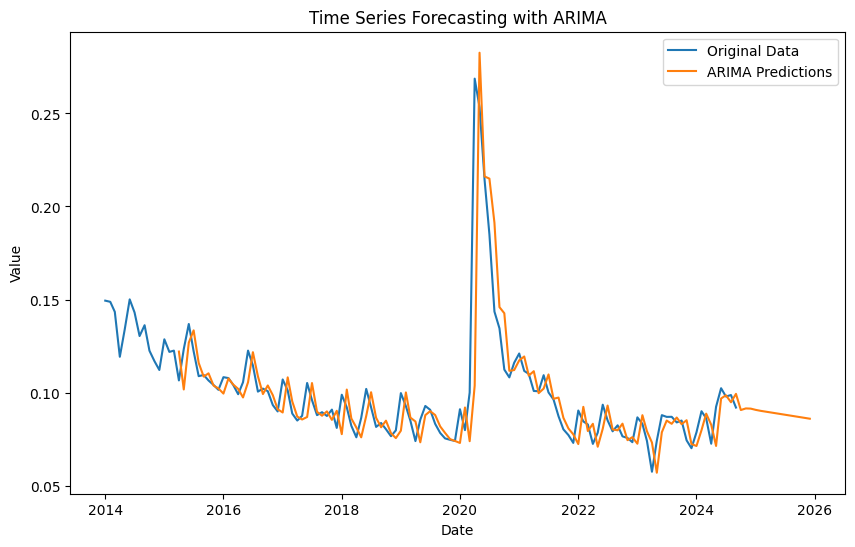

R^2 Score for ARIMA: 0.60
ARIMA - MSE: 0.00036955065449026066, RMSE: 0.01922370033292916, MAPE: 8.73%


In [112]:
model_arima(data_filtered,'United States of America', '15-24', 'Total')

## 25+, Male

In [113]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Male')

In [114]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6994
Weak or no seasonality detected.


(0.6994129379486602, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=6.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-700.183, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-726.114, Time=0.55 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.57 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-698.248, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-733.001, Time=2.00 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=12.45 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-753.543, Time=0.94 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-750.714, Time=0.16 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-750.861, Time=2.55 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-752.188, 

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


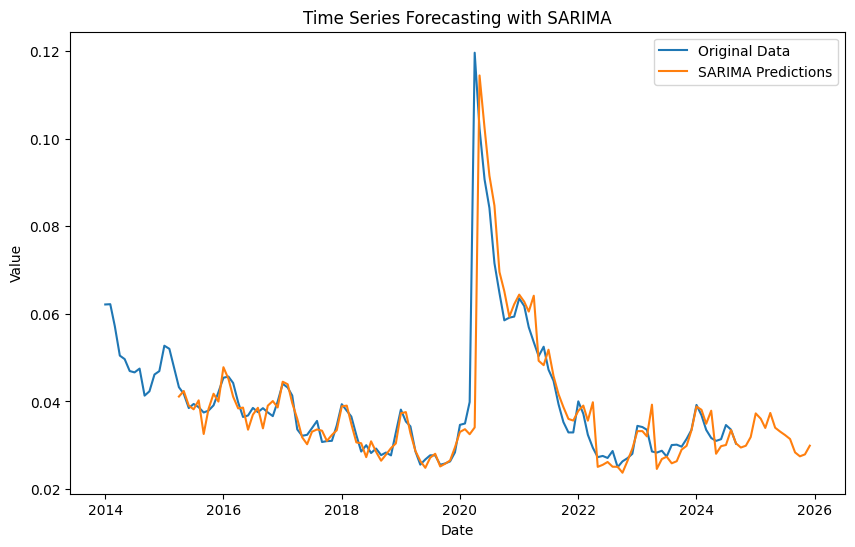

R^2 Score for SARIMA: 0.66
SARIMA - MSE: 7.878822221581428e-05, RMSE: 0.008876272991284928, MAPE: 6.81%


In [115]:
model_sarima(data_filtered,'United States of America', '25+', 'Male')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-831.983, Time=0.86 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-770.122, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-800.891, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-772.121, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-849.585, Time=0.63 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-817.523, Time=0.08 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-847.328, Time=0.58 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-848.025, Time=0.57 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-819.090, Time=0.12 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-843.127, Time=1.23 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.16 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 6.142 seconds
                               SARIMAX Results                                
D

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


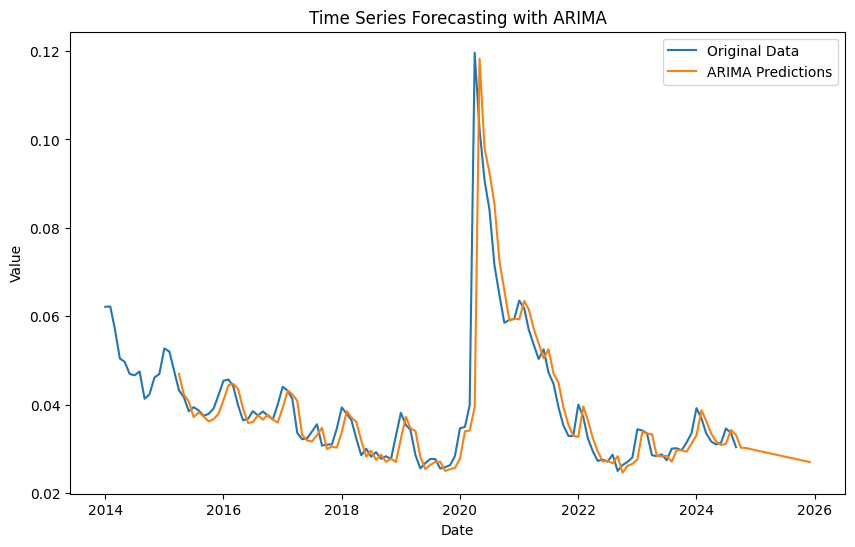

R^2 Score for ARIMA: 0.68
ARIMA - MSE: 7.24125104772129e-05, RMSE: 0.008509554070408914, MAPE: 7.34%


In [116]:
model_arima(data_filtered,'United States of America', '25+', 'Male')

## 25+, Female

In [117]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Female')

In [118]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6430
Weak or no seasonality detected.


(0.6430222497351097, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-697.227, Time=2.55 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-641.211, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-667.227, Time=1.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-695.584, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-637.212, Time=0.11 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.40 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-665.203, Time=0.88 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.27 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-694.823, Time=0.40 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


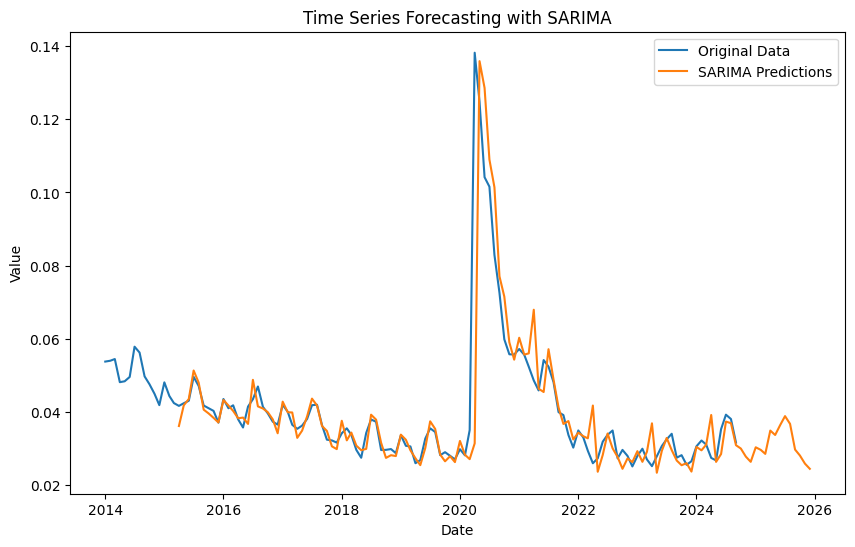

R^2 Score for SARIMA: 0.61
SARIMA - MSE: 0.00012851128080561852, RMSE: 0.011336281612840187, MAPE: 8.23%


In [119]:
model_sarima(data_filtered,'United States of America', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-711.639, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-733.820, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-713.637, Time=0.04 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-753.628, Time=0.54 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-755.214, Time=0.66 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-786.548, Time=0.58 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-777.787, Time=0.55 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-776.783, Time=1.02 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-786.990, Time=0.71 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-787.110, Time=0.19 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-783.277, Time=0.92 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-779.859, Time=0.95 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-781.413, Time=0.61 sec
 ARIMA(2,2,3)(0,0,0)

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


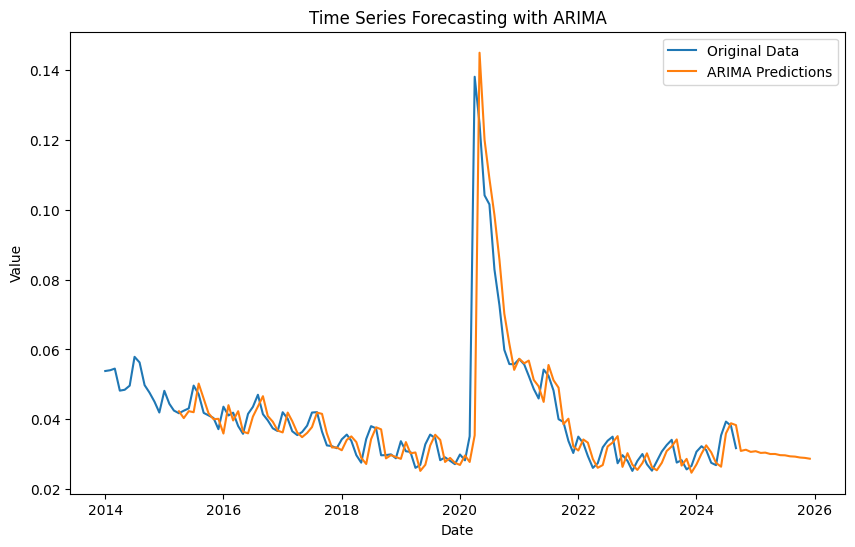

R^2 Score for ARIMA: 0.64
ARIMA - MSE: 0.00011902357635762866, RMSE: 0.010909792681697882, MAPE: 9.31%


In [120]:
model_arima(data_filtered,'United States of America', '25+', 'Female')

## 25+, Total

In [121]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Total')

In [122]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6655
Weak or no seasonality detected.


(0.6654966910814204, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.60 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-672.409, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-698.234, Time=1.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-670.410, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-707.515, Time=0.84 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.42 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-709.515, Time=1.05 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-700.583, Time=0.13 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-725.010, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


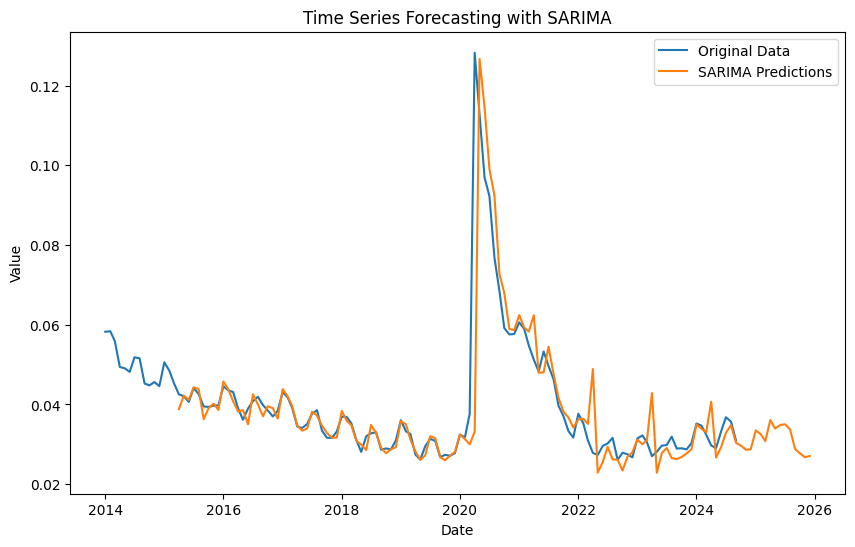

R^2 Score for SARIMA: 0.62
SARIMA - MSE: 0.00010238795397439225, RMSE: 0.010118693293819724, MAPE: 7.34%


In [123]:
model_sarima(data_filtered,'United States of America', '25+', 'Total')

Performing stepwise search to minimize aic


C:\Users\Sofia\cursach\.venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-809.234, Time=1.28 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-744.429, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-770.406, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-746.427, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-823.914, Time=0.37 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-788.985, Time=0.29 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-821.514, Time=0.73 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-821.924, Time=0.65 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-821.358, Time=0.56 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-790.826, Time=0.15 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-817.871, Time=5.39 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=1.91 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 12.253 seconds
                               SARIMAX Results                            

C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Sofia\cursach\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


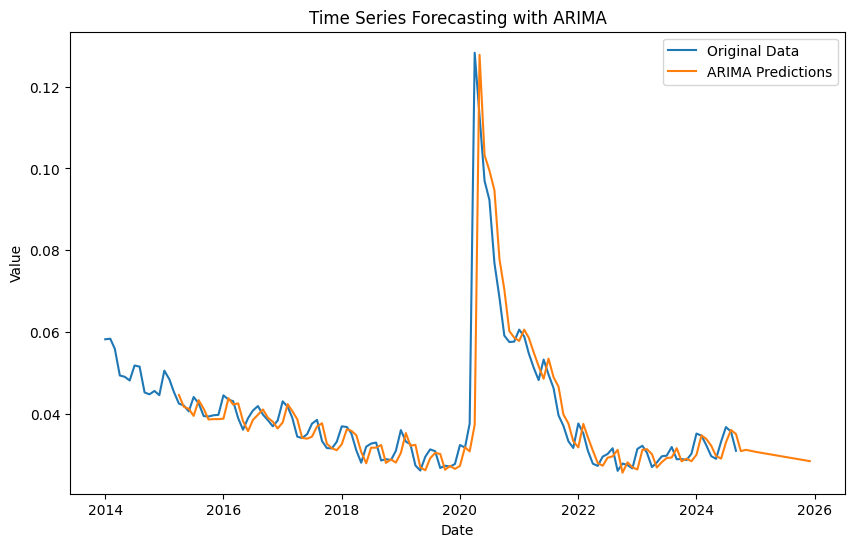

R^2 Score for ARIMA: 0.66
ARIMA - MSE: 8.964844485106554e-05, RMSE: 0.009468286267908545, MAPE: 7.45%


In [124]:
model_arima(data_filtered,'United States of America', '25+', 'Total')

In [125]:
forecast_results_df

,Model,Country,Age,Sex,Date,Forecast,R^2,MSE,RMSE,MAPE
0,SARIMA,Latvia,15-24,Female,2015-04-01,0.161333,0.917815,0.00010,0.009988,0.059977
1,SARIMA,Latvia,15-24,Female,2015-05-01,0.115946,0.917815,0.00010,0.009988,0.059977
2,SARIMA,Latvia,15-24,Female,2015-06-01,0.107404,0.917815,0.00010,0.009988,0.059977
3,SARIMA,Latvia,15-24,Female,2015-07-01,0.112180,0.917815,0.00010,0.009988,0.059977
4,SARIMA,Latvia,15-24,Female,2015-08-01,0.128551,0.917815,0.00010,0.009988,0.059977
...,...,...,...,...,...,...,...,...,...,...
6187,ARIMA,United States of America,25+,Total,2025-08-01,0.029308,0.664276,0.00009,0.009468,0.074488
6188,ARIMA,United States of America,25+,Total,2025-09-01,0.029101,0.664276,0.00009,0.009468,0.074488
6189,ARIMA,United States of America,25+,Total,2025-10-01,0.028894,0.664276,0.00009,0.009468,0.074488
6190,ARIMA,United States of America,25+,Total,2025-11-01,0.028688,0.664276,0.00009,0.009468,0.074488
